# Introduction to DL NLP with BoW

In this tutorial, we will cover:

- Simple BoW model on ready processed `keras.datasets.imdb`.
- NLP data pre-processing on `aclimbd` raw data set.
- Text binarization using keras `Tokenizer`
- Text features using both sklearn and keras Tokenizer: `binary`, `count`, `freq` and `tfidf`
- Introduce Keras `Embedding` layer and how to use it with Bag-of-word vectors model.

In [1]:
from keras.datasets import imdb
from keras.preprocessing.text import text_to_word_sequence
from keras.preprocessing.text import Tokenizer  
from keras.preprocessing.sequence import pad_sequences
from keras import models, layers, losses, metrics, optimizers
from keras.utils.vis_utils import plot_model

import numpy as np
import matplotlib.pyplot as plt

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split

from collections import Counter
from pathlib import Path
import numpy as np
import os
import re
import string
import nltk

nltk.download('punkt')
from nltk.tokenize import word_tokenize
from nltk.corpus import stopwords
nltk.download('stopwords')
from nltk.stem.porter import PorterStemmer
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')
from nltk.corpus import wordnet
import unicodedata
import html
stop_words = stopwords.words('english')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.


In [2]:
# Must Run This Cell Before Using The Pre-Processing:
! python3 -c "import nltk; nltk.download('all')"

[nltk_data] Downloading collection 'all'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/abc.zip.
[nltk_data]    | Downloading package alpino to /root/nltk_data...
[nltk_data]    |   Unzipping corpora/alpino.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data]    | Downloading package averaged_perceptron_tagger_ru to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping
[nltk_data]    |       taggers/averaged_perceptron_tagger_ru.zip.
[nltk_data]    | Downloading package basque_grammars to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping grammars/basque_grammars.zip.
[nltk_data]    | Downloading package biocreative_ppi to
[nltk_data]    |     /root/nltk_data...
[nltk_data]    |   Unzipping corpora/biocreative_ppi.zip.
[nltk_data]    | Downloadin

# Classifying movie reviews with BoW model

__Core ideas:__

1- How text is represented in ML/DL (vocab)

2- Simple Dense keras model

3- Binary classification loss and activation

## The IMDB dataset


We'll be working with "IMDB dataset", a set of 50,000 highly-polarized reviews from the Internet Movie Database. They are split into 25,000 
reviews for training and 25,000 reviews for testing, each set consisting in 50% negative and 50% positive reviews.

Why do we have these two separate training and test sets? You should never test a machine learning model on the same data that you used to 
train it! Just because a model performs well on its training data doesn't mean that it will perform well on data it has never seen, and 
what you actually care about is your model's performance on new data (since you already know the labels of your training data -- obviously 
you don't need your model to predict those). For instance, it is possible that your model could end up merely _memorizing_ a mapping between 
your training samples and their targets -- which would be completely useless for the task of predicting targets for data never seen before. 
We will go over this point in much more detail in the next chapter.

Just like the MNIST dataset, the IMDB dataset comes packaged with Keras. It has already been preprocessed: the reviews (sequences of words) 
have been turned into sequences of integers, where each integer stands for a specific word in a dictionary.

The following code will load the dataset (when you run it for the first time, about 80MB of data will be downloaded to your machine):

In [ ]:
# imdb is a free keras dataset:
from keras.datasets import imdb
(X_train, y_train), (X_test, y_test) = imdb.load_data(num_words=10000)           # انا بختار المعجم بتاعي يبقي من 10 الاف كلمه لان لو اخترت اكتر من كدا او خدت المعجم كله الكود هيبقي بطئ جدا

17473536/17464789 [==============================] - 0s 0us/step



The argument `num_words=10000` means that we will only keep the top 10,000 most frequently occurring words in the training data. Rare words 
will be discarded. This allows us to work with vector data of manageable size.

The variables `train_data` and `test_data` are lists of reviews, each review being a list of word indices (encoding a sequence of words). 
`train_labels` and `test_labels` are lists of 0s and 1s, where 0 stands for "negative" and 1 stands for "positive":

In [ ]:
X_train[0]      # من المعجم جاهزه index جاهز فهلاقي ان كل جمله كل كلمه فيها واخده  pre-processing الداتا دي معمولها 

[1,
 14,
 22,
 16,
 43,
 530,
 973,
 1622,
 1385,
 65,
 458,
 4468,
 66,
 3941,
 4,
 173,
 36,
 256,
 5,
 25,
 100,
 43,
 838,
 112,
 50,
 670,
 2,
 9,
 35,
 480,
 284,
 5,
 150,
 4,
 172,
 112,
 167,
 2,
 336,
 385,
 39,
 4,
 172,
 4536,
 1111,
 17,
 546,
 38,
 13,
 447,
 4,
 192,
 50,
 16,
 6,
 147,
 2025,
 19,
 14,
 22,
 4,
 1920,
 4613,
 469,
 4,
 22,
 71,
 87,
 12,
 16,
 43,
 530,
 38,
 76,
 15,
 13,
 1247,
 4,
 22,
 17,
 515,
 17,
 12,
 16,
 626,
 18,
 2,
 5,
 62,
 386,
 12,
 8,
 316,
 8,
 106,
 5,
 4,
 2223,
 5244,
 16,
 480,
 66,
 3785,
 33,
 4,
 130,
 12,
 16,
 38,
 619,
 5,
 25,
 124,
 51,
 36,
 135,
 48,
 25,
 1415,
 33,
 6,
 22,
 12,
 215,
 28,
 77,
 52,
 5,
 14,
 407,
 16,
 82,
 2,
 8,
 4,
 107,
 117,
 5952,
 15,
 256,
 4,
 2,
 7,
 3766,
 5,
 723,
 36,
 71,
 43,
 530,
 476,
 26,
 400,
 317,
 46,
 7,
 4,
 2,
 1029,
 13,
 104,
 88,
 4,
 381,
 15,
 297,
 98,
 32,
 2071,
 56,
 26,
 141,
 6,
 194,
 7486,
 18,
 4,
 226,
 22,
 21,
 134,
 476,
 26,
 480,
 5,
 144,
 30,
 5535,
 18,

In [ ]:
y_train[0]              # فلو 0 يعني الجمله دي سلبيه ولو 1 يبقي الجمله دي ايجابيه  sentimental analysis انا هنا بعدي علي الجمله كلها عشان اعمل عليها

1

Since we restricted ourselves to the top 10,000 most frequent words, no word index will exceed 10,000:

In [ ]:
max([max(sequence) for sequence in X_train])                # نظرًا لأننا حصرنا أنفسنا في أكثر 10000 كلمة شيوعًا ، فلن يتجاوز فهرس الكلمات 10000 كلمة

9999

For kicks, here's how you can quickly decode one of these reviews back to English words:

In [ ]:
word_index = imdb.get_word_index()          # بتاعتنا من 0 ل 9999 indexs بتاعها وطبعا انا محدد المعجم بتاعي من 10000 كلمه فبالتالي عدد ال  index هيجبلي كل كلمه في القاموس وال
word_index 

1654784/1641221 [==============================] - 0s 0us/step


{'fawn': 34701,
 'tsukino': 52006,
 'nunnery': 52007,
 'sonja': 16816,
 'vani': 63951,
 'woods': 1408,
 'spiders': 16115,
 'hanging': 2345,
 'woody': 2289,
 'trawling': 52008,
 "hold's": 52009,
 'comically': 11307,
 'localized': 40830,
 'disobeying': 30568,
 "'royale": 52010,
 "harpo's": 40831,
 'canet': 52011,
 'aileen': 19313,
 'acurately': 52012,
 "diplomat's": 52013,
 'rickman': 25242,
 'arranged': 6746,
 'rumbustious': 52014,
 'familiarness': 52015,
 "spider'": 52016,
 'hahahah': 68804,
 "wood'": 52017,
 'transvestism': 40833,
 "hangin'": 34702,
 'bringing': 2338,
 'seamier': 40834,
 'wooded': 34703,
 'bravora': 52018,
 'grueling': 16817,
 'wooden': 1636,
 'wednesday': 16818,
 "'prix": 52019,
 'altagracia': 34704,
 'circuitry': 52020,
 'crotch': 11585,
 'busybody': 57766,
 "tart'n'tangy": 52021,
 'burgade': 14129,
 'thrace': 52023,
 "tom's": 11038,
 'snuggles': 52025,
 'francesco': 29114,
 'complainers': 52027,
 'templarios': 52125,
 '272': 40835,
 '273': 52028,
 'zaniacs': 52130,

In [ ]:
# We reverse it, mapping integer indices to words(from 'key, value' to 'value, key')
reverse_word_index = dict([(value, key) for (key, value) in word_index.items()])
reverse_word_index

{34701: 'fawn',
 52006: 'tsukino',
 52007: 'nunnery',
 16816: 'sonja',
 63951: 'vani',
 1408: 'woods',
 16115: 'spiders',
 2345: 'hanging',
 2289: 'woody',
 52008: 'trawling',
 52009: "hold's",
 11307: 'comically',
 40830: 'localized',
 30568: 'disobeying',
 52010: "'royale",
 40831: "harpo's",
 52011: 'canet',
 19313: 'aileen',
 52012: 'acurately',
 52013: "diplomat's",
 25242: 'rickman',
 6746: 'arranged',
 52014: 'rumbustious',
 52015: 'familiarness',
 52016: "spider'",
 68804: 'hahahah',
 52017: "wood'",
 40833: 'transvestism',
 34702: "hangin'",
 2338: 'bringing',
 40834: 'seamier',
 34703: 'wooded',
 52018: 'bravora',
 16817: 'grueling',
 1636: 'wooden',
 16818: 'wednesday',
 52019: "'prix",
 34704: 'altagracia',
 52020: 'circuitry',
 11585: 'crotch',
 57766: 'busybody',
 52021: "tart'n'tangy",
 14129: 'burgade',
 52023: 'thrace',
 11038: "tom's",
 52025: 'snuggles',
 29114: 'francesco',
 52027: 'complainers',
 52125: 'templarios',
 40835: '272',
 52028: '273',
 52130: 'zaniacs',

In [ ]:
# We decode the review; note that our indices were offset by 3
# because 0, 1 and 2 are reserved indices for "padding", "start of sequence", and "unknown".
# بتاع كلمه معينه من ال 10000 كلمه index بعديهم اكيد ده index بتاعت الكلمات بتاعت المعجم بتاعنا واللي بعديهم بقي بيبقوا معانا عادي يعني اي indexes يعني للكلمات الغير معروفه اللي مش موجوده في المعجم وده لان اصلا انا واخد معجم من 10000 كلمه بس ف اكيد في كلمات كتير من اللي موجوده عندي في النص بتاعي اكيد مش هتبقي موجوده في المعجم اللي انا واخده وده لاني مخدتش المعجم بتاع كل كلمات اللغه كلها لانه بيبقي كبير جدا وضامم كلمات هائله فاحنا خدنا اشهر 10000 كلمه من المعجم ده واللي هما اول 10000 كلمه فعشان كدا لو جت كلمه خارج ال 10000 كلمه دول فهتبقي غير معرفه ...... فبالتالي ال 3 اماكن دول محجوزين يعني خارج ال unknown وال 2 محجوز لل start of sequence وال 1 محجوز لل padding هنا هو بيقول اننا خارج ال 0 و 1 و 2 لان ال 0 محجوز لل
decoded_review = ' '.join([reverse_word_index.get(i - 3, '?') for i in X_train[0]])     # فكدا هيحطلي الكلمات كلها جنب بعض وهيعملي مابينهم مسافه يعني وده عشان احول الكلمات جمب بعض لجملة ' '.join() حولهالي ل ? وعن طريق اني بعمل None بتاعها ب index فأنا هنا بقي بقولي اي كلمه ال None بادئه من 0 إلي 9999 فبالتالي هيكتبهالي ب indexes يأما 0 او 1 او 2 لما اتطرح من 3 أصبح سالب فلما يروح يشوف ايه الكلمه اللي بالسالب دي مش هيلاقي لان انا عندي ال index من ال 3 يبقي كده هو بعد الكلمه من انها تاخد اي رقم من الثلاته دول يعني ماتاخودش ولا 0 ولا 1 ولا 2 اللي هما محجوزين دول وبكده ضمنت انه اي رقم كان واخد index فلما بيطرح كل vocab بتاع كل كلمه هيطرحه من ال 3 تب ليه تلاته قولنا عشان دول بتوع تلت اماكن محجوزين في ال index علي الجمله الاولي بحيث هيمسك كل For Loop هيعمل
print(decoded_review)

? this film was just brilliant casting location scenery story direction everyone's really suited the part they played and you could just imagine being there robert ? is an amazing actor and now the same being director ? father came from the same scottish island as myself so i loved the fact there was a real connection with this film the witty remarks throughout the film were great it was just brilliant so much that i bought the film as soon as it was released for ? and would recommend it to everyone to watch and the fly fishing was amazing really cried at the end it was so sad and you know what they say if you cry at a film it must have been good and this definitely was also ? to the two little boy's that played the ? of norman and paul they were just brilliant children are often left out of the ? list i think because the stars that play them all grown up are such a big profile for the whole film but these children are amazing and should be praised for what they have done don't you thi

In [ ]:
len(X_train[0])
# طولها 10000 كلمه وهو في الحقيقه مش اول جمله فيه بس لا دي كل الجمل اللي فيه نفس الطول يعني كلهم 10000 كلمه لاني مجدد المعجم بتاعي يبقي 10000 كلمه بس من كلمات اللغه كلها X_train فهلاقي ان الجمله الاولي من ال 

218

# Bag of Words

The term BoW is used in many different occasions in NLP. In general, it referes to treating every word equally as the others, without consideration of sequential information of the sentence or document. In other words, the context of the words is not considered. 

In some settings, words in the bag are summed, averaged,...etc (or their vectors). In other settings, they are simply mutlipled by different _learnable_ weighting. This is the case we will consider. We will use the `Dense` layer, applied to a _long_ vector of 1's and 0's. The length of that vector is the same as the number of words in our vocab (we specified when loading the data above using the `num_words` param). We will have such vector for every sentence/document of the data. Whenever a word of the vocab is mentioned, we set the corresponding location to 1. Otherwise, it's 0. 

__You can imagine how sparse and inefficient is that vector!__

__In this setting, we are treating the mention or absence of a word as a feature__

The `Dense` layer will assign a _learnable_ weight to each word location. If the word is mentioned, that weight will be multiplied by 1, else it's 0. Then the output of the `Dense` is a number of neurons (hyper param), each represents different weighting of the input long vector of features/words.

The next layers, are just further _refinements_ of the learnt features from the previous layers. Until we reach the final layer, which produces 1 or k outputs according to the problem or task (binary or multi classification).

__Pros__:
- All words are normalized, regardless of their index in the vocab

__Cons__:

- Sparsity = inefficiency = A lot of useless features = confusion of the model = unnecessary big model = more overfitting

- Need to pad to max (again inefficiency): 

This model, requires ALL the data samples to have the same length, sense the `Dense` layer cannot handle variable length input (weight matrix is fixed). This mandates to perform padding

- No context = no sequence = hard to model co-reference, sarcasm, negation...etc

_Example_

Such BoW model has no clue to differentiate the following cases:

- This movie is good --> +

- This movie is bad --> -

- This movie is not good --> -

- This movie is not bad --> +

Simple because it cannot link the context of the words "good" and "bad" to the negatition or affirmation context "not"



## Preparing the data


We cannot feed lists of integers into a neural network. We have to turn our lists into tensors. There are two ways we could do that:

* We could pad our lists so that they all have the same length, and turn them into an integer tensor of shape `(samples, word_indices)`, 
then use as first layer in our network a layer capable of handling such integer tensors (the `Embedding` layer, which we will cover in 
detail later).
* We could one-hot-encode our lists to turn them into vectors of 0s and 1s. Concretely, this would mean for instance turning the sequence 
`[3, 5]` into a 10,000-dimensional vector that would be all-zeros except for indices 3 and 5, which would be ones. Then we could use as 
first layer in our network a `Dense` layer, capable of handling floating point vector data.

We will go with the latter solution. Let's vectorize our data, which we will do manually for maximum clarity:

In [ ]:
def vectorize_sequences(sequences, dimension=10000):
    # Create an all-zero matrix of shape (len(sequences), dimension)
    results = np.zeros((len(sequences), dimension))    # build a zeros matrix, no. of rows is (len of sequences) & no. of columns is (the vocabulary words)
    for i, sequence in enumerate(sequences):
        results[i, sequence] = 1.           # set specific indices of results[i] to 1s  ----  حط مكانها 1 sequence حط مكان الكلمات اللي في ال i فكأني بقوله فالجمله اللي رقمها
    return results

# Our vectorized training data
X_train = vectorize_sequences(X_train)
# Our vectorized test data
X_test = vectorize_sequences(X_test)

Here's what our samples look like now:

In [ ]:
print('X_train: \n\n{}'.format(X_train))
print('===================================\n')
print('X_train shape: {}'.format(X_train.shape))      # --> will be (25000, 10000) , which mean [ 25000 --> number of sentences ] [10000 --> numbers of vocabulary words]
print('===================================\n')
print('y_train: \n\n{}'.format(y_train))
print('===================================\n')
print('y_train shape: {}'.format(y_train.shape))

X_train: 

[[0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]
 ...
 [0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]]

X_train shape: (25000, 10000)

y_train: 

[1 0 0 ... 0 1 0]

y_train shape: (25000,)


In [ ]:
X_train[0]

array([0., 1., 1., ..., 0., 0., 0.])

In [ ]:
X_train[0].shape

(10000,)

We should also vectorize our labels, which is straightforward:

In [ ]:
# Our vectorized labels
y_train = np.asarray(y_train).astype('float32')
y_test = np.asarray(y_test).astype('float32')

Now our data is ready to be fed into a neural network.

## Building our network


Our input data is simply vectors, and our labels are scalars (1s and 0s): this is the easiest setup you will ever encounter. A type of 
network that performs well on such a problem would be a simple stack of fully-connected (`Dense`) layers with `relu` activations: `Dense(16, 
activation='relu')`

The argument being passed to each `Dense` layer (16) is the number of "hidden units" of the layer. What's a hidden unit? It's a dimension 
in the representation space of the layer. You may remember from the previous chapter that each such `Dense` layer with a `relu` activation implements 
the following chain of tensor operations:

`output = relu(dot(W, input) + b)`

Having 16 hidden units means that the weight matrix `W` will have shape `(input_dimension, 16)`, i.e. the dot product with `W` will project the 
input data onto a 16-dimensional representation space (and then we would add the bias vector `b` and apply the `relu` operation). You can 
intuitively understand the dimensionality of your representation space as "how much freedom you are allowing the network to have when 
learning internal representations". Having more hidden units (a higher-dimensional representation space) allows your network to learn more 
complex representations, but it makes your network more computationally expensive and may lead to learning unwanted patterns (patterns that 
will improve performance on the training data but not on the test data).

There are two key architecture decisions to be made about such stack of dense layers:

* How many layers to use.
* How many "hidden units" to chose for each layer.

In the next chapter, you will learn formal principles to guide you in making these choices. 
For the time being, you will have to trust us with the following architecture choice: 
two intermediate layers with 16 hidden units each, 
and a third layer which will output the scalar prediction regarding the sentiment of the current review. 
The intermediate layers will use `relu` as their "activation function", 
and the final layer will use a sigmoid activation so as to output a probability 
(a score between 0 and 1, indicating how likely the sample is to have the target "1", i.e. how likely the review is to be positive). 
A `relu` (rectified linear unit) is a function meant to zero-out negative values, 
while a sigmoid "squashes" arbitrary values into the `[0, 1]` interval, thus outputting something that can be interpreted as a probability.

Here's what our network looks like:

![3-layer network](https://s3.amazonaws.com/book.keras.io/img/ch3/3_layer_network.png)

And here's the Keras implementation, very similar to the MNIST example you saw previously:

In [ ]:
from keras import models, layers

model = models.Sequential()
model.add(layers.Dense(16, activation='relu', input_shape=(10000,)))          # [input_shape] must be as vocabulary words,  this layer will be a very weights for this neuron network because i have shape 10000 and 16 neurons so the weights is (10000 * 16 = 160000 weight) is a very high weights for this network so this is one of the Bag Of Words disadvantages.
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))                              # sigmoid because i have 2 classes for labels (0 & 1)


Lastly, we need to pick a loss function and an optimizer. Since we are facing a binary classification problem and the output of our network 
is a probability (we end our network with a single-unit layer with a sigmoid activation), is it best to use the `binary_crossentropy` loss. 
It isn't the only viable choice: you could use, for instance, `mean_squared_error`. But crossentropy is usually the best choice when you 
are dealing with models that output probabilities. Crossentropy is a quantity from the field of Information Theory, that measures the "distance" 
between probability distributions, or in our case, between the ground-truth distribution and our predictions.

Here's the step where we configure our model with the `rmsprop` optimizer and the `binary_crossentropy` loss function. Note that we will 
also monitor accuracy during training.

In [ ]:
model.compile(optimizer='rmsprop', loss='binary_crossentropy', metrics=['accuracy'])         # binary_crossentropy--> not [sparse_binary_crossentropy] because Bag of words already make sparse values in sentenses vectors


We are passing our optimizer, loss function and metrics as strings, which is possible because `rmsprop`, `binary_crossentropy` and 
`accuracy` are packaged as part of Keras. Sometimes you may want to configure the parameters of your optimizer, or pass a custom loss 
function or metric function. This former can be done by passing an optimizer class instance as the `optimizer` argument:

In [ ]:
from tensorflow.keras.optimizers import RMSprop

model.compile(optimizer= RMSprop(lr=0.001),
              loss='binary_crossentropy',
              metrics=['accuracy'])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


The latter can be done by passing function objects as the `loss` or `metrics` arguments:

In [ ]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras import losses, metrics

model.compile(optimizer= RMSprop(lr=0.001),
              loss= losses.binary_crossentropy,
              metrics= [metrics.binary_accuracy])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


## Validating our approach

In order to monitor during training the accuracy of the model on data that it has never seen before, we will create a "validation set" by 
setting apart 10,000 samples from the original training data:

In [ ]:
# convert data to [train & Validation]
X_val = X_test[:10000]
X_test = X_test[10000:]

y_val = y_test[:10000]
y_test = y_test[10000:]

In [ ]:
print('X_train shape:  {}'.format(X_train.shape))
print('X_val shape:    {}'.format(X_val.shape))
print('X_test shape:   {}'.format(X_test.shape))
print('==============================')
print('y_train shape:  {}'.format(y_train.shape))
print('y_val shape:    {}'.format(y_val.shape))
print('y_test shape:   {}'.format(y_test.shape))

X_train shape:  (25000, 10000)
X_val shape:    (10000, 10000)
X_test shape:   (15000, 10000)
y_train shape:  (25000,)
y_val shape:    (10000,)
y_test shape:   (15000,)


We will now train our model for 20 epochs (20 iterations over all samples in the `x_train` and `y_train` tensors), in mini-batches of 512 
samples. At this same time we will monitor loss and accuracy on the 10,000 samples that we set apart. This is done by passing the 
validation data as the `validation_data` argument:

In [ ]:
history = model.fit(X_train ,
                    y_train ,
                    epochs= 20,
                    batch_size= 512,
                    validation_data= (X_val, y_val))

Epoch 1/20
49/49 [==============================] - 6s 38ms/step - loss: 0.4743 - binary_accuracy: 0.8140 - val_loss: 0.3512 - val_binary_accuracy: 0.8796
Epoch 2/20
49/49 [==============================] - 1s 20ms/step - loss: 0.2693 - binary_accuracy: 0.9073 - val_loss: 0.3120 - val_binary_accuracy: 0.8754
Epoch 3/20
49/49 [==============================] - 1s 18ms/step - loss: 0.2010 - binary_accuracy: 0.9278 - val_loss: 0.2944 - val_binary_accuracy: 0.8829
Epoch 4/20
49/49 [==============================] - 1s 18ms/step - loss: 0.1670 - binary_accuracy: 0.9412 - val_loss: 0.2990 - val_binary_accuracy: 0.8802
Epoch 5/20
49/49 [==============================] - 1s 18ms/step - loss: 0.1420 - binary_accuracy: 0.9519 - val_loss: 0.3299 - val_binary_accuracy: 0.8751
Epoch 6/20
49/49 [==============================] - 1s 18ms/step - loss: 0.1231 - binary_accuracy: 0.9577 - val_loss: 0.3660 - val_binary_accuracy: 0.8666
Epoch 7/20
49/49 [==============================] - 1s 18ms/step - los

On CPU, this will take less than two seconds per epoch -- training is over in 20 seconds. At the end of every epoch, there is a slight pause 
as the model computes its loss and accuracy on the 10,000 samples of the validation data.

Note that the call to `model.fit()` returns a `History` object. This object has a member `history`, which is a dictionary containing data 
about everything that happened during training. Let's take a look at it:

In [ ]:
history_dict = history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

It contains 4 entries: one per metric that was being monitored, during training and during validation. Let's use Matplotlib to plot the 
training and validation loss side by side, as well as the training and validation accuracy:

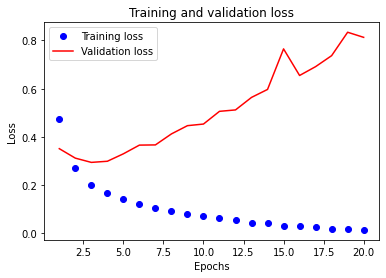

In [ ]:
import matplotlib.pyplot as plt

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()                 # Bag of words لكل كلمه وده بسبب ال input vector واللي معناها اني عندي اصفار كتير في ال input الكبيره دي في ال sparsity علي الفاضي بسبب كميه ال input بسبب ضخامه ال overfitting هنلاحظ ال

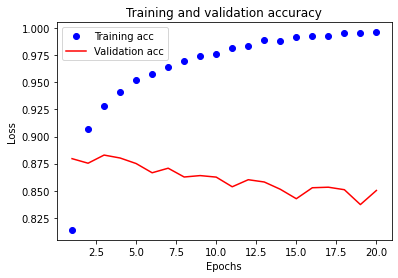

In [ ]:
plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()                 # Bag of words لكل كلمه وده بسبب ال input vector واللي معناها اني عندي اصفار كتير في ال input الكبيره دي في ال sparsity علي الفاضي بسبب كميه ال input بسبب ضخامه ال overfitting هنلاحظ ال

In [ ]:
# Advantages & Disadvantages of Bag Of Words(BOW) ?
### Advantages --> لكلمات الجمل كلها distinct tokenzes بتاعها واللي هو نفس طول عدد كلمات ال vector قدرت تخليلي الجمل كلها ليها نفس طول ال BOW يبقوا نفس الطول فبالتالي ال neuron network اللي يدخل لل input قدر تحللي مشكله ان كل الجمل او النصوص او البراجراف اوالمستند يعني انهم مش نفس الطول ولازم ال

### Disadvantages:
#   1) sparsity --> كلهم نفس الطول vectors للنصوص بيبقي فيه اصفار كتير اللي انا بعملها عشان اخلي كل ال vector وهي ان ال
#   2) position & meaning words in sentenses --> vector space مختلفين تماما عن بعض مع ان الجملتين ليهم نفس المعني فعشان كدا هي مش بتهتم بالمعني وده عيب كبير وحل المشكله دي في تكنيك اسمه Bag of word vector هيعملي لدي فيكتور من اصفار ووحايد مختلف تماما عن التانيه يعني الجملتين هيبقي ليهم what is your age? مع جمله How old are you? فقط وهتقول ان الجمله دي ايجابيه مش سلبيه وكذلك لو اديته جملتين زي مثلا good معناها سلبي فهي هتبص علي كلمه  good مع كلمه not بتضيعلي الاماكن بتاعت كل كلمه او خلينا بشكل ادق نقول انها مش بتهتم بمعني الكلمات بجانب كلمات تانيه فمثلا مش هتفهم ان كلمه BOW وهي ان

# Classifying movie reviews from scratch

So far, we have used the processed IMDB dataset in `keras`. As you have seen, for text to be "usable" in a DNN, we need to transform it into digital form, i.e. integers not strings.

In the basic BoW Dense model, we treat every word as a _feature_

Moreover, for neurons (or ML features in general), we need normalized values [0,1]. Otherwise, words with higher index will be interpretted as higher features importance.

In `keras.datasets.imdb` this digitization was readily made for us. We could see the data represented as numbers:

However, the raw [IMDB](http://ai.stanford.edu/~amaas/data/sentiment/aclImdb_v1.tar.gz ) is just plain text:

In [ ]:
from pathlib import Path
import os
DATA_PATH=Path('./dat/')
DATA_PATH.mkdir(exist_ok=True)
#if not os.path.exists('./dat/aclImdb_v1.tar.gz'):
if not os.path.exists('./dat/aclImdb'):
  !curl -O http://ai.stanford.edu/~amaas/data/sentiment/aclImdb_v1.tar.gz 
  !tar -xf aclImdb_v1.tar.gz -C {DATA_PATH}

The data is already split into train/test. Moreover, we have 3 class folders:

- pos

- neg

- unsup (no specific label)

Let's have a look on the raw data:

In [ ]:
# 'neg', 'pos' <-- ولكن احنا هنشتغل بس علي الاتنين دول unsupervised و negative و  positive اللي هم  classes 3 عندنا عباره عن labels ال
import numpy as np
CLASSES = ['neg', 'pos']#, 'unsup']
PATH=Path('./dat/aclImdb/')          # ./dat/aclImdb/ فبالتالي بقي عندي الداتا المسار بتاعها هو aclImdb فوق وحملت فيه الداتا بتاعتنا اللي اسمها dat اللي فيه الداتا بتاعتنا لاني انا عملت فولدر اسمه Path ده كده خلاص ال

def get_texts(path):
    texts,labels = [],[]
    for idx,label in enumerate(CLASSES):
        for fname in (path/label).glob('*.*'):             # index = 1 ب pos وال index = 0 ب neg ال enumerate هطبعا انا عامل عن طريق ال  /dat/aclImdb/pos وفولدر /dat/aclImdb/neg فأنا بعمل فور لوب بحيث يدخلي علي فولدر pos و neg الداتا اصلا محطوطه في فولدرين اللي هم
            #texts.append(fixup(fname.open('r', encoding='utf-8').read()))
            texts.append(fname.open('r', encoding='utf-8').read())       # labels اللي هي 0 & 1 في الليست اللي اسمها labels ال append وهي texts في الليست اللي اسمها neg & pos ال texts ال append فهو هنا كدا هي
            labels.append(idx)
    #return np.array(texts),np.array(labels)
    return texts, labels


In [ ]:
# /dat/aclImdb/test/neg و /dat/aclImdb/test/pos و /dat/aclImdb/train/neg و /dat/aclImdb/train/pos  <-- مثل الاتي paths فبالتالي هيبق عندي test و train هنا هو هيفضي الفانكشن اللي فوق دي في فولدرين ال 
train_texts,train_labels = get_texts(PATH/'train')
test_texts,test_labels = get_texts(PATH/'test')

In [ ]:
for t in train_texts[:10]:             # here i will read the first 10 texts from train_texts
  print(t)
  print('\n')

Why every horror director wants to imitate "The Exorcist" is a complete riddle to me, as William Friedkin's "classic" is a very overrated film and, in my opinion, not all that tense or shocking. And yet here's another clean rip-off, a Spanish one this time, that shamelessly repeats the story of a young girl that gets possessed by pure evil and turns against her own family. Paul Naschy (who I must admit looks quite hot here) plays the honorable priest who gets approached by John Gibson because his sister Leila's behavior changed drastically since she met her new boyfriend. At first the priest doesn't believe it but when John's body is discovered with its neck twisted, Leila's demonic behavior becomes more noticeable... "Exorcism" is not only very unoriginal, it's also an insufferably boring film! Here Naschy and director Juan Bosch had an open opportunity to make a religiously themed exploitation flick full of shocks and gore, and yet the result is a tame and overall bloodless drama tha

In [ ]:
for t in test_texts[:10]:             # here i will read the first 10 texts from test_texts
  print(t)
  print('\n')

Well let's be fair. Following up a cult classic like Road House is no easy task. Now subtract Swayze from the equation and you get a monumental task. So with Patrick not on board whose bonehead idea was it to proceed anyway and make this piece of garbage? I am going to blame the director who didn't even provide 5 minutes of decent footage throughout the entire film. I was actually shocked they got Will Patton (Armaggedon) to jump on board. Johnathon Schaech did an OK job with the lead but the writing was atrocious. Turning down his partner brunette bombshell (Crystal Mantecon) in the film's first 5 minutes made me want to eject it right there. But I stuck with the film hoping to catch a glimpse of that great cheesy humor that worked so well with the Double Duece. No such luck. The cover of the DVD is hilarious, they show these two stacked blondes who make one 10 second appearance in the film. Costar Ellen Hollman actually puts in a decent performance as well. But again the effort is fu

# So what it takes to go from the raw form to the prepared form?

__A - Text preprocessing__

1- Data sequencing: each sentence --> sequence (list) of words

2- Data cleaning: This step varies from task to task. For some tasks it's better to remove special characters and punctuations, for other they are critical (emotiocons). Good for perfromance.

3- Text normalization: in general text morphology is a big issue in NLP. Upper and lower cases, stemming and lemmatization, ...etc. Again it's task dependent.

4- Padding (model dependent): Dense and CNN. RNN can skip this step.

__B- Text preparation__

5- Binarization/vectorization/digitization: transform words into numbers according to a vocab index.

# `First phase:` Text preprocessing

In this phase, we apply some operations on the text, to make it in the most usable form for the task at hand. Mainly we clean it up to be more appealing to the problem we try to solve. The input is __text__ and the output is a transformed __text__.

In [ ]:
# Pre-Processing هي دي اللي هنعملها ال train_texts هنعتبر ان اول جمله من ال
s = train_texts[0]
s

'Why every horror director wants to imitate "The Exorcist" is a complete riddle to me, as William Friedkin\'s "classic" is a very overrated film and, in my opinion, not all that tense or shocking. And yet here\'s another clean rip-off, a Spanish one this time, that shamelessly repeats the story of a young girl that gets possessed by pure evil and turns against her own family. Paul Naschy (who I must admit looks quite hot here) plays the honorable priest who gets approached by John Gibson because his sister Leila\'s behavior changed drastically since she met her new boyfriend. At first the priest doesn\'t believe it but when John\'s body is discovered with its neck twisted, Leila\'s demonic behavior becomes more noticeable... "Exorcism" is not only very unoriginal, it\'s also an insufferably boring film! Here Naschy and director Juan Bosch had an open opportunity to make a religiously themed exploitation flick full of shocks and gore, and yet the result is a tame and overall bloodless d

## 1- Remove Special Characters:

We can use further special replacements and tanslations:

In [ ]:
# دي ل الترجمه بتاعتها HTML اللي هي بتاعت ال tags ليا اي حروف مش مفهومه زي بعض الحروف الخاصه او  handle الخطوه دي مهمه جدا جدا وبعملها عشان ي
import re
re1 = re.compile(r'  +')
import html

def fixup(x):
    x = x.replace('#39;', "'").replace('amp;', '&').replace('#146;', "'").replace(
        'nbsp;', ' ').replace('#36;', '$').replace('\\n', "\n").replace('quot;', "'").replace(
        '<br />', "\n").replace('\\"', '"').replace('<unk>','u_n').replace(' @.@ ','.').replace(
        ' @-@ ','-').replace('\\', ' \\ ')
    return re1.sub(' ', html.unescape(x))

In [ ]:
s= fixup(s)
s

'Why every horror director wants to imitate "The Exorcist" is a complete riddle to me, as William Friedkin\'s "classic" is a very overrated film and, in my opinion, not all that tense or shocking. And yet here\'s another clean rip-off, a Spanish one this time, that shamelessly repeats the story of a young girl that gets possessed by pure evil and turns against her own family. Paul Naschy (who I must admit looks quite hot here) plays the honorable priest who gets approached by John Gibson because his sister Leila\'s behavior changed drastically since she met her new boyfriend. At first the priest doesn\'t believe it but when John\'s body is discovered with its neck twisted, Leila\'s demonic behavior becomes more noticeable... "Exorcism" is not only very unoriginal, it\'s also an insufferably boring film! Here Naschy and director Juan Bosch had an open opportunity to make a religiously themed exploitation flick full of shocks and gore, and yet the result is a tame and overall bloodless d

## 2- encounter non ascii codes:

We might encounter non ascii codes. In this case we need to decode Unicode characters into a normalized form, such as UTF8.

In [ ]:
 import unicodedata
 text = 'some text'
 unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')

'some text'

In [ ]:
 import unicodedata
 s= unicodedata.normalize('NFKD', s).encode('ascii', 'ignore').decode('utf-8', 'ignore')
 s

'Why every horror director wants to imitate "The Exorcist" is a complete riddle to me, as William Friedkin\'s "classic" is a very overrated film and, in my opinion, not all that tense or shocking. And yet here\'s another clean rip-off, a Spanish one this time, that shamelessly repeats the story of a young girl that gets possessed by pure evil and turns against her own family. Paul Naschy (who I must admit looks quite hot here) plays the honorable priest who gets approached by John Gibson because his sister Leila\'s behavior changed drastically since she met her new boyfriend. At first the priest doesn\'t believe it but when John\'s body is discovered with its neck twisted, Leila\'s demonic behavior becomes more noticeable... "Exorcism" is not only very unoriginal, it\'s also an insufferably boring film! Here Naschy and director Juan Bosch had an open opportunity to make a religiously themed exploitation flick full of shocks and gore, and yet the result is a tame and overall bloodless d

## 3- `1st` text normalization (Remove punctuations)


In [ ]:
# بيبقي ليها معني وبتعبر عن تعبيرات معينه مثل الانفعالات او التعجبات وهكذا punctuations علي طول لأن اوقات كتير ال word_tokenize معملش كل اللي فوق ده وهستخدم ال punctuations لو انا محتاج ال

In [ ]:
import nltk
nltk.download('punkt')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
# panctuations مع ال split اخطاء لو عملت
ss = 'human-like robots are dump'
re.split(r'\W+', ss)

['human', 'like', 'robots', 'are', 'dump']

In [ ]:
# panctuations مع ال split اخطاء لو عملت
ss = "What's on your mind?"
re.split(r'\W+', ss)

['What', 's', 'on', 'your', 'mind', '']

Removing punctuations altogether is not what we want.

For sentiment for example, those symbols might be the reason of classfication:

- 'What a moview :)'

- 'What a movie!'



For the example above, if we want to keep 'What's' but get rid of the punctuations like ? we can use regex to filter punctuations.

We can use:

In [ ]:
# اللي موجوده في الدنيا punctuations دي كدا جميع ال
string.punctuation

'!"#$%&\'()*+,-./:;<=>?@[\\]^_`{|}~'

In [ ]:
re_punc = re.compile('[%s]' % re.escape(string.punctuation))
# remove punctuation from each word
ss = "What's on your mind?"
stripped = [re_punc.sub('', w) for w in ss.split()]
stripped

['Whats', 'on', 'your', 'mind']

In [ ]:
# من اي جمله punctuations دي كدا افضل طريقه لازاله ال
re_punc = re.compile('[%s]' % re.escape(string.punctuation))

ss= "Hi My friend! do you here? i'm very intersting to see-you, human-like robots are dump"
re_punc.sub('', ss) 


'Hi My friend do you here im very intersting to seeyou humanlike robots are dump'

In [ ]:
# هي هي نفس الطريقه اللي فوق بس بطريقه مختلفه
ss= "Hi My friend! do you here? i'm very intersting to see-you, human-like robots are dump"

translator = str.maketrans('', '', string.punctuation)
ss.translate(translator)

'Hi My friend do you here im very intersting to seeyou humanlike robots are dump'

In [ ]:
# بيبقي ليها معني وبتعبر عن تعبيرات معينه مثل الانفعالات او التعجبات وهكذا punctuations لان اوقات كتير ال word_tokenize معملش كل اللي فوق ده وهستخدم ال punctuations لو انا محتاج ال
print(word_tokenize(ss))

['Hi', 'My', 'friend', '!', 'do', 'you', 'here', '?', 'i', "'m", 'very', 'intersting', 'to', 'see-you', ',', 'human-like', 'robots', 'are', 'dump']


In [ ]:
translator = str.maketrans('', '', string.punctuation)
s= s.translate(translator)
s

'Why every horror director wants to imitate The Exorcist is a complete riddle to me as William Friedkins classic is a very overrated film and in my opinion not all that tense or shocking And yet heres another clean ripoff a Spanish one this time that shamelessly repeats the story of a young girl that gets possessed by pure evil and turns against her own family Paul Naschy who I must admit looks quite hot here plays the honorable priest who gets approached by John Gibson because his sister Leilas behavior changed drastically since she met her new boyfriend At first the priest doesnt believe it but when Johns body is discovered with its neck twisted Leilas demonic behavior becomes more noticeable Exorcism is not only very unoriginal its also an insufferably boring film Here Naschy and director Juan Bosch had an open opportunity to make a religiously themed exploitation flick full of shocks and gore and yet the result is a tame and overall bloodless drama thatll nearly put you to sleep Th

## 4- `2nd` text normalization (convert text to lower case)

In [ ]:
v = {'the':1, 'cat':2, 'mat':3}

In [ ]:
v['the']

1

In [ ]:
ss = 'The CAT sat on the mat'


In [ ]:
x = [v[w] for w in ss.split()]    # --> v['The]   will return error because we have v['the] small not capital
x

KeyError: ignored

To avoid OOV, we can add special term: '_UNK_' for unknown words:

In [ ]:
v = {'the':1, 'cat':2, 'sat': 3, 'on': 4, 'mat':5}
ss = 'The CAT sat on the mat'

In [ ]:
x = []

for w in ss.split():
  if w in v:
    x.append(v[w])
  else:
    x.append(0)
x    

[0, 0, 3, 4, 1, 5]

As you can see, 'The' and 'Cat' are mapped as UNK. While they are already in the vocab.

To workaround this, we try to get all the text to a common morphology:

In [ ]:
x = []

for w in ss.lower().split():
  if w in v:
    x.append(v[w])
  else:
    x.append(0)
x 

[1, 2, 3, 4, 1, 5]

In [ ]:
txt= 'Hi my Name is MOhamed'
txt.lower()

'hi my name is mohamed'

In [ ]:
lst= ['Cat', 'cAt', 'caT', 'CAT']
[word.lower() for word in lst]

['cat', 'cat', 'cat', 'cat']

In [ ]:
s= s.lower()
s

'why every horror director wants to imitate the exorcist is a complete riddle to me as william friedkins classic is a very overrated film and in my opinion not all that tense or shocking and yet heres another clean ripoff a spanish one this time that shamelessly repeats the story of a young girl that gets possessed by pure evil and turns against her own family paul naschy who i must admit looks quite hot here plays the honorable priest who gets approached by john gibson because his sister leilas behavior changed drastically since she met her new boyfriend at first the priest doesnt believe it but when johns body is discovered with its neck twisted leilas demonic behavior becomes more noticeable exorcism is not only very unoriginal its also an insufferably boring film here naschy and director juan bosch had an open opportunity to make a religiously themed exploitation flick full of shocks and gore and yet the result is a tame and overall bloodless drama thatll nearly put you to sleep th

## 5- `3rd` text normalization (Remove numbers)


In [ ]:
# white space هيستبدلي اي ارقام في النص ل 
ss= 'Hi, i am playing football from 15 years, and i am 25 years old'
re.sub(r'\d+', '', ss)

'Hi, i am playing football from  years, and i am  years old'

In [ ]:
"""Replace all integer occurrences in list of tokenized words with textual representation"""
s= re.sub(r'\d+', '', s)
s

'why every horror director wants to imitate the exorcist is a complete riddle to me as william friedkins classic is a very overrated film and in my opinion not all that tense or shocking and yet heres another clean ripoff a spanish one this time that shamelessly repeats the story of a young girl that gets possessed by pure evil and turns against her own family paul naschy who i must admit looks quite hot here plays the honorable priest who gets approached by john gibson because his sister leilas behavior changed drastically since she met her new boyfriend at first the priest doesnt believe it but when johns body is discovered with its neck twisted leilas demonic behavior becomes more noticeable exorcism is not only very unoriginal its also an insufferably boring film here naschy and director juan bosch had an open opportunity to make a religiously themed exploitation flick full of shocks and gore and yet the result is a tame and overall bloodless drama thatll nearly put you to sleep th

## 6- `4th` text normalization (Remove whitespaces)

In [ ]:
# Remove spaces at the beginning and at the end of the text:
ss= "          hello world          "
ss.strip()

'hello world'

In [ ]:
s= s.strip()
s

'why every horror director wants to imitate the exorcist is a complete riddle to me as william friedkins classic is a very overrated film and in my opinion not all that tense or shocking and yet heres another clean ripoff a spanish one this time that shamelessly repeats the story of a young girl that gets possessed by pure evil and turns against her own family paul naschy who i must admit looks quite hot here plays the honorable priest who gets approached by john gibson because his sister leilas behavior changed drastically since she met her new boyfriend at first the priest doesnt believe it but when johns body is discovered with its neck twisted leilas demonic behavior becomes more noticeable exorcism is not only very unoriginal its also an insufferably boring film here naschy and director juan bosch had an open opportunity to make a religiously themed exploitation flick full of shocks and gore and yet the result is a tame and overall bloodless drama thatll nearly put you to sleep th

## 7- Data sequencing (Splitting / Tokenization)

### 1- Manual (split on white spaces)

In [ ]:
# white space عادي علي ال split وهعملها train_texts بأني همسك اول جمله من
s.split()

['why',
 'every',
 'horror',
 'director',
 'wants',
 'to',
 'imitate',
 'the',
 'exorcist',
 'is',
 'a',
 'complete',
 'riddle',
 'to',
 'me',
 'as',
 'william',
 'friedkins',
 'classic',
 'is',
 'a',
 'very',
 'overrated',
 'film',
 'and',
 'in',
 'my',
 'opinion',
 'not',
 'all',
 'that',
 'tense',
 'or',
 'shocking',
 'and',
 'yet',
 'heres',
 'another',
 'clean',
 'ripoff',
 'a',
 'spanish',
 'one',
 'this',
 'time',
 'that',
 'shamelessly',
 'repeats',
 'the',
 'story',
 'of',
 'a',
 'young',
 'girl',
 'that',
 'gets',
 'possessed',
 'by',
 'pure',
 'evil',
 'and',
 'turns',
 'against',
 'her',
 'own',
 'family',
 'paul',
 'naschy',
 'who',
 'i',
 'must',
 'admit',
 'looks',
 'quite',
 'hot',
 'here',
 'plays',
 'the',
 'honorable',
 'priest',
 'who',
 'gets',
 'approached',
 'by',
 'john',
 'gibson',
 'because',
 'his',
 'sister',
 'leilas',
 'behavior',
 'changed',
 'drastically',
 'since',
 'she',
 'met',
 'her',
 'new',
 'boyfriend',
 'at',
 'first',
 'the',
 'priest',
 'doesn

In [ ]:
len(s.split())

250

### 2- tokenization from nltk
- words tokenization
- sentenses tokenization

#### - Words tokenization

In [ ]:
from nltk.tokenize import word_tokenize
text= 'human-like robots are dump, but cute'
word_tokenize(text)

['human-like', 'robots', 'are', 'dump', ',', 'but', 'cute']

In [ ]:
word_tokenize("What's up?")

['What', "'s", 'up', '?']

We now get new results, we couldn't get with regex:

- human-like are kept, not transformed. Remember we had to translate - into nothing to remove punctuations

- punctuations are kept, but as _separate_ tokens. Now, we are free to decide what to do with them. They can be easily filtered out if we want. One way is using isalpha function of str in python:

In [ ]:
# بس alphabet اللي هي  tokenize عشان اجيب بس ال
ss = "What's up?"
words = [w for w in word_tokenize(ss) if w.isalpha()]
words

['What', 'up']

In [ ]:
s= word_tokenize(s)
s

['why',
 'every',
 'horror',
 'director',
 'wants',
 'to',
 'imitate',
 'the',
 'exorcist',
 'is',
 'a',
 'complete',
 'riddle',
 'to',
 'me',
 'as',
 'william',
 'friedkins',
 'classic',
 'is',
 'a',
 'very',
 'overrated',
 'film',
 'and',
 'in',
 'my',
 'opinion',
 'not',
 'all',
 'that',
 'tense',
 'or',
 'shocking',
 'and',
 'yet',
 'heres',
 'another',
 'clean',
 'ripoff',
 'a',
 'spanish',
 'one',
 'this',
 'time',
 'that',
 'shamelessly',
 'repeats',
 'the',
 'story',
 'of',
 'a',
 'young',
 'girl',
 'that',
 'gets',
 'possessed',
 'by',
 'pure',
 'evil',
 'and',
 'turns',
 'against',
 'her',
 'own',
 'family',
 'paul',
 'naschy',
 'who',
 'i',
 'must',
 'admit',
 'looks',
 'quite',
 'hot',
 'here',
 'plays',
 'the',
 'honorable',
 'priest',
 'who',
 'gets',
 'approached',
 'by',
 'john',
 'gibson',
 'because',
 'his',
 'sister',
 'leilas',
 'behavior',
 'changed',
 'drastically',
 'since',
 'she',
 'met',
 'her',
 'new',
 'boyfriend',
 'at',
 'first',
 'the',
 'priest',
 'doesn

In [ ]:
len(s)

165

#### - Sentence tokenization

Before we dive into words splitting, let's talk a little about sentence tokenization. Sometimes, the data comes in very long bult of text, a document or long paragraphs for example. 

In most NLP models, such long sequences are not desirable (forgetting effect).


`sent_tokenize` can be used to tokenize into shorter sequences, mapped to sentences as we know it. This tokenization is mostly driven by punctuations like full stop.

In [ ]:
ss = train_texts[0]
ss

'Why every horror director wants to imitate "The Exorcist" is a complete riddle to me, as William Friedkin\'s "classic" is a very overrated film and, in my opinion, not all that tense or shocking. And yet here\'s another clean rip-off, a Spanish one this time, that shamelessly repeats the story of a young girl that gets possessed by pure evil and turns against her own family. Paul Naschy (who I must admit looks quite hot here) plays the honorable priest who gets approached by John Gibson because his sister Leila\'s behavior changed drastically since she met her new boyfriend. At first the priest doesn\'t believe it but when John\'s body is discovered with its neck twisted, Leila\'s demonic behavior becomes more noticeable... "Exorcism" is not only very unoriginal, it\'s also an insufferably boring film! Here Naschy and director Juan Bosch had an open opportunity to make a religiously themed exploitation flick full of shocks and gore, and yet the result is a tame and overall bloodless d

In [ ]:
from nltk.tokenize import sent_tokenize                # لو انا عايز امسك نص كبير واقسمه ل جمل منفصله عن بعض
sent_tokenize(ss)

['Why every horror director wants to imitate "The Exorcist" is a complete riddle to me, as William Friedkin\'s "classic" is a very overrated film and, in my opinion, not all that tense or shocking.',
 "And yet here's another clean rip-off, a Spanish one this time, that shamelessly repeats the story of a young girl that gets possessed by pure evil and turns against her own family.",
 "Paul Naschy (who I must admit looks quite hot here) plays the honorable priest who gets approached by John Gibson because his sister Leila's behavior changed drastically since she met her new boyfriend.",
 'At first the priest doesn\'t believe it but when John\'s body is discovered with its neck twisted, Leila\'s demonic behavior becomes more noticeable... "Exorcism" is not only very unoriginal, it\'s also an insufferably boring film!',
 "Here Naschy and director Juan Bosch had an open opportunity to make a religiously themed exploitation flick full of shocks and gore, and yet the result is a tame and over

## 8- `5th` text normalization (Remove Stopwords)



Not every word contribute to the semantics or meaning. Some words like 'the', 'to', 'on', 'we',...etc are not important for many tasks, specially classification tasks.

Such words are called _stop words_

In [ ]:
# بتاعنا vocublary فبالتالي بضطر اني اشيلها وكمان بتقللي حجم ال Classification tasks وخصوصا ال tasks دي كلمات مابتبقاش مهمه اوي لكتير من ال stopwords  ال
from nltk.corpus import stopwords
nltk.download('stopwords')


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [ ]:
# المشهوره stopwords دي كدا جميع الكلمات ال
stop_words = stopwords.words('english')
print(stop_words)

['i', 'me', 'my', 'myself', 'we', 'our', 'ours', 'ourselves', 'you', "you're", "you've", "you'll", "you'd", 'your', 'yours', 'yourself', 'yourselves', 'he', 'him', 'his', 'himself', 'she', "she's", 'her', 'hers', 'herself', 'it', "it's", 'its', 'itself', 'they', 'them', 'their', 'theirs', 'themselves', 'what', 'which', 'who', 'whom', 'this', 'that', "that'll", 'these', 'those', 'am', 'is', 'are', 'was', 'were', 'be', 'been', 'being', 'have', 'has', 'had', 'having', 'do', 'does', 'did', 'doing', 'a', 'an', 'the', 'and', 'but', 'if', 'or', 'because', 'as', 'until', 'while', 'of', 'at', 'by', 'for', 'with', 'about', 'against', 'between', 'into', 'through', 'during', 'before', 'after', 'above', 'below', 'to', 'from', 'up', 'down', 'in', 'out', 'on', 'off', 'over', 'under', 'again', 'further', 'then', 'once', 'here', 'there', 'when', 'where', 'why', 'how', 'all', 'any', 'both', 'each', 'few', 'more', 'most', 'other', 'some', 'such', 'no', 'nor', 'not', 'only', 'own', 'same', 'so', 'than', '

We can filter them out easily using list comprehensions:

In [ ]:
# stopwords من الجمله دي ماعدا ال tokeniz انا هنا بقوله هاتلي ال
ss = 'The cat sat on the mat'
words = [w for w in ss.split() if w not in stop_words]
words

['The', 'cat', 'sat', 'mat']

In [ ]:
# stopwords من الجمله دي ماعدا ال tokeniz انا هنا بقوله هاتلي ال
from nltk import word_tokenize

ss = 'The cat sat on the mat'
words = [w for w in word_tokenize(ss) if w not in stop_words]
words

['The', 'cat', 'sat', 'mat']

__Why The is kept?__

Because it has upper case!

All stop words are lower and have no punctuation. Otherwise, it'd be very big and unmaintanable list!

So better to lower first to remove stop words:


In [ ]:
ss = 'The cat sat on the mat'
words = [w for w in ss.lower().split() if w not in stop_words]
words

['cat', 'sat', 'mat']

In [ ]:
ss = 'The cat sat on the mat'
words = [w for w in word_tokenize(ss.lower()) if w not in stop_words]
words

['cat', 'sat', 'mat']

In [ ]:
s= [w for w in s if w not in stop_words]
s

['every',
 'horror',
 'director',
 'wants',
 'imitate',
 'exorcist',
 'complete',
 'riddle',
 'william',
 'friedkins',
 'classic',
 'overrated',
 'film',
 'opinion',
 'tense',
 'shocking',
 'yet',
 'heres',
 'another',
 'clean',
 'ripoff',
 'spanish',
 'one',
 'time',
 'shamelessly',
 'repeats',
 'story',
 'young',
 'girl',
 'gets',
 'possessed',
 'pure',
 'evil',
 'turns',
 'family',
 'paul',
 'naschy',
 'must',
 'admit',
 'looks',
 'quite',
 'hot',
 'plays',
 'honorable',
 'priest',
 'gets',
 'approached',
 'john',
 'gibson',
 'sister',
 'leilas',
 'behavior',
 'changed',
 'drastically',
 'since',
 'met',
 'new',
 'boyfriend',
 'first',
 'priest',
 'doesnt',
 'believe',
 'johns',
 'body',
 'discovered',
 'neck',
 'twisted',
 'leilas',
 'demonic',
 'behavior',
 'becomes',
 'noticeable',
 'exorcism',
 'unoriginal',
 'also',
 'insufferably',
 'boring',
 'film',
 'naschy',
 'director',
 'juan',
 'bosch',
 'open',
 'opportunity',
 'make',
 'religiously',
 'themed',
 'exploitation',
 'flic

## 9- `6th` text normalization (Stemming / Lematizations)

In [ ]:
### verbs و noun وبعملها علي ال Lematizations لا انا بستخدم واحده فيهم وفي الغالب والافضل بيبقي Stemming & Lematizations انا مش هستخدم الاتنين يعني مش هستخدم 

### 1- Stemming

Another source of redundancy and highly variable/unexpected morphology are the prefixes and suffixes. For example, suppose out vocab and text are as follows:

In [ ]:
v = {'the':1, 'cat':2, 'sat': 3, 'on': 4, 'mat':5}
ss = 'the cats sat on the mats'
words = [v[w] for w in ss.split()]

KeyError: ignored

Another normalization trick is _stemming_, which has various algorithms, mainly focused on morphology. The most basic ones trims prefixes and suffixes, known in the language; English for example:


In [ ]:
from nltk.stem import PorterStemmer
porter = PorterStemmer()

ss = 'the cats sat on the mats'
stemmed = [porter.stem(word) for word in ss.split()]
print(stemmed)
x = [v[w] for w in stemmed]
print(x)

['the', 'cat', 'sat', 'on', 'the', 'mat']
[1, 2, 3, 4, 1, 5]


Note that: stemming might produce __meaningless words__ sometimes!

This is because, some prefix/suffix removal might also remove parts of the word:

In [ ]:
# بتطلع اخطاء يعني بتطلعلنا كلمات ملهاش معني  stemming كثير من الاحيان ال
ss = 'The little girl'
stemmed = [porter.stem(word) for word in ss.split()]
stemmed

['the', 'littl', 'girl']

little is reduced to littl

Also, notice how stemming automatically reduce to lower case.

If we are going to preprocess with stemming, we must do the same on the text we use for building our vocab!

__As a rule of thumb, perform the same preprocessing on the vocab (or its training corpus), as that on the input text__

In [ ]:
[porter.stem(word) for word in s]

['canadian',
 'polit',
 'boo',
 'audienc',
 'toronto',
 'film',
 'festiv',
 'left',
 'theater',
 'mutter',
 'would',
 'rate',
 'film',
 'vote',
 'sheet',
 'premis',
 'modern',
 'filmmak',
 'interpret',
 'th',
 'centuri',
 'fabl',
 'love',
 'shepherd',
 'shepherdess',
 'set',
 'distant',
 'past',
 'druid',
 'spiritu',
 'leader',
 'work',
 'three',
 'epoch',
 'present',
 'mani',
 'opportun',
 'introduc',
 'anachron',
 'includ',
 'silli',
 'impract',
 'cloth',
 'peculiar',
 'spiritu',
 'rite',
 'involv',
 'realli',
 'bad',
 'poetri',
 'lover',
 'divid',
 'jealousi',
 'rigid',
 'adher',
 'idiot',
 'code',
 'conduct',
 'crossdress',
 'assort',
 'farcic',
 'situat',
 'aris',
 'film',
 'could',
 'hilari',
 'monti',
 'python',
 'piec',
 'close',
 'resembl',
 'rohmer',
 'effort',
 'fall',
 'flat',
 'audienc',
 'laugh',
 'sight',
 'joke',
 'otherwis',
 'bemoan',
 'slow',
 'pace',
 'end',
 'come',
 'rush',
 'truli',
 'aw',
 'trivial',
 'film',
 'wast',
 'movi',
 'go',
 'time']

### 2- Lemmatization

Unlike stemming, lemmatization understand the root of the word in the language:

(am, is, are → be)

So not only the morphology is considered, but also the root. This has more importance in languages like Arabic (requires special lemmatizers and stemmers).



In [ ]:
from nltk.stem import WordNetLemmatizer
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

In [ ]:
# nouns اللي هي اسماء tokens علي الكلمات او ال lemmatization هنا انا بقوله اعملي
from nltk.stem import WordNetLemmatizer
lemmatizer = WordNetLemmatizer()
ss = 'The little girls rided in the cars'

lemmatize= [lemmatizer.lemmatize(word, 'n') for word in ss.split()]
lemmatize

['The', 'little', 'girl', 'rided', 'in', 'the', 'car']

In [ ]:
# verbs اللي هي افعال tokens علي الكلمات او ال lemmatization هنا انا بقوله اعملي

ss = 'The little girls rided in the cars'

lemmatize= [lemmatizer.lemmatize(word, 'v') for word in ss.split()]
lemmatize

['The', 'little', 'girls', 'rid', 'in', 'the', 'cars']

In [ ]:
# فلازم احددهاله verbs ولكن لو انا عايزها علي ال nouns فهو هيعملهالي تلقائي علي الاسماء verbs ولا علي ال nouns علي lemmatization لو انا ماحددتش اعملي 
# The default is pos='n'
ss = 'The little girls rided in the cars'

lemmatize= [lemmatizer.lemmatize(word) for word in ss.split()]
lemmatize

['The', 'little', 'girl', 'rided', 'in', 'the', 'car']

In [ ]:
# nouns اللي هي اسماء tokens علي الكلمات او ال lemmatization هنا انا بقوله اعملي

ss = 'He is going on a journey fishing'
[lemmatizer.lemmatize(word, 'n') for word in ss.split()]

['He', 'is', 'going', 'on', 'a', 'journey', 'fishing']

In [ ]:
# verbs اللي هي افعال tokens علي الكلمات او ال lemmatization هنا انا بقوله اعملي

ss = 'He is going on a journey fishing'
[lemmatizer.lemmatize(word, 'v') for word in ss.split()]

['He', 'be', 'go', 'on', 'a', 'journey', 'fish']

In [ ]:
# فلازم احددهاله verbs ولكن لو انا عايزها علي ال nouns فهو هيعملهالي تلقائي علي الاسماء verbs ولا علي ال nouns علي lemmatization لو انا ماحددتش اعملي 
# The default is pos='n'
ss = 'He is going on a journey fishing'
[lemmatizer.lemmatize(word) for word in ss.split()]

['He', 'is', 'going', 'on', 'a', 'journey', 'fishing']

__But why are verbs not lemmatized?__
is --> be

Lemmatizers can be assigned a pos argument to tell which PoS class to lemmatize:

In [ ]:
# للكلمات lemmatizations وانا بجيب ال part of speech نفس اللي احنا عاملنا فوق بالظبط في اني اختار انهي 
ss = 'He is going on a journey fishing on ships'
print([lemmatizer.lemmatize(word, pos='n') for word in ss.split()])     # (ships) الوحيده اللي هي اسم عندي هي token وال (nouns) علي الاسماء بس lemmatization هنا هو هيعمل 
print([lemmatizer.lemmatize(word, pos='v') for word in ss.split()])    # (is, going, fishing) الافعال عندي هي tokens وال (verbs) علي الافعال بس lemmatization هنا هيعمل 


['He', 'is', 'going', 'on', 'a', 'journey', 'fishing', 'on', 'ship']
['He', 'be', 'go', 'on', 'a', 'journey', 'fish', 'on', 'ship']


The default is pos='n'

What other tags are possible?

In [ ]:
from nltk.corpus import wordnet
ss = 'He is going on a journey fishing on ships'
print([lemmatizer.lemmatize(word, pos=wordnet.VERB) for word in ss.split()])      # the same --> pos= 'v'
print([lemmatizer.lemmatize(word, pos=wordnet.NOUN) for word in ss.split()])      # the same --> pos= 'n'
print([lemmatizer.lemmatize(word, pos=wordnet.ADJ) for word in ss.split()])       # ADJ --> adjective   صفه
print([lemmatizer.lemmatize(word, pos=wordnet.ADV) for word in ss.split()])       # ADV --> adverb      حال
#print([lemmatizer.lemmatize(word, pos=[wordnet.VERB, wordnet.NOUN]) for word in s.split()])

['He', 'be', 'go', 'on', 'a', 'journey', 'fish', 'on', 'ship']
['He', 'is', 'going', 'on', 'a', 'journey', 'fishing', 'on', 'ship']
['He', 'is', 'going', 'on', 'a', 'journey', 'fishing', 'on', 'ships']
['He', 'is', 'going', 'on', 'a', 'journey', 'fishing', 'on', 'ships']


In [ ]:
# في نفس الوقت tags علي كل ال part of speech عشان نعمل الجمله كلها كدا مره واحده 
ss = 'He is going on a journey fishing on ships'

print('words: ', ss.split(), '\n')
nouns= [lemmatizer.lemmatize(word, pos= 'n')  for word in ss.split()]
print('nouns: ', nouns)
verbs= [lemmatizer.lemmatize(word, pos= 'v')  for word in nouns]
print('verbs: ', verbs)
adjectives= [lemmatizer.lemmatize(word, pos=wordnet.ADJ)  for word in verbs]
print('adjectives: ', adjectives)
adverbs= [lemmatizer.lemmatize(word, pos=wordnet.ADV)  for word in adjectives]
print('adverbs: ', adverbs)

words:  ['He', 'is', 'going', 'on', 'a', 'journey', 'fishing', 'on', 'ships'] 

nouns:  ['He', 'is', 'going', 'on', 'a', 'journey', 'fishing', 'on', 'ship']
verbs:  ['He', 'be', 'go', 'on', 'a', 'journey', 'fish', 'on', 'ship']
adjectives:  ['He', 'be', 'go', 'on', 'a', 'journey', 'fish', 'on', 'ship']
adverbs:  ['He', 'be', 'go', 'on', 'a', 'journey', 'fish', 'on', 'ship']


In [ ]:
print('words: ', s, '\n')
s= [lemmatizer.lemmatize(word, pos= 'n')  for word in s]
print('nouns_s: ', s)
s= [lemmatizer.lemmatize(word, pos= 'v')  for word in s]
print('verbs_s: ', s)

words:  ['every', 'horror', 'director', 'wants', 'imitate', 'exorcist', 'complete', 'riddle', 'william', 'friedkins', 'classic', 'overrated', 'film', 'opinion', 'tense', 'shocking', 'yet', 'heres', 'another', 'clean', 'ripoff', 'spanish', 'one', 'time', 'shamelessly', 'repeats', 'story', 'young', 'girl', 'gets', 'possessed', 'pure', 'evil', 'turns', 'family', 'paul', 'naschy', 'must', 'admit', 'looks', 'quite', 'hot', 'plays', 'honorable', 'priest', 'gets', 'approached', 'john', 'gibson', 'sister', 'leilas', 'behavior', 'changed', 'drastically', 'since', 'met', 'new', 'boyfriend', 'first', 'priest', 'doesnt', 'believe', 'johns', 'body', 'discovered', 'neck', 'twisted', 'leilas', 'demonic', 'behavior', 'becomes', 'noticeable', 'exorcism', 'unoriginal', 'also', 'insufferably', 'boring', 'film', 'naschy', 'director', 'juan', 'bosch', 'open', 'opportunity', 'make', 'religiously', 'themed', 'exploitation', 'flick', 'full', 'shocks', 'gore', 'yet', 'result', 'tame', 'overall', 'bloodless', '

In [ ]:
final_s= s
final_s

['every',
 'horror',
 'director',
 'want',
 'imitate',
 'exorcist',
 'complete',
 'riddle',
 'william',
 'friedkins',
 'classic',
 'overrate',
 'film',
 'opinion',
 'tense',
 'shock',
 'yet',
 'here',
 'another',
 'clean',
 'ripoff',
 'spanish',
 'one',
 'time',
 'shamelessly',
 'repeat',
 'story',
 'young',
 'girl',
 'get',
 'possess',
 'pure',
 'evil',
 'turn',
 'family',
 'paul',
 'naschy',
 'must',
 'admit',
 'look',
 'quite',
 'hot',
 'play',
 'honorable',
 'priest',
 'get',
 'approach',
 'john',
 'gibson',
 'sister',
 'leilas',
 'behavior',
 'change',
 'drastically',
 'since',
 'meet',
 'new',
 'boyfriend',
 'first',
 'priest',
 'doesnt',
 'believe',
 'john',
 'body',
 'discover',
 'neck',
 'twist',
 'leilas',
 'demonic',
 'behavior',
 'become',
 'noticeable',
 'exorcism',
 'unoriginal',
 'also',
 'insufferably',
 'bore',
 'film',
 'naschy',
 'director',
 'juan',
 'bosch',
 'open',
 'opportunity',
 'make',
 'religiously',
 'theme',
 'exploitation',
 'flick',
 'full',
 'shock',
 '

# PoS tags

https://www.sketchengine.eu/pos-tags/

In NLP, Part-of-Speech refers to the different classes a word can belong to: noun, verb, adjective, ....etc. The different tags/classes are called tagset, and there's no common standard. They usually encode grammar + tense.

The task of PoS tagging resembles the task of semantic segmentation in CV; assign a class for every word.

In [ ]:
# Part of Speech (PoS)  ....... دي معموله بس عشان تعرفلي نوع الكلمه بتعرفلي نوع الكلمات دي هل هي فعل ولا اسم لا حال ولا صفه وهكذا Pre-Processing دي مالهاش علاقه بال 

In [ ]:
nltk.download('averaged_perceptron_tagger')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


True

In [ ]:
ss = 'He is going on a journey fishing on ships'
token= ss.split()
tagged = nltk.pos_tag(token)
tagged

[('He', 'PRP'),
 ('is', 'VBZ'),
 ('going', 'VBG'),
 ('on', 'IN'),
 ('a', 'DT'),
 ('journey', 'NN'),
 ('fishing', 'NN'),
 ('on', 'IN'),
 ('ships', 'NNS')]

In [ ]:
tagged = nltk.pos_tag(final_s)
tagged

[('every', 'DT'),
 ('horror', 'NN'),
 ('director', 'NN'),
 ('want', 'VBP'),
 ('imitate', 'JJ'),
 ('exorcist', 'NN'),
 ('complete', 'JJ'),
 ('riddle', 'NN'),
 ('william', 'NN'),
 ('friedkins', 'VBZ'),
 ('classic', 'JJ'),
 ('overrate', 'NN'),
 ('film', 'NN'),
 ('opinion', 'NN'),
 ('tense', 'NN'),
 ('shock', 'NN'),
 ('yet', 'RB'),
 ('here', 'RB'),
 ('another', 'DT'),
 ('clean', 'JJ'),
 ('ripoff', 'NN'),
 ('spanish', 'JJ'),
 ('one', 'CD'),
 ('time', 'NN'),
 ('shamelessly', 'RB'),
 ('repeat', 'JJ'),
 ('story', 'NN'),
 ('young', 'JJ'),
 ('girl', 'NN'),
 ('get', 'VB'),
 ('possess', 'JJ'),
 ('pure', 'NN'),
 ('evil', 'JJ'),
 ('turn', 'VBP'),
 ('family', 'NN'),
 ('paul', 'NN'),
 ('naschy', 'NN'),
 ('must', 'MD'),
 ('admit', 'VB'),
 ('look', 'VB'),
 ('quite', 'RB'),
 ('hot', 'JJ'),
 ('play', 'NN'),
 ('honorable', 'JJ'),
 ('priest', 'NN'),
 ('get', 'NN'),
 ('approach', 'NN'),
 ('john', 'NN'),
 ('gibson', 'NN'),
 ('sister', 'NN'),
 ('leilas', 'JJ'),
 ('behavior', 'NN'),
 ('change', 'NN'),
 ('drasti

# Vocabulary اللي احنا عاملينه ده بغرض اننا نقلل حجم المعجم بتاعنا يعني ال Pre-processing كل ال

This should happen before all other preprocessing steps, as we will see in the full pipeline, since it will help sentence and words tokenization for example, and will reduce vocab.

In [ ]:
'''
import numpy as np
CLASSES = ['neg', 'pos']#, 'unsup']
PATH=Path('./dat/aclImdb/')

def get_texts(path):
    texts,labels = [],[]
    for idx,label in enumerate(CLASSES):
        for fname in (path/label).glob('*.*'):
            #texts.append(fixup(fname.open('r', encoding='utf-8').read()))
            texts.append(fname.open('r', encoding='utf-8').read())
            labels.append(idx)
    return np.array(texts),np.array(labels)
    #return texts, labels

trn_texts,trn_labels = get_texts(PATH/'train')
tst_texts,tst_labels = get_texts(PATH/'test')
'''

"\nimport numpy as np\nCLASSES = ['neg', 'pos']#, 'unsup']\nPATH=Path('./dat/aclImdb/')\n\ndef get_texts(path):\n    texts,labels = [],[]\n    for idx,label in enumerate(CLASSES):\n        for fname in (path/label).glob('*.*'):\n            #texts.append(fixup(fname.open('r', encoding='utf-8').read()))\n            texts.append(fname.open('r', encoding='utf-8').read())\n            labels.append(idx)\n    return np.array(texts),np.array(labels)\n    #return texts, labels\n\ntrn_texts,trn_labels = get_texts(PATH/'train')\ntst_texts,tst_labels = get_texts(PATH/'test')\n"

# Putting all the pipeline together:

In [ ]:
# pre-processing دي كده فانكشن كبيره بتعملي كل اللي انا عاملته فوق كله يعني بتعملي كل ال
def remove_special_chars(text):
    re1 = re.compile(r'  +')
    x1 = text.lower().replace('#39;', "'").replace('amp;', '&').replace('#146;', "'").replace(
        'nbsp;', ' ').replace('#36;', '$').replace('\\n', "\n").replace('quot;', "'").replace(
        '<br />', "\n").replace('\\"', '"').replace('<unk>', 'u_n').replace(' @.@ ', '.').replace(
        ' @-@ ', '-').replace('\\', ' \\ ')
    return re1.sub(' ', html.unescape(x1))


def remove_non_ascii(text):
    """Remove non-ASCII characters from list of tokenized words"""
    return unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')



def remove_punctuation(text):
    """Remove punctuation from list of tokenized words"""
    translator = str.maketrans('', '', string.punctuation)
    return text.translate(translator)


def to_lowercase(text):
    return text.lower()


def replace_numbers(text):
    """Replace all interger occurrences in list of tokenized words with textual representation"""
    return re.sub(r'\d+', '', text)


def remove_whitespaces(text):
    return text.strip()


def text2words(text):
  return word_tokenize(text)


def remove_stopwords(words, stop_words):
    """
    :param words:
    :type words:
    :param stop_words: from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS
    or
    from spacy.lang.en.stop_words import STOP_WORDS
    :type stop_words:
    :return:
    :rtype:
    """
    return [word for word in words if word not in stop_words]


def stem_words(words):
    """Stem words in text"""
    stemmer = PorterStemmer()
    return [stemmer.stem(word) for word in words]

def lemmatize_words(words):
    """Lemmatize words in text"""

    lemmatizer = WordNetLemmatizer()
    return [lemmatizer.lemmatize(word) for word in words]

def lemmatize_verbs(words):
    """Lemmatize verbs in text"""

    lemmatizer = WordNetLemmatizer()
    return ' '.join([lemmatizer.lemmatize(word, pos='v') for word in words])


def normalize_text(text):
    text = remove_special_chars(text)
    text = remove_non_ascii(text)
    text = remove_punctuation(text)
    text = to_lowercase(text)
    text = replace_numbers(text)
    text = remove_whitespaces(text)
    words = text2words(text)
    words = remove_stopwords(words, stop_words)
    #words = stem_words(words)# Either stem ovocar lemmatize
    words = lemmatize_words(words)
    words = lemmatize_verbs(words)

    return ''.join(words)            # ''.join(words)  -->  Prepration وهرجع اضمهم تاني عشان اعمل ال pre-processing فأنا فكتهم عشان اعمل  tokens تاني مع بعض عشان يرجعوا جمل تاني زي الاول قبل ما افكهم ل tokens دي عشان يضملي ال


In [ ]:
normalize_text(train_texts[0])                   # train_texts[0] واللي كانت train_texts واحده من Sentence علي pre-processing انا كل ده كنت بجرب اعمل 

'every horror director want imitate exorcist complete riddle william friedkins classic overrate film opinion tense shock yet here another clean ripoff spanish one time shamelessly repeat story young girl get possess pure evil turn family paul naschy must admit look quite hot play honorable priest get approach john gibson sister leilas behavior change drastically since meet new boyfriend first priest doesnt believe john body discover neck twist leilas demonic behavior become noticeable exorcism unoriginal also insufferably bore film naschy director juan bosch open opportunity make religiously theme exploitation flick full shock gore yet result tame overall bloodless drama thatll nearly put sleep last twenty minute contain atmospheric moment albeit stupid there quite lot stylishly film female nudity sleaze absolute lack budget real excuse since paul naschy already prove enough imagination make shortage money awful film end story european excorcist ripoffs antichrist beyond door suck well

### test_texts كله يعني علي كل الجمل بتاعتها وعلي كل جمل ال train_texts كله اللي هو corpus هبتدي بقي اعملهم علي

## `Train`

In [ ]:
# print all sentences in train_texts
# Pre-processing قبل ال train_texts دي شكل ال

for i in train_texts:
  print(i, '\n\n  *************************** \n')


Canadians are too polite to boo but the audience at the Toronto Film Festival left the theater muttering that they would rate this film 0 or 1 on their voting sheets. The premise is that a modern filmmaker is interpreting a 17th century fable about the loves of shepherds and shepherdesses set in the distant past when Druids were the spiritual leaders. Working in three epochs presents many opportunities to introduce anachronisms including silly and impractical clothing and peculiar spiritual rites that involve really bad poetry. Lovers are divided by jealousy and their rigid adherence to idiotic codes of conduct from which cross-dressing and assorted farcical situations arise. The film could have been hilarious as a Monty Python piece, which it too closely resembles, but Rohmer's effort falls very flat. The audience laughed at the sight jokes but otherwise bemoaned the slow pace. The ending comes all in a rush and is truly awful. This is a trivial film and a waste of your movie going ti

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



I loved the movie, but like everyone said, there were some bits that weren't developed enough. I thought personally that the girls were very vapid before they landed in prison; sure, they were supposed to be innocent American girls but still...I felt like they lacked that bond that best friends are supposed to have. For example, in the montage where they're sight-seeing, the way they held each other for the photograph was very awkward-looking.<br /><br />Then, there are some parts that were very ambiguous. I think it's pretty much understood that Danes' character didn't do it, but I can see how that could be confusing. Also, why did the camera dwell on Manat bearing a very grim expression after he put the bags in their taxi trunk? I thought it was suggesting something, but it turned out to be nothing.<br /><br />Apart from that, the movie was great. I cried when Claire Danes took the blame; she's a GREAT actress.<br /><br />Also, I wanted to see that bitchy Thai inmate get her ass kick

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [ ]:
# pre-processing وهعمل عليها ال train_texts هنا انا همسك جمله جمله من ال  

def normalize_corpus(corpus):
  return [normalize_text(t) for t in corpus]
train_texts = normalize_corpus(train_texts)

In [ ]:
# train_texts اللي حصل علي اول 10 جمل بس من ال pre-processing انا هنا بعرض ال 

for sentence in train_texts[:10]:
  print(sentence, '\n\n  *************************** \n')

every horror director want imitate exorcist complete riddle william friedkins classic overrate film opinion tense shock yet here another clean ripoff spanish one time shamelessly repeat story young girl get possess pure evil turn family paul naschy must admit look quite hot play honorable priest get approach john gibson sister leilas behavior change drastically since meet new boyfriend first priest doesnt believe john body discover neck twist leilas demonic behavior become noticeable exorcism unoriginal also insufferably bore film naschy director juan bosch open opportunity make religiously theme exploitation flick full shock gore yet result tame overall bloodless drama thatll nearly put sleep last twenty minute contain atmospheric moment albeit stupid there quite lot stylishly film female nudity sleaze absolute lack budget real excuse since paul naschy already prove enough imagination make shortage money awful film end story european excorcist ripoffs antichrist beyond door suck well 

## `Test`

In [ ]:
# print all sentences in test_texts
# Pre-processing قبل ال test_texts دي شكل ال

for i in test_texts:
  print(i, '\n\n  *************************** \n')


Streaming output truncated to the last 5000 lines.
  *************************** 

On the way home from a day at the beach, four young people seek shelter from a torrential downpour at the home of Lord and Lady Alexander after their car runs out of gas. They don't know it, but the house they're staying in is to be the site of a Satanic ritual. Jane (Camille Keaton), the only female of the group, is to be sacrificed. As her male companions rush to her aid, one of them accidentally kills Lady Alexander. Things really get out of hand and everyone else attending the black mass is also killed. The four try to make an escape, but soon discover there's no escape from what they've witnessed. One by one, they meet their fates.<br /><br />Gong into Tragic Ceremony, I was positive I would enjoy it. Slow-burn Gothic horror is right up my alley. I'm also quite fond of some of Riccardo Freda's other movies like The Horrible Dr. Hichcock, The Ghost, and I Vampiri. Tragic Ceremony seemed to be a sure 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



This game is one of the best horror/shooter games I've ever played. The plot is a little choppy, but the game never fails to send you plenty of chills and excitement. Many people shelved the game when they found that there are no cheat codes for it and very little health potions and ammo to be found. But actually, after you've gone through the game once, you are more familiar with the monsters and different rooms, so you can easily get by the second time around. The puzzles are great, not too hard, not too easy. There are tons of different monsters so you never get bored. And there are plenty of gaming areas. You really feel like you're in a good Stephen King novel as you play. It's nice and creepy. Pick this game up cheap and have some fun. 

  *************************** 

It takes a while to get adjusted to the sound of Sons of The Pioneers , but then you thoroughly enjoy it. If the soundtrack would be played by an orchestra like Max Steiner or Dmitri Tiomkin it would lose its folkl

In [ ]:
# pre-processing وهعمل عليها ال test_texts هنا انا همسك جمله جمله من ال  

def normalize_corpus(corpus):
  return [normalize_text(t) for t in corpus]
test_texts = normalize_corpus(test_texts)

In [ ]:
# test_texts اللي حصل علي اول 10 جمل بس من ال pre-processing انا هنا بعرض ال 

for sentence in test_texts[:10]:
  print(sentence, '\n\n  *************************** \n')

well let fair follow cult classic like road house easy task subtract swayze equation get monumental task patrick board whose bonehead idea proceed anyway make piece garbage go blame director didnt even provide minute decent footage throughout entire film actually shock get patton armaggedon jump board johnathon schaech ok job lead write atrocious turn partner brunette bombshell crystal mantecon film first minute make want eject right stick film hop catch glimpse great cheesy humor work well double duece luck cover dvd hilarious show two stack blonde make one second appearance film costar ellen hollman actually put decent performance well effort futile piece garbage disgrace jake busey ever cast decent film could pull least actor first film kind nostalgia treatment even one old bouncer two jeff healey performance would nice take film queue immediately lostflix 

  *************************** 

film total rubbish sit watch absolutely furious fund definitely spend budget special fx rather

We still suffer some weird words: i've --> ive  
ف احنا مازلنا عندنا مشاكل في اننا هنشوف كلمات غريبه بسبب التعديلات اللي عملناها في البريبروسيسنج

But we will keep to that level for now

## Keras 

There are many other NLP tools than NLTK. Keras is a DL framework, that also have some NLP tools, specially for tokenization.

But it suffers the same issues as split() on white spaces:

In [ ]:
# here we can make tokenization by keras:

from keras.preprocessing.text import text_to_word_sequence

text = 'human-like robots are dump, but cute' 
text_to_word_sequence(text)


['human', 'like', 'robots', 'are', 'dump', 'but', 'cute']

In [ ]:
from keras.preprocessing.text import text_to_word_sequence

text = 'The quick brown fox jumped over the lazy dog.'
text_to_word_sequence(text)


['the', 'quick', 'brown', 'fox', 'jumped', 'over', 'the', 'lazy', 'dog']

# `Second phase:` Text preparation

The preparation phase includes transforming __text__ into __binary/integer/digital format__

For that we need a vocabulary vector:

##### Bag Of Words (BOW) عباره عن مجموعه جمل ... فأحنا عايزين نحول كل جمله لارقام يعني اعمل لكل جمله test_texts أو ال train_texts انا دلوقتي عرفت ان النص الواحد سواء

In [ ]:
# First [Combine all texts]: ===>  فهجمعهم train_texts & test_texts بتاعتهم هم الاتنين معجم واحد مجمع فأنا عندي نصين وهما ال tokens أولا: هجمع كل النصوص اللي عندي لنص واحد بحيث هعمل من ال
# Second [Split texts to tokens & build (Vocabulary)]: ==>  BOW الل انا اصلا مش عايزها لانها تعتبر مشكله من مشاكل ال sparsity ب 0 واللي هيسببلي زياده في ال BOW Vector ده يعني انا مش محتاج باقي كلمات اللغه في حاجه لان لو استخدمت كلمات خارج المعجم ده فمعناه ان الكلمات دي مش موجوده عندي في النص فبالتالي هعوض مكانها في vocabulary ده هو القاموس بتاع اللغه الانجليزيه كلها وفعلا انا مش عايز ولا كلمه بره ال vocabulary ب 9999 لأخر كلمه يعني .... فاللي انا عاملته ده كأن index ب 0 ل index من اول كلمه لأخر كلمه يعني من index يعني ارتب الكلمات دي تصاعديا كدا يعني ترتيب ابجدي وبعد كدا هدي لكل كلمه فيهم sort بتاعي من 10 الاف كلمه مثلا فهروح اعمل vocabluray بتاعنا ده يعني لو ال vocabluray لكل كلمات ال index اتكلمنا عليه قبل كدا فطبعا احنا مش شغالين كدا تماما فكل اللي احنا بنعمله هو الاتي: ........ اننا بنعمل sparsity دي وجزء ال BOW Vector كتير جدا مكان الكلمات اللي مش موجوده في الجمله اللي بعملها ال sparsity ده كبير جدا بطول القاموس بتاع اللغه ده اللي مكون من مائه الف كلمه لان هيبقي في BOW Vector هلاقي ان طول ال Bag Of Words (BOW) بتاع الكلمه دي من القاموس الكبير بتاع اللغه نفسها اللي قولنا عليه انه مكون من مائه الف كلمه ده .... طبعا كل اللي انا بتكلم فيه ده اني استخدم القاموس بتاع اللغه كلها ده هيسبب مشكله ضخمه وهي اني لما هاجي اعمل لكل جمله في النص index بتاعها هيبقي ال Value وال Key يعني كل كلمه فيه هتبقي اسمها dictionary وبعدين هروح اعمل من المعجم ده Vocabulary ب 99999 وبعد كده بجمع جميع الكلمات اللي موجوده فالنص بتاعي وطبعا بجمع جميع الكلمات بدون تكرار وهسمي الكلمات دي بمصطلح معجم أو index ب 0 لحد أخر كلمه واخده index فلو مثلا قاموس اللغه الانجليزيه بيضم مائه الف كلمه 100000 فهلاقي الكلمات واخده من أول index ثانيا: يعني ايه هعمل من النصوص اللي عندي معجم موحد مجمع ... من المفروض اصلا اننا بنجيب قاموس اللغه كلها اللي هو ضامم جميع الكلمات بتاع اللغه كلها فبالنسبالنا بنشتغل انجليزي فالمفروض بجيب القاموس بتاع اللغه الانجليزيه كله اللي بيضم جميع كلمات اللغه الانجليزيه بحيث كل كلمه فيه واخده ترتيب واللي احنا بنسميه
# Third [indexing the Vocabulary & Convert text to indexes:]: ===> Vocabulary بتاعها من ال index بتاعها يعني هنشيل الكلمه وهنستبدلها بال index هبتدي بقي احول كل كلمه بتاعت كل الجمل ل ال indexing the Vocabulary الموضوع اسهل ... فبعد ماعملت القاموس ده يعني عملت keras بتاع الكلمه الاول ثم الكلمه نفسها وده مش مهم اوي لاننا مش هنعملها بأدينا في index بحيث يبقي Key ثم Value لا هنعكسه ل Value ثم Key ده بدل ما يبقي vocabluary يعني هنعكس ال Reverse vocabluary بتاع الكلمه دي .... فأحنا هنعمل حاجه اسمها index اللي هي ال Value اللي هي الكلمه و Key يعني بقي مكون من dictionary ده بقي عباره عن vocabluray ثالثا: ال
# Forth: ===>  لجميع الجمل بتاعت النص Vectorization/Binarization(BOW Vectors) ب 0 .... وده بالظبط اللي هيحصل مع باقي الجمل وبكده هكون عملت ال indexes بتاعت كلمات الجمله دي بس ب 1 وباقي ال indexes يعني طوله 10 الاف رقم ومحطوط مكان ال vocabluary بتاع الجمله دي طوله هو نفس طول ال BOW vector اللي هو 9911 ده هحط 1 ..... ففي النهايه هلاقي ال index بتاعها مكان ال vector بتاعها بكام فمثلا لقيته ب 9911 فهحط في ال index اشوف ال you اللي هو 136 ده هحط 1 ... بعد كده همسك كلمه index بتاعها مكان ال vector بتاعها بكام فمثلا لقيته ب 136 فهحط في ال index اشوف ال are اللي هو 607 ده هحط 1 ... بعد كده همسك كلمه  index بتاعها مكان ال vector بتاعها بكام فمثلا لقيته ب 607 فهحط في ال index اشوف ال how ده اللي هو 536 هحط 1 يعني الكلمه دي اتذكرت في الجمله دي ... بعد كده همسك كلمه index بتاعها مكان ال vector بتاعها بكام فمثلا لقيته ب 536 فهحط في ال index اشوف ال hi هعدي علي كلمه كلمه فهمسك hi how are you <--- ده ب 1 يعني مثلا لو مسكت جمله واحده كمثال كدا الجمله دي مثلا اسمها vector بتاعها في ال index بتاعها بكام وهروح احط مكان ال index قصاد كل جمله وهشوف كل كلمه في الجمله دي ال vector ده هيبقي 10 الاف صفر وهحط كل vector يعني طول ال vocabluary كله 0 وطوله هيبقي بطول ال vector واللي هي اني هعمل لكل جمله عندي ('Vectorization' or 'Binarization') للجمل اللي عندي يعني هبتدي اعمل ال BOW رابعا: هعمل ال


# Vocab and inverse vocab

Vocabulary is a mapping (dict) from words to indices (integers). It represents ALL the words in a language. But it's hard to get ALL words, so we count only what we have in a dataset/corpus. 

Since we don't account for all words, we might encounter Out-Of-Vocab words which we dont know a mapping for. So we usually reserve a special token index for UNKnown words.

# Manual 

## 1- Combine all texts
## 2- Split texts to tokens & build (Vocabulary)

In [ ]:
# First: ===>  فهجمعهم train_texts & test_texts بتاعتهم هم الاتنين معجم واحد مجمع فأنا عندي نصين وهما ال tokens أولا: هجمع كل النصوص اللي عندي لنص واحد بحيث هعمل من ال
# indexing بتاعي اللي هعمله Vocabulary وبكدا هكون جبت كل الكلمات اللي هي هتبقي ال tokens الاولي عشان اجيب كل جمله علي حدا والثانيه عشان امسك كل جمله واطلع الكلمات بتاعتهم ك loop داخل loop بعد كدا انا هعمل
# Second: ==>  BOW الل انا اصلا مش عايزها لانها تعتبر مشكله من مشاكل ال sparsity ب 0 واللي هيسببلي زياده في ال BOW Vector ده يعني انا مش محتاج باقي كلمات اللغه في حاجه لان لو استخدمت كلمات خارج المعجم ده فمعناه ان الكلمات دي مش موجوده عندي في النص فبالتالي هعوض مكانها في vocabulary ده هو القاموس بتاع اللغه الانجليزيه كلها وفعلا انا مش عايز ولا كلمه بره ال vocabulary ب 9999 لأخر كلمه يعني .... فاللي انا عاملته ده كأن index ب 0 ل index من اول كلمه لأخر كلمه يعني من index يعني ارتب الكلمات دي تصاعديا كدا يعني ترتيب ابجدي وبعد كدا هدي لكل كلمه فيهم sort بتاعي من 10 الاف كلمه مثلا فهروح اعمل vocabluray بتاعنا ده يعني لو ال vocabluray لكل كلمات ال index اتكلمنا عليه قبل كدا فطبعا احنا مش شغالين كدا تماما فكل اللي احنا بنعمله هو الاتي: ........ اننا بنعمل sparsity دي وجزء ال BOW Vector كتير جدا مكان الكلمات اللي مش موجوده في الجمله اللي بعملها ال sparsity ده كبير جدا بطول القاموس بتاع اللغه ده اللي مكون من مائه الف كلمه لان هيبقي في BOW Vector هلاقي ان طول ال Bag Of Words (BOW) بتاع الكلمه دي من القاموس الكبير بتاع اللغه نفسها اللي قولنا عليه انه مكون من مائه الف كلمه ده .... طبعا كل اللي انا بتكلم فيه ده اني استخدم القاموس بتاع اللغه كلها ده هيسبب مشكله ضخمه وهي اني لما هاجي اعمل لكل جمله في النص index بتاعها هيبقي ال Value وال Key يعني كل كلمه فيه هتبقي اسمها dictionary وبعدين هروح اعمل من المعجم ده Vocabulary ب 99999 وبعد كده بجمع جميع الكلمات اللي موجوده فالنص بتاعي وطبعا بجمع جميع الكلمات بدون تكرار وهسمي الكلمات دي بمصطلح معجم أو index ب 0 لحد أخر كلمه واخده index فلو مثلا قاموس اللغه الانجليزيه بيضم مائه الف كلمه 100000 فهلاقي الكلمات واخده من أول index ثانيا: يعني ايه هعمل من النصوص اللي عندي معجم موحد مجمع ... من المفروض اصلا اننا بنجيب قاموس اللغه كلها اللي هو ضامم جميع الكلمات بتاع اللغه كلها فبالنسبالنا بنشتغل انجليزي فالمفروض بجيب القاموس بتاع اللغه الانجليزيه كله اللي بيضم جميع كلمات اللغه الانجليزيه بحيث كل كلمه فيه واخده ترتيب واللي احنا بنسميه

texts = train_texts + test_texts                                    # 1- Combine all texts.
words = [word for sentence in texts for word in sentence.split()]   # 2- for on all words on all texts.
Vocabulary = sorted(list(set(words)))                               # 3- build vocabulary & sort it
Vocabulary 

['\x08\x08\x08\x08a',
 '\x10own',
 'aa',
 'aaa',
 'aaaaaaaaaaaahhhhhhhhhhhhhh',
 'aaaaaaaargh',
 'aaaaaaah',
 'aaaaaaahhhhhhggg',
 'aaaaagh',
 'aaaaah',
 'aaaaargh',
 'aaaaarrrrrrgggggghhhhhh',
 'aaaaatchkah',
 'aaaaaw',
 'aaaahhhhhh',
 'aaaahhhhhhh',
 'aaaand',
 'aaaarrgh',
 'aaaawwwwww',
 'aaaggghhhhhhh',
 'aaagh',
 'aaah',
 'aaahhhhhhh',
 'aaahthe',
 'aaall',
 'aaand',
 'aaargh',
 'aaarrrghim',
 'aaaugh',
 'aab',
 'aachen',
 'aada',
 'aadha',
 'aadmittedly',
 'aag',
 'aage',
 'aagh',
 'aaghh',
 'aah',
 'aahemy',
 'aahhh',
 'aahhhh',
 'aaila',
 'aailiyah',
 'aaip',
 'aaja',
 'aajala',
 'aak',
 'aakash',
 'aake',
 'aaker',
 'aakrosh',
 'aalcc',
 'aaliot',
 'aaliyah',
 'aaliyahs',
 'aalox',
 'aames',
 'aamess',
 'aamilne',
 'aamir',
 'aamirs',
 'aamirsalmanraveenakarishma',
 'aamr',
 'aan',
 'aanekoski',
 'aankh',
 'aankhen',
 'aaoon',
 'aap',
 'aapke',
 'aapkey',
 'aaran',
 'aardman',
 'aardmans',
 'aardvark',
 'aarf',
 'aargh',
 'aarghlets',
 'aarika',
 'aaron',
 'aaroncurb',
 'aaron

In [ ]:
# [140832] ده كدا المعجم بتاعنا اللي بيضم جميع الكلمات بتاعت النص بتاعنا وطبعا الكلمات دي بدون تكرار وعدد كلمات المعجم هي
# [140832] بتاع كل جمل النص هتكون طولها ايضا (BOW Vector) وطبعا ده معناه ان ال
Vocab_size= len(Vocabulary)
Vocab_size

140832

In [ ]:
print('len (train_texts):  {}'.format( len(train_texts) ))
print('len (test_texts):   {}'.format( len(test_texts) ))
print('len (train_texts + test_texts):   {}'.format( len(texts) ))

len (train_texts):  25000
len (test_texts):   25000
len (train_texts + test_texts):   50000


## 3- indexing the Vocabulary & Convert text to indexes:

In [ ]:
# Manual بطريقه indexing Vocabulary فالطريقه دي عشان نعرف بس ان ينفه اعمل  keras والطريقه الاخري بتاعت Manual الطريقه دي مش اللي احنا هنستخدمها لان دي
# index بحيث كل كلمه تكون ليها Value(index) و Key(token) من Dictionary بتاعنا يعني ازاي حولناه ل Vocabulary لل indexing انا هنا بعرفك ازاي عملنا
# وده اللي احنا عايزينه Value(token) و Key(index) بحيث يبقي ال (Reverse for Vocabulary) وكمان عملنا

key_value = {w:i for i,w in enumerate(Vocabulary)}
value_key = {i:w for i,w in enumerate(Vocabulary)}     # value_key طريقه تانيه لعمل ال ==>  value_key = dict([(value, key) for (key, value) in key_value.items()])


In [ ]:
value_key

{0: '\x08\x08\x08\x08a',
 1: '\x10own',
 2: 'aa',
 3: 'aaa',
 4: 'aaaaaaaaaaaahhhhhhhhhhhhhh',
 5: 'aaaaaaaargh',
 6: 'aaaaaaah',
 7: 'aaaaaaahhhhhhggg',
 8: 'aaaaagh',
 9: 'aaaaah',
 10: 'aaaaargh',
 11: 'aaaaarrrrrrgggggghhhhhh',
 12: 'aaaaatchkah',
 13: 'aaaaaw',
 14: 'aaaahhhhhh',
 15: 'aaaahhhhhhh',
 16: 'aaaand',
 17: 'aaaarrgh',
 18: 'aaaawwwwww',
 19: 'aaaggghhhhhhh',
 20: 'aaagh',
 21: 'aaah',
 22: 'aaahhhhhhh',
 23: 'aaahthe',
 24: 'aaall',
 25: 'aaand',
 26: 'aaargh',
 27: 'aaarrrghim',
 28: 'aaaugh',
 29: 'aab',
 30: 'aachen',
 31: 'aada',
 32: 'aadha',
 33: 'aadmittedly',
 34: 'aag',
 35: 'aage',
 36: 'aagh',
 37: 'aaghh',
 38: 'aah',
 39: 'aahemy',
 40: 'aahhh',
 41: 'aahhhh',
 42: 'aaila',
 43: 'aailiyah',
 44: 'aaip',
 45: 'aaja',
 46: 'aajala',
 47: 'aak',
 48: 'aakash',
 49: 'aake',
 50: 'aaker',
 51: 'aakrosh',
 52: 'aalcc',
 53: 'aaliot',
 54: 'aaliyah',
 55: 'aaliyahs',
 56: 'aalox',
 57: 'aames',
 58: 'aamess',
 59: 'aamilne',
 60: 'aamir',
 61: 'aamirs',
 62: 'aa

## `اللي هنستخدمها keras دي الطريقه بتاعت `

In [ ]:
# عادي بكل سهوله keras ده في preparation انا ممكن اعمل ال
from keras.preprocessing.text import Tokenizer

texts = train_texts + test_texts         # 1- Combine texts, and must be list of strings
token = Tokenizer()                      # 2- Split texts to tokens
token.fit_on_texts(texts)                # 3- build (Vocabulary)
token.word_index                         # 4- indexing vocabulary, but i'm not able to reverse it.

{'movie': 1,
 'film': 2,
 'one': 3,
 'make': 4,
 'like': 5,
 'see': 6,
 'get': 7,
 'time': 8,
 'good': 9,
 'character': 10,
 'watch': 11,
 'go': 12,
 'even': 13,
 'story': 14,
 'think': 15,
 'would': 16,
 'really': 17,
 'show': 18,
 'scene': 19,
 'well': 20,
 'look': 21,
 'say': 22,
 'much': 23,
 'know': 24,
 'end': 25,
 'people': 26,
 'great': 27,
 'bad': 28,
 'also': 29,
 'give': 30,
 'first': 31,
 'take': 32,
 'act': 33,
 'play': 34,
 'love': 35,
 'way': 36,
 'dont': 37,
 'come': 38,
 'thing': 39,
 'find': 40,
 'could': 41,
 'life': 42,
 'seem': 43,
 'work': 44,
 'many': 45,
 'plot': 46,
 'actor': 47,
 'want': 48,
 'two': 49,
 'never': 50,
 'year': 51,
 'try': 52,
 'best': 53,
 'little': 54,
 'ever': 55,
 'better': 56,
 'man': 57,
 'still': 58,
 'feel': 59,
 'part': 60,
 'something': 61,
 'lot': 62,
 'back': 63,
 'interest': 64,
 'im': 65,
 'director': 66,
 'real': 67,
 'guy': 68,
 'performance': 69,
 'doesnt': 70,
 'use': 71,
 'didnt': 72,
 'woman': 73,
 'though': 74,
 'funny': 75,

We could fit the tokenizer with an OOV token, which will be added to word_index and given 

In [ ]:
# رقم 1 index واللي بتتحجز دايما في اول UNK واللي هسميها ال oov_token(Out of Vocabulary) واللي هي Vocabulary اللي هي خارج ال Unknown هي هي بس المرادي هحجز مكان الكلمات ال
# يعني ممكن اتغاضي عن كل اللي فوق دول ونشتغل من دي علي طول لانها بتعملي كل حاجه
from keras.preprocessing.text import Tokenizer

texts = train_texts + test_texts         # 1- Combine texts, and must be list of strings
token = Tokenizer(oov_token='UNK')       # 2- Split texts to tokens, and add UNK index
token.fit_on_texts(texts)                # 3- make (Vocabulary)
token.word_index                         # 4- indexing vocabulary
                                         # 'UNK' بقي ال index وفعلا هلاقي ان اول

{'UNK': 1,
 'movie': 2,
 'film': 3,
 'one': 4,
 'make': 5,
 'like': 6,
 'see': 7,
 'get': 8,
 'time': 9,
 'good': 10,
 'character': 11,
 'watch': 12,
 'go': 13,
 'even': 14,
 'story': 15,
 'think': 16,
 'would': 17,
 'really': 18,
 'show': 19,
 'scene': 20,
 'well': 21,
 'look': 22,
 'say': 23,
 'much': 24,
 'know': 25,
 'end': 26,
 'people': 27,
 'great': 28,
 'bad': 29,
 'also': 30,
 'give': 31,
 'first': 32,
 'take': 33,
 'act': 34,
 'play': 35,
 'love': 36,
 'way': 37,
 'dont': 38,
 'come': 39,
 'thing': 40,
 'find': 41,
 'could': 42,
 'life': 43,
 'seem': 44,
 'work': 45,
 'many': 46,
 'plot': 47,
 'actor': 48,
 'want': 49,
 'two': 50,
 'never': 51,
 'year': 52,
 'try': 53,
 'best': 54,
 'little': 55,
 'ever': 56,
 'better': 57,
 'man': 58,
 'still': 59,
 'feel': 60,
 'part': 61,
 'something': 62,
 'lot': 63,
 'back': 64,
 'interest': 65,
 'im': 66,
 'director': 67,
 'real': 68,
 'guy': 69,
 'performance': 70,
 'doesnt': 71,
 'use': 72,
 'didnt': 73,
 'woman': 74,
 'though': 75,
 

In [ ]:
# index كام ؟   وطبعا هتكون في اول index دي واخده UNK بشوف ال
token.word_index['UNK']

1

In [ ]:
# 'UNK' بتاع ال index فهلاقي ان الحجم بقي من 140832 ل 140833 لانه ضاف ال
len(token.word_index)

140833

Tokenizer can also be used for few more things:

- word counts: A dictionary of words and their counts.

- document count: An integer count of the total number of documents that were used to fit the Tokenizer.

- word docs: A dictionary of words and how many documents each appeared in.

In [ ]:
token.word_counts               # اتكررت كام مره vocabulary هنا هيجبلي كل كلمه من ال


OrderedDict([('every', 7937),
             ('horror', 6978),
             ('director', 9292),
             ('want', 13145),
             ('imitate', 183),
             ('exorcist', 150),
             ('complete', 2252),
             ('riddle', 137),
             ('william', 1134),
             ('friedkins', 5),
             ('classic', 4004),
             ('overrate', 225),
             ('film', 93945),
             ('opinion', 2038),
             ('tense', 316),
             ('shock', 1902),
             ('yet', 5366),
             ('here', 533),
             ('another', 8517),
             ('clean', 649),
             ('ripoff', 354),
             ('spanish', 503),
             ('one', 53811),
             ('time', 30652),
             ('shamelessly', 69),
             ('repeat', 894),
             ('story', 24738),
             ('young', 6987),
             ('girl', 7599),
             ('get', 35563),
             ('possess', 282),
             ('pure', 1088),
             ('evil', 

In [ ]:
token.document_count              # حجمهم قد ايه يعني كام جمله بالظبط [train_text & test_text] اللي هي ال texts او ال document حجم ال

50000

In [ ]:
token.word_docs

defaultdict(int,
            {'farcical': 58,
             'jealousy': 129,
             'th': 1230,
             'situation': 2054,
             'movie': 32106,
             'would': 15893,
             'toronto': 109,
             'closely': 273,
             'could': 11509,
             'otherwise': 1259,
             'slow': 1830,
             'filmmaker': 1582,
             'idiotic': 288,
             'impractical': 11,
             'sheet': 99,
             'time': 19934,
             'mutter': 50,
             'bemoan': 22,
             'leader': 603,
             'crossdressing': 35,
             'python': 108,
             'distant': 225,
             'effort': 1876,
             'arise': 146,
             'conduct': 169,
             'rush': 579,
             'hilarious': 1866,
             'rohmers': 14,
             'joke': 2412,
             'fable': 64,
             'polite': 62,
             'divide': 184,
             'premise': 1337,
             'rite': 40,
         

In [ ]:
# texts_to_sequences --> بتاعها index غير كدا فهيرجعلي ال vocabulary يعني غير معرفه في ال 'UNK' ده معناه ان الكلمه دي [index= 1] بتاع كل كلمه فلو ال index خاصيه بترجع ال
sentences = [
    'i love my dog',
    'I, love my cat',
    'You love my dog!'
]

tokenizer = Tokenizer(oov_token= 'UNK')         
tokenizer.fit_on_texts(sentences)           # 'UNK' بالاضافه ل المكان المحجوز ل [i, love, my, dog, cat, you] واللي هيبقي المعجم كده حجمه 7 اللي هم 6 كلمات بتوع النص واللي هم sentences من النص بتاع ال vocabulary هنا انا عملت

print(len(tokenizer.index_word))            # vocabulary عشان اتأكد من حجم ال     
tokenizer.texts_to_sequences(sentences)     # لان معنديش كلمه خارج المعجم index= 1 وطبعاً مافيش كلمه واخده vocabulary بتاعها في ال index فهنا هلاقي مكان كل كلمه ال  
# print(tokenizer.index_word)

7


[[4, 2, 3, 5], [4, 2, 3, 6], [7, 2, 3, 5]]

In [ ]:
# ولا لا فهلاقيه طلعهالي فعلا ب 1 يعني غير معرفه 'UNK' عشان اختبره اشوفه هل هيطلعها vocabulary ولو جربت اديله اي كلمه كدا خارج ال
# والسبب هنقوله تحت شويه list ولازم وانا بديله الكلمه دي ادهاله في
tokenizer.texts_to_sequences(['nour'])

[[1]]

In [ ]:
# index_word -->    بتاعها index نفس اللي فاتت بس دي بترجعلي قاموس يعني الكلمه بال
sentences = [
    'i love my dog',
    'I, love my cat',
    'You love my dog!'
]

tokenizer = Tokenizer(oov_token= 'UNK')         
tokenizer.fit_on_texts(sentences)           # 'UNK' بالاضافه ل المكان المحجوز ل [i, love, my, dog, cat, you] واللي هيبقي المعجم كده حجمه 7 اللي هم 6 كلمات بتوع النص واللي هم sentences من النص بتاع ال vocabulary هنا انا عملت

print(len(tokenizer.index_word))            # vocabulary عشان اتأكد من حجم ال     
tokenizer.index_word                        # vocabulary بتاعها في ال index فهنا هلاقي مكان كل كلمه ال  


7


{1: 'UNK', 2: 'love', 3: 'my', 4: 'i', 5: 'dog', 6: 'cat', 7: 'you'}

In [ ]:
tok = Tokenizer(oov_token='UNK')
tok.fit_on_texts(texts)                # texts اللي في ال tokens من ال vocabulary انا كدا عملت

Keras tokenizer can be used to vectorize or binarize words into integer indices (more on that later). It takes list of words

In [ ]:
ss = 'Hello World'
tok.texts_to_sequences(ss)             # عشان يلوب علي الكلمات مش الحروف split يعني لازم اعمل list of words ك ss  وده غلط طبعا فعشان كدا لازم اديله ال space وكمان واخد ال d لحد ال H فبيلوب علي حرف حرف فيها من اول ال list of characters بتاع كل حرف لانه شايفها index هيطلعلي ال 

[[2746],
 [3076],
 [3095],
 [3095],
 [17994],
 [],
 [3087],
 [17994],
 [1734],
 [3095],
 [9666]]

In [ ]:
ss = 'Hello World'                          
tok.texts_to_sequences(ss.split())                 # 96 وهو World لكلمه index وهو 4232 وكمان ال Hello بتاع كلمه index هنا هيرجعلي ال 

[[4232], [96]]

In [ ]:
ss = 'cartoon movie'
tok.texts_to_sequences(ss.split())                 # 2 وهو movie لكلمه index وهو 687 وكمان ال cartoon بتاع كلمه index هنا هيرجعلي ال 

[[687], [2]]

But the shape is not as expected!

In [ ]:
# (1 sentence, 2 words) بتاعها غير المتوقع يعني هيبقي (2,1) والمفروض يبقي (1,2) يعني عباره عن جمله واحده في كلمتين shape هلاقي ال array لو جينا حولناها ل
l= tok.texts_to_sequences(ss.split())
np.array(l).shape

(2, 1)

We would expect (1,2), for 1 sentence and 2 words.

texts_to_sequences takes a list (char, words, sequences). So in the above case, it considers the 2 words as separate sentences.

To fix this:


In [ ]:
# list داخل split فالحل اننا نعمل ال
l = tok.texts_to_sequences([ss.split()])
l

[[687, 2]]

In [ ]:
np.array(l).shape

(1, 2)

To get back to text = decode:

In [ ]:
# decode واللي اسمها ال sequences_to_texts(l) لكلامات هنعمل indexes عشان نعكس ونفك ال ال
tok.sequences_to_texts(l)

['cartoon movie']

______________________________

In [ ]:
vocab_sz= 10000           # vocab بأني بديله الحجم اللي انا عايزه من ال num_words فعشان كده هاخد 10000 بس منه وده بعمله عن طريق الباراميتر BOW Vector بتضرب فبالتالي بضطر اني ماخدهووش كله وانا بعمل ال Ram بتاعي حجمه كبير حوالي 140832 فبالتالي مش هعرف ادخله كله لان ال vocab ال
                          # Ram كله لكن بخصصه وقت مايبقي في مشكله في ال vocabulary كده بياخد ال default لانه ك num_words يعني انا مش بكتب الباراميتر ده default في العادي ك
tokenizer = Tokenizer(num_words= vocab_sz, oov_token= 'UNK')         
tokenizer.fit_on_texts(texts)               # [texts= train_texts + test_texts] بتاعت ال tokens من جميع ال vocabulary انا هنا كدا بعمل ال 
print(len(tokenizer.index_word))            # 'UNK' لل index وزي ماقولنا هيضيف vocabulary عشان اتأكد من حجم ال     
print(tokenizer.index_word)                 # indexing vocabulary

140833
{1: 'UNK', 2: 'movie', 3: 'film', 4: 'one', 5: 'make', 6: 'like', 7: 'see', 8: 'get', 9: 'time', 10: 'good', 11: 'character', 12: 'watch', 13: 'go', 14: 'even', 15: 'story', 16: 'think', 17: 'would', 18: 'really', 19: 'show', 20: 'scene', 21: 'well', 22: 'look', 23: 'say', 24: 'much', 25: 'know', 26: 'end', 27: 'people', 28: 'great', 29: 'bad', 30: 'also', 31: 'give', 32: 'first', 33: 'take', 34: 'act', 35: 'play', 36: 'love', 37: 'way', 38: 'dont', 39: 'come', 40: 'thing', 41: 'find', 42: 'could', 43: 'life', 44: 'seem', 45: 'work', 46: 'many', 47: 'plot', 48: 'actor', 49: 'want', 50: 'two', 51: 'never', 52: 'year', 53: 'try', 54: 'best', 55: 'little', 56: 'ever', 57: 'better', 58: 'man', 59: 'still', 60: 'feel', 61: 'part', 62: 'something', 63: 'lot', 64: 'back', 65: 'interest', 66: 'im', 67: 'director', 68: 'real', 69: 'guy', 70: 'performance', 71: 'doesnt', 72: 'use', 73: 'didnt', 74: 'woman', 75: 'though', 76: 'funny', 77: 'cast', 78: 'another', 79: 'actually', 80: 'nothing

In [ ]:
# convert [train_texts & test_texts] to indexes then must convert them to numpy array:

indexing_train_texts= tokenizer.texts_to_sequences(train_texts)     # بتاعها index وبحط مكانها ال train_texts انا هنا بشيل كل كلمه من كل جمله من جمل ال
indexing_test_texts=  tokenizer.texts_to_sequences(test_texts)      # بتاعها index وبحط مكانها ال train_texts انا هنا بشيل كل كلمه من كل جمله من جمل ال  

indexing_train_texts= np.array(indexing_train_texts)
indexing_test_texts= np.array(indexing_test_texts)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:6: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:7: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  import sys


In [ ]:
indexing_train_texts

array([list([2, 2993, 163, 7576, 1, 47, 419, 1, 62, 9604, 3929, 5684, 1, 31, 6633, 546, 1, 1381, 6633, 71, 123, 1381, 6, 4117, 1112, 1, 1098, 3123, 280, 95, 158, 4508, 40, 37, 9897, 409, 1016, 113, 77, 948, 91, 271, 529, 1195, 17, 13, 1708, 130, 5791, 781, 4084, 119, 1267, 4117, 6633, 545, 3, 1053, 14, 475, 205]),
       list([697, 260, 234, 212, 18, 570, 43, 17, 23, 12, 2, 153, 10, 147, 1, 3710, 1484, 30, 222, 155, 29, 160, 4609, 489, 1, 318, 2509, 104, 1668, 7, 1484, 1372, 9898, 475, 31, 2, 2184, 4336, 329, 14, 19, 1, 1873, 128, 6351, 1, 3061, 47, 8990, 653, 847, 290, 34, 416, 26, 1184, 12, 79, 133, 3711, 5048, 252, 33, 224, 7114, 602, 164, 176]),
       list([21, 483, 12, 2, 55, 52, 507, 550, 6634, 2810, 12, 138, 23, 79, 16, 2, 10, 2, 443, 5141, 9236, 25, 144, 1258, 24, 6, 384, 2402, 802, 21, 2, 132, 29, 112, 777, 185, 17, 1168, 262, 502, 59, 2600, 3266, 316, 2, 282, 29, 1259, 18, 795, 74, 152, 277, 793, 19, 4394, 2929, 86, 1, 22, 75, 444, 14, 1332, 116, 279, 81, 1, 60, 29, 58, 468,

In [ ]:
indexing_test_texts

array([list([4, 2010, 1288, 2, 724, 614, 2559, 6776, 4751, 5, 244, 49, 313, 212, 50, 234, 12, 2, 251, 3, 2962, 4821, 1578, 72, 2645, 733, 151, 42, 82, 202, 648, 20, 4692, 1457, 1174, 87, 633, 338, 2318, 2, 66, 174, 92, 3, 1294, 64, 78, 609, 52, 48, 6837, 2184, 327, 3416, 379, 5540, 1, 243, 48, 35, 1, 1, 1275, 276, 308, 1867, 1, 47, 124, 1, 1, 22, 220, 48, 368, 2158, 1120, 357, 19, 34, 1136, 1, 89, 140, 963, 783, 6874, 126, 1, 912, 170, 519, 2, 4, 31, 83, 3622, 1668, 61, 1683, 281, 4545, 416, 653, 47, 915, 4, 126, 1, 139, 2, 9648, 1, 1294, 17, 459, 775, 3, 27, 6, 8494, 912, 2, 298, 4270]),
       list([32, 130, 2, 1975, 7457, 110, 16, 497, 327, 16, 21, 336, 1, 182, 59, 263, 195, 37, 1593, 4, 1, 1, 779, 2, 44, 602, 1456, 1155, 762, 308, 3677, 155, 2399, 4, 124, 308, 5748, 124, 1705, 9722, 23, 1674, 2917, 414, 123, 2, 12, 639, 3250, 126, 239]),
       list([197, 701, 51, 173, 529, 3929, 56, 12, 279, 204, 162, 152, 41, 2055, 299, 3, 3062, 127, 1136, 1, 1920, 964, 630, 374, 162, 603, 723, 9

In [ ]:
# بتاعها ولا لا index اتشالت واتحط مكانها ال train_texts عشان اتأكد بس ان كل كلمه في كل جمله من جمل ال    
# =================

# indexing يبقي هو هو بعد ال indexing طبعاً لازم حجمها قبل ال
print(len(train_texts))
print(len(indexing_train_texts))
print('===========')
# ولازم يبقوا زي بعض بالظبط indexing وبعد ال indexing قبل ال train_texts مقارنه عدد كلمات الجمله الاولي في 
print( len(train_texts[0].split()) )
print( len(indexing_train_texts[0]) )
print('===========')
# ولازم يبقوا زي بعض بالظبط indexing وبعد ال indexing قبل ال train_texts مقارنه اخري عدد كلمات الجمله 50 في 
print( len(train_texts[50].split()) )
print( len(indexing_train_texts[50]) )

25000
25000
61
61
182
182


In [ ]:
# بتاعها ولا لا index اتشالت واتحط مكانها ال test_texts عشان اتأكد بس ان كل كلمه في كل جمله من جمل ال    
# =================

# indexing يبقي هو هو بعد ال indexing طبعاً لازم حجمها قبل ال
print(len(test_texts))
print(len(indexing_test_texts))
print('===========')
# ولازم يبقوا زي بعض بالظبط indexing وبعد ال indexing قبل ال test_texts مقارنه عدد كلمات الجمله الاولي في 
print( len(test_texts[0].split()) )
print( len(indexing_test_texts[0]) )
print('===========')
# ولازم يبقوا زي بعض بالظبط indexing وبعد ال indexing قبل ال test_texts مقارنه اخري عدد كلمات الجمله 50 في 
print( len(test_texts[50].split()) )
print( len(indexing_test_texts[50]) )

25000
25000
125
125
64
64


In [ ]:
# Ram بس عشان مشكله ال tokens وبعد ماخدت منه 10000 tokens في الاول بكامل ال vocabulary مقارنه مابين حجم ال
print(Vocab_size)
print(vocab_sz)

140832
10000


## 4- Create BOW Vector for all sentences in text:

In [ ]:
# [train_texts & test_texts] لكل جمله من جمل ال BOW Vector وهنا بقي انا بعمل ال

def vectorize_sequences(sequences, Vocab_size):
  # Create an all-zero matrix of shape (len(sequences), dimension)
  results = np.zeros((len(sequences), Vocab_size))
  for i, sequence in enumerate(sequences):
    results[i, sequence] = 1.           # set specific indices of results[i] to 1s  ----  حط مكانها 1 sequence حط مكان الكلمات اللي في ال i فكأني بقوله فالجمله اللي رقمها
  return results

vocab_sz= 10000      # فعشان كده هاخد 10000 بس منه BOW Vector بتضرب فبالتالي بضطر اني ماخدهووش كله وانا بعمل ال Ram بتاعي حجمه كبير حوالي 140832 فبالتالي مش هعرف ادخله كله لان ال vocab ال

X_train = vectorize_sequences(indexing_train_texts, vocab_sz)       # train_texts لكل جمله من جمل ال BOW Vector وهنا بقي انا بعمل ال
X_test = vectorize_sequences(indexing_test_texts, vocab_sz)         # test_texts لكل جمله من جمل ال BOW Vector وهنا بقي انا بعمل ال

In [ ]:
X_train

array([[0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]])

In [ ]:
X_test

array([[0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.]])

___________________________________________
___________________________________________
___________________________________________

# Preparation سيبك بقي من كل اللي فات الكود ده اختصار لكل اللي فات ده كله في ال

In [ ]:
from keras.preprocessing.text import Tokenizer

# Either pre-define vocab size
# Or get the max possible vocab from text
vocab_sz = 10000           # vocab بأني بديله الحجم اللي انا عايزه من ال num_words فعشان كده هاخد 10000 بس منه وده بعمله عن طريق الباراميتر BOW Vector بتضرب فبالتالي بضطر اني ماخدهووش كله وانا بعمل ال Ram بتاعي حجمه كبير حوالي 140832 فبالتالي مش هعرف ادخله كله لان ال vocab ال
tok = Tokenizer(num_words= vocab_sz, oov_token='UNK')        # Ram كله لكن بخصصه وقت مايبقي في مشكله في ال vocabulary كده بياخد ال default لانه ك num_words يعني انا مش بكتب الباراميتر ده default في العادي ك
tok.fit_on_texts(train_texts + test_texts)

# Extract binary BoW features
X_train = tok.texts_to_matrix(train_texts, mode='binary')            # train_texts لكل جمله من جمل ال BOW Vector وهنا بقي انا بعمل ال
X_test = tok.texts_to_matrix(test_texts, mode='binary')              # test_texts لكل جمله من جمل ال BOW Vector وهنا بقي انا بعمل ال


In [ ]:
X_train

array([[0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.],
       ...,
       [0., 1., 0., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]])

In [ ]:
X_test

array([[0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.],
       ...,
       [0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.],
       [0., 1., 1., ..., 0., 0., 0.]])

___________________________________________
___________________________________________
___________________________________________

In [ ]:
# type of [train_labels & test_labels] is list so we will convert them to array due to neural network:
print(type(train_labels))
print(type(test_labels))

y_train = np.asarray(train_labels).astype('float32')
y_test = np.asarray(test_labels).astype('float32')

<class 'list'>
<class 'list'>


In [ ]:
print('X_train shape: {}'.format(X_train.shape))
print('y_train shape: {}'.format(y_train.shape))      # --> will be (25000, 10000) , which mean [ 25000 --> number of reviews ] [10000 --> numbers of vocabulary words]
print('X_test shape:  {}'.format(X_test.shape))
print('y_test shape:  {}'.format(y_test.shape))

X_train shape: (25000, 10000)
y_train shape: (25000,)
X_test shape:  (25000, 10000)
y_test shape:  (25000,)


In [ ]:
# split train data to [train & validation]:
X_val = X_test[:10000]
X_test = X_test[10000:]

y_val = y_test[:10000]
y_test = y_test[10000:]

In [ ]:
print('X_train shape:  {}'.format(X_train.shape))
print('X_val shape:    {}'.format(X_val.shape))
print('X_test shape:   {}'.format(X_test.shape))
print('==============================')
print('y_train shape:  {}'.format(y_train.shape))
print('y_val shape:    {}'.format(y_val.shape))
print('y_test shape:   {}'.format(y_test.shape))

X_train shape:  (25000, 10000)
X_val shape:    (10000, 10000)
X_test shape:   (15000, 10000)
y_train shape:  (25000,)
y_val shape:    (10000,)
y_test shape:   (15000,)


In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.metrics import binary_accuracy

model = Sequential()
model.add( Dense(512, activation='relu', input_shape=(vocab_sz,)) )          # [input_shape] must be as vocabulary words,  this layer will be a very weights for this neuron network because i have shape 10000 and 16 neurons so the weights is (10000 * 16 = 160000 weight) is a very high weights for this network so this is one of the Bag Of Words disadvantages.
model.add( Dense(128, activation='relu') )
model.add( Dense(64, activation='relu') )
model.add( Dense(1, activation='sigmoid') )                              # sigmoid because i have 2 classes for labels (0 & 1)

model.compile(optimizer= RMSprop(lr=0.001),
              loss= binary_crossentropy,
              metrics=[binary_accuracy])
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               5120512   
                                                                 
 dense_1 (Dense)             (None, 128)               65664     
                                                                 
 dense_2 (Dense)             (None, 64)                8256      
                                                                 
 dense_3 (Dense)             (None, 1)                 65        
                                                                 
Total params: 5,194,497
Trainable params: 5,194,497
Non-trainable params: 0
_________________________________________________________________


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:
model_history = model.fit(X_train, y_train, epochs=20, batch_size=64, validation_data=(X_val, y_val))

Epoch 1/20
391/391 [==============================] - 8s 8ms/step - loss: 0.3384 - binary_accuracy: 0.8571 - val_loss: 0.2450 - val_binary_accuracy: 0.9023
Epoch 2/20
391/391 [==============================] - 3s 7ms/step - loss: 0.1933 - binary_accuracy: 0.9252 - val_loss: 0.3513 - val_binary_accuracy: 0.8717
Epoch 3/20
391/391 [==============================] - 3s 7ms/step - loss: 0.0999 - binary_accuracy: 0.9668 - val_loss: 0.4918 - val_binary_accuracy: 0.8549
Epoch 4/20
391/391 [==============================] - 3s 7ms/step - loss: 0.0439 - binary_accuracy: 0.9882 - val_loss: 0.6223 - val_binary_accuracy: 0.8397
Epoch 5/20
391/391 [==============================] - 3s 7ms/step - loss: 0.0208 - binary_accuracy: 0.9952 - val_loss: 0.8500 - val_binary_accuracy: 0.8676
Epoch 6/20
391/391 [==============================] - 3s 7ms/step - loss: 0.0104 - binary_accuracy: 0.9979 - val_loss: 1.2477 - val_binary_accuracy: 0.8471
Epoch 7/20
391/391 [==============================] - 3s 7ms/ste

In [ ]:
history_dict = model_history.history
history_dict.keys()

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

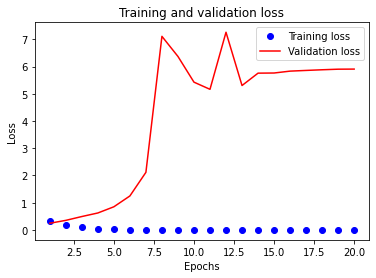

In [ ]:
import matplotlib.pyplot as plt

acc = model_history.history['binary_accuracy']
val_acc = model_history.history['val_binary_accuracy']
loss = model_history.history['loss']
val_loss = model_history.history['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()                 # Bag of words لكل كلمه وده بسبب ال input vector واللي معناها اني عندي اصفار كتير في ال input الكبيره دي في ال sparsity علي الفاضي بسبب كميه ال input بسبب ضخامه ال overfitting هنلاحظ ال

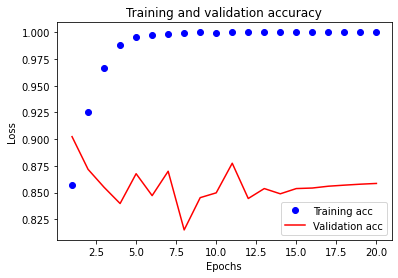

In [ ]:
plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()                 # Bag of words لكل جمله وده بسبب ال input vector واللي معناها اني عندي اصفار كتير في ال input الكبيره دي في ال sparsity علي الفاضي بسبب كميه ال input بسبب ضخامه ال overfitting هنلاحظ ال

Notes:

- Padding can be performed on texts before or after binarization. However, it's better to be done after binarization since we pad 0's which won't be understood by the vocab during binarization

- The padded vector is very sparse! This is due to exceptionally long sentences --> outliers. So it's better to remove them, or even limit the max sentence length.

# Text features

So far, we have tranformed the text into binary/digital form that can be understood by ML models.

However, we can further apply or extract different features from the vectorized form.

In other words, we can represent the sequence of word indices we obtained in different forms.



# BoW with keras Tokenizer

We can use keras tokenizer to build a simple BoW.

The rows = number of sentences/documents

The #columns = number of words in the vocab

Each entry can encode different modes:

- binary: Whether or not each word is present in the document. This is the default.

- count: The count of each word in the document.

- freq: The frequency of each word as a ratio of words within each document.

- tfidf: The Text Frequency-Inverse DocumentFrequency (TF-IDF) scoring for each word in the document (more on that later).


In [ ]:
# binary:  ==> ثنائي binary عباره عن 0 و 1 يعني BOW vector بتاعت الجمله دي وباقي الكلمات ب 0 وده بقي مع كل الجمل فبالتالي هلاقي كل ال BOW vector دي ب 1 في ال indexes ونحط مكان ال vocabulary لكل كلمه فيها من ال indexes ده لكل جمله هنشوف الجمله فيها كام كلمه وناخد ال BOW vector ده لكل جمله من الجمل اللي عندنا وال vocabulary بطول كلمات ال BOW vector من كل كلمات النصوص اللي عندي واعمل vocabulary ودي الطريقه العاديه اللي كنا شغالين عليها كل ده واللي هي اني اعمل
# count:  ===> بتاعت الكلمات لا انا هعوض فيها مرات تكرار الكلمات دي في الجمله دي كلها indexes مكان ال BOW vector بالظبط بس الفرق اني مش هعوض ب1 في ال binary زي ال
# freq:  ====> بتاعها فبشوف كل كلمه اتكررت كام مره في النص بتاعها وبجيب لتكررها ده اللوج وبجمع عليه 1 document يعني تكرار كل كلمه في ال Term Frequancy دي اللي هي TF حيث ال [1+log(TF)] ليها قانون بيقول
# tf-idf: ===> اللي عندي texts للجمله دي ..... ونفس الكلام بقي مع كل الجمل بتاعت ال tf-idf Vector بتاع الجمله دي وده هعمله مع كل الكلمات بتاعت الجمله دي وبكده هكون جبت ال  tf-idf Vector بتاع الكلمه دي اللي هو بتاع المعجم في ال index والناتج بتاعها احطه في ال TF * IDF واضرب الاتنين في بعض ال IDF من قانون ال IDF وبعد كده اجيب اجيب ليها ال TF بتاعها من قانون ال TF او جمله يعني عندي فهشوف الكلمات اللي في الجمله دي وامسك كلمه كلمه واجيب ليها اولا ال document ل [tf-idf vector] فلما هاجي اجيب ال N من اللي عندنا اللي هم document واشوف كل كلمه اتكررت في كام Vocabulary دي يعني همسك كل كلمه من كلمات ال df يعني عدد الجمل اللي عندنا وال documents دي اللي هي عدد جميع ال N حيث ال log([N/df] + 1) ليها قانون لوحده بيقول IDF انما ال [1+log(TF)] اللي هي لسه جايبنها حالا اللي قانونها freq ده اللي هو TF حيث ال [TF * IDF] ليها قانون بيقول 


In [ ]:
tok = Tokenizer(num_words= 100, oov_token='UNK')
tok.fit_on_texts(train_texts + test_texts)

train_bow = tok.texts_to_matrix(train_texts, mode='binary')     # لا علي 100 كلمه بس Vocabulary مش علي كل ال BOW_vectors in binary features انا هنا عايز
print(train_bow.shape)
print(train_bow)
print('==============')
test_bow = tok.texts_to_matrix(test_texts, mode='binary')       # لا علي 100 كلمه بس Vocabulary مش علي كل ال BOW_vectors in binary features انا هنا عايز
print(test_bow.shape)
print(test_bow)

(25000, 100)
[[0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 1. 0. 0.]
 ...
 [0. 1. 0. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]]
(25000, 100)
[[0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]
 [0. 1. 0. ... 0. 0. 0.]
 ...
 [0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 0. 0. 0.]
 [0. 1. 1. ... 1. 0. 0.]]


In [ ]:
tok = Tokenizer(num_words= 100, oov_token='UNK')
tok.fit_on_texts(train_texts + test_texts)

train_bow = tok.texts_to_matrix(train_texts, mode='count')     # لا علي 100 كلمه بس Vocabulary مش علي كل ال BOW_vectors in count features انا هنا عايز
print(train_bow.shape)
print(train_bow)
print('==============')
test_bow = tok.texts_to_matrix(test_texts, mode='count')       # لا علي 100 كلمه بس Vocabulary مش علي كل ال BOW_vectors in count features انا هنا عايز
print(test_bow.shape)
print(test_bow)

(25000, 100)
[[ 0. 46.  1. ...  0.  0.  0.]
 [ 0. 48.  2. ...  0.  0.  0.]
 [ 0. 94. 12. ...  1.  0.  0.]
 ...
 [ 0. 33.  0. ...  0.  0.  0.]
 [ 0. 17.  4. ...  0.  0.  0.]
 [ 0. 46.  0. ...  0.  0.  0.]]
(25000, 100)
[[  0.  83.   6. ...   0.   0.   0.]
 [  0.  37.   3. ...   0.   0.   0.]
 [  0.  67.   0. ...   0.   0.   0.]
 ...
 [  0.  39.   4. ...   0.   0.   0.]
 [  0. 158.   9. ...   0.   0.   0.]
 [  0. 128.   1. ...   1.   0.   0.]]


In [ ]:
tok = Tokenizer(oov_token='UNK')
tok.fit_on_texts(train_texts + test_texts)

train_bow = tok.texts_to_matrix(train_texts[:10], mode='count')   # بس انا هطبعله اول 10 جمل بس مش الجمل كلها Vocabulary بس علي كل ال BOW_vectors in count features انا هنا عايز
print(train_bow.shape)
print(train_bow)
print('==============')
test_bow = tok.texts_to_matrix(test_texts[:10], mode='count')     # بس انا هطبعله اول 10 جمل بس مش الجمل كلها Vocabulary بس علي كل ال BOW_vectors in count features انا هنا عايز
print(test_bow.shape)
print(test_bow)                   

(10, 140834)
[[ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  2. ...  0.  0.  0.]
 [ 0.  0. 12. ...  0.  0.  0.]
 ...
 [ 0.  0.  3. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]
 [ 0.  0.  1. ...  0.  0.  0.]]
(10, 140834)
[[0. 0. 6. ... 0. 0. 0.]
 [0. 0. 3. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 5. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
tok = Tokenizer(num_words=100, oov_token='UNK')
tok.fit_on_texts(train_texts + test_texts)

train_bow = tok.texts_to_matrix(train_texts, mode='freq')     # لا علي 100 كلمه بس Vocabulary مش علي كل ال BOW_vectors in tf features انا هنا عايز
print(train_bow.shape)
print(train_bow)
print('==============')
test_bow = tok.texts_to_matrix(test_texts, mode='freq')     # لا علي 100 كلمه بس Vocabulary مش علي كل ال BOW_vectors in tf features انا هنا عايز
print(test_bow.shape)
print(test_bow)

(25000, 100)
[[0.         0.75409836 0.01639344 ... 0.         0.         0.        ]
 [0.         0.70588235 0.02941176 ... 0.         0.         0.        ]
 [0.         0.59119497 0.0754717  ... 0.00628931 0.         0.        ]
 ...
 [0.         0.46478873 0.         ... 0.         0.         0.        ]
 [0.         0.51515152 0.12121212 ... 0.         0.         0.        ]
 [0.         0.74193548 0.         ... 0.         0.         0.        ]]
(25000, 100)
[[0.         0.664      0.048      ... 0.         0.         0.        ]
 [0.         0.7254902  0.05882353 ... 0.         0.         0.        ]
 [0.         0.77011494 0.         ... 0.         0.         0.        ]
 ...
 [0.         0.63934426 0.06557377 ... 0.         0.         0.        ]
 [0.         0.7281106  0.04147465 ... 0.         0.         0.        ]
 [0.         0.81528662 0.00636943 ... 0.00636943 0.         0.        ]]


In [ ]:
tok = Tokenizer(num_words=100, oov_token='UNK')
tok.fit_on_texts(train_texts + test_texts)

train_bow = tok.texts_to_matrix(train_texts, mode='tfidf')     # لا علي 100 كلمه بس Vocabulary مش علي كل ال BOW_vectors in tfidf features انا هنا عايز
print(train_bow.shape)
print(train_bow)
print('==============')
test_bow = tok.texts_to_matrix(test_texts, mode='tfidf')     # لا علي 100 كلمه بس Vocabulary مش علي كل ال BOW_vectors in tfidf features انا هنا عايز
print(test_bow.shape)
print(test_bow)

(25000, 100)
[[ 0.         52.2449259   0.9389492  ...  0.          0.
   0.        ]
 [ 0.         52.70541234  1.58977919 ...  0.          0.
   0.        ]
 [ 0.         59.97733137  3.27215031 ...  2.20393709  0.
   0.        ]
 ...
 [ 0.         48.6513048   0.         ...  0.          0.
   0.        ]
 [ 0.         41.47459516  2.24060918 ...  0.          0.
   0.        ]
 [ 0.         52.2449259   0.         ...  0.          0.
   0.        ]]
(25000, 100)
[[ 0.         58.63076231  2.62132032 ...  0.          0.
   0.        ]
 [ 0.         49.88920172  1.97049033 ...  0.          0.
   0.        ]
 [ 0.         56.31372427  0.         ...  0.          0.
   0.        ]
 ...
 [ 0.         50.4587963   2.24060918 ...  0.          0.
   0.        ]
 [ 0.         65.59605534  3.00203146 ...  0.          0.
   0.        ]
 [ 0.         63.31778701  0.9389492  ...  2.20393709  0.
   0.        ]]


# BoW with sklearn

The BoW model above can be also produced using sklearn

Notes:

- We don't have control on the vocab size unlike keras

- The matrix is (CSR) (Compressed Sparse Row), which is more compact representation for matrices with many zeros. The BoW is very sparse, it's a good way to represent it.
You can easily recover the array when needed using `toarray()`

- Vocab is all lower case, and punctuation is ignored. All those are configurable from sklearn

# CountVectorizer

The CountVectorizer provides a simple way to both tokenize a collection of text documents and build a vocabulary of known words

In [ ]:
# CountVectorizer عن طريق اداه ال Bag of words in count featues واعمل Vocabulary ابني sklearn انا كمان ممكن عن طريق ال
# انها بتضرب وكده RAM كله وكل ده عشان مشكله ال vocabulary كنا بنعمل علي كل الجمل بس مش علي ال keras علي كل الجمل علي عكس BOW Vector يعني مش هقدر اعمل texts علي كل ال transform ولكن مش بنعمل vocabulary علي كل ال BOW Vector فبنضطر نعمل [num_words] عن طريق ال keras زي ماكان بيحصل في vocabulary انها مش بتقدر تحدد انت عايز كام كلمه من ال CountVectorizer للاسف في مشكله بتواجه ال
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer()
vectorizer.fit(train_texts + test_texts)                     # Build Vocabulary from all texts,  Vocab is all lower case, and punctuation is ignored automatically.

train_bow = vectorizer.transform(train_texts[:10])           # make BOW_Vector for some texts not all texts because Ram crashing.
train_bow = train_bow.toarray()                              # Must convert it to numpy array to display it.
print(train_bow.shape)                                       # كله ولكن طوله بطول المعجم كله يعني بطول 140805 كلمه text ل 10 جمل بس من ال BOW vector انا عامل 
print(train_bow)                                             # CountVectorizer is a BOW_vector in count featues like from name 'CountVectorizer'
print('===================')
test_bow = vectorizer.transform(test_texts[:10])             # make BOW_Vector for some texts not all texts because Ram crashing.
test_bow = test_bow.toarray()                                # Must convert it to numpy array to display it.
print(test_bow.shape)                                        # كله ولكن طوله بطول المعجم كله يعني بطول 140805 كلمه text ل 10 جمل بس من ال BOW vector انا عامل 
print(test_bow)

(10, 140805)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
(10, 140805)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
# مش اخده كله فهنا انا هحدد 10000 كلمه بس Vocabulary دي انا ممكن احدد عدد كلمات معين من ال Ram بسبب مشكله ال
from sklearn.feature_extraction.text import CountVectorizer

vocab_sz= 10000
vectorizer = CountVectorizer(max_features= vocab_sz)
vectorizer.fit(train_texts + test_texts)                     # Build Vocabulary from all texts,  Vocab is all lower case, and punctuation is ignored automatically.

train_bow = vectorizer.transform(train_texts)
train_bow = train_bow.toarray()                              # Must convert it to numpy array to display it.
print(train_bow.shape)                                       # ولكن طوله مش بطول المعجم كله يعني بطول 10000 كلمه بس منه BOW vector انا عامل 
print(train_bow)                                             # CountVectorizer is a BOW_vector in count featues like from name 'CountVectorizer'
print('===================')
test_bow = vectorizer.transform(test_texts)                 
test_bow = test_bow.toarray()                                # Must convert it to numpy array to display it.
print(test_bow.shape)                                        # ولكن طوله مش بطول المعجم كله يعني بطول 10000 كلمه بس منه BOW vector انا عامل 
print(test_bow)

(25000, 10000)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
(25000, 10000)
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [ ]:
# [.vocabulary_] to display vocabulary
vectorizer.vocabulary_

{'take': 121554,
 'one': 88334,
 'look': 71729,
 'cover': 26221,
 'movie': 81029,
 'know': 66839,
 'right': 103677,
 'away': 8209,
 'watch': 134747,
 'landmark': 68207,
 'film': 42781,
 'cheese': 20665,
 'filmmaking': 42982,
 'every': 39228,
 'respect': 102830,
 'moment': 79723,
 'despite': 30792,
 'utter': 131769,
 'trash': 127143,
 'give': 48969,
 'story': 118207,
 'actually': 1250,
 'interest': 61236,
 'point': 95160,
 'although': 3681,
 'undeniably': 129785,
 'pull': 98749,
 'along': 3507,
 'mainly': 73758,
 'cheerlead': 20654,
 'squad': 116681,
 'shower': 111898,
 'scene': 107365,
 'sex': 110403,
 'numerous': 86722,
 'personalityfree': 93070,
 'boyfriend': 14768,
 'act': 800,
 'awful': 8271,
 'director': 31997,
 'little': 71054,
 'shoot': 111629,
 'extensive': 40236,
 'amount': 4195,
 'nudity': 86633,
 'need': 83739,
 'keep': 65458,
 'audience': 7700,
 'attention': 7575,
 'nutty': 86822,
 'professor': 97751,
 'hopelessly': 57017,
 'geeky': 47744,
 'discover': 32358,
 'potion': 963

# TFIDF

The word counts suffer some issues: most frequent words are usually not important (like stop words), while they take high focus/count.

TFIDF (Term Frequency - Inverse Document) is a way to adjust those counts:

- TF: #mentions within a document
- IDF: #mentions across all docs (same as the counts before)

So it gives higher importance to rare words across all docs (IDF++, TFIDF--), while it emphasyses on words appearing mostly in THIS doc (TF++, TFIDF--).

If a word appearing only in the current doc/sentence, it has TFIDF=1.
If a word appears in all docs/sents but not the current one, it has TFIDF=0.
If a word (stop word for example) appearing a lot in the current doc/sent and also in ALL others, it will have high TF (count) and much higher IDF (discount), so low TFIDF overall.

In [ ]:
# TfidfVectorizer عن طريق الاداه Bag of words in TF-IDF features  ابني معجم واعمل sklearn انا كمان ممكن عن طريق ال
# انها بتضرب وكده RAM كله وكل ده عشان مشكله ال vocabulary كنا بنعمل علي كل الجمل بس مش علي ال keras علي كل الجمل علي عكس BOW Vector يعني مش هقدر اعمل texts علي كل ال transform ولكن مش بنعمل vocabulary علي كل ال BOW Vector فبنضطر نعمل [num_words] عن طريق ال keras زي ماكان بيحصل في vocabulary انها مش بتقدر تحدد انت عايز كام كلمه من ال TfidfVectorizer للاسف في مشكله بتواجه ال

from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer = TfidfVectorizer()
vectorizer.fit(train_texts + test_texts)                     # Build Vocabulary from all texts,  Vocab is all lower case, and punctuation is ignored automatically.

train_bow = vectorizer.transform(train_texts[:10])           # make BOW_Vector for some texts not all texts because Ram crashing.
train_bow = train_bow.toarray()                              # Must convert it to numpy array to display it.
print(train_bow.shape)                                       # كله ولكن طوله بطول المعجم كله يعني بطول 140805 كلمه text ل 10 جمل بس من ال BOW vector انا عامل 
print(train_bow)                                             # CountVectorizer is a BOW_vector in count featues like from name 'CountVectorizer'
print('===================')
test_bow = vectorizer.transform(test_texts[:10])             # make BOW_Vector for some texts not all texts because Ram crashing.
test_bow = test_bow.toarray()                                # Must convert it to numpy array to display it.
print(test_bow.shape)                                        # كله ولكن طوله بطول المعجم كله يعني بطول 140805 كلمه text ل 10 جمل بس من ال BOW vector انا عامل 
print(test_bow)

(10, 140805)
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
(10, 140805)
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
# مش اخده كله فهنا انا هحدد 10000 كلمه بس Vocabulary دي انا ممكن احدد عدد كلمات معين من ال Ram بسبب مشكله ال
from sklearn.feature_extraction.text import TfidfVectorizer

vocab_sz= 10000
vectorizer = TfidfVectorizer(max_features= vocab_sz)
vectorizer.fit(train_texts + test_texts)

train_bow = vectorizer.transform(train_texts)
train_bow = train_bow.toarray()                              # Must convert it to numpy array to display it.
print(train_bow.shape)                                       # ولكن طوله مش بطول المعجم كله يعني بطول 10000 كلمه بس منه BOW vector انا عامل 
print(train_bow)
print('===================')
test_bow = vectorizer.transform(test_texts)                 
test_bow = test_bow.toarray()                                # Must convert it to numpy array to display it.
print(test_bow.shape)  
print(test_bow)

(25000, 10000)
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
(25000, 10000)
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


In [ ]:
text = ["The quick brown fox jumped over the lazy dog.",
        "The dog.",
        "The fox"]

vectorizer = TfidfVectorizer()
vectorizer.fit(text)

# summarize
print(vectorizer.vocabulary_)               # to print vocablury
print(vectorizer.idf_)                      # to print IDF value only for each word in vocabulary

# encode document
bow_tfidf = vectorizer.transform(text)
bow_tfidf= bow_tfidf.toarray()
print('\n')

# summarize encoded vector
print(bow_tfidf.shape)
print(bow_tfidf)                            # to print tf-idf vectors for 3 texts


{'the': 7, 'quick': 6, 'brown': 0, 'fox': 2, 'jumped': 3, 'over': 5, 'lazy': 4, 'dog': 1}
[1.69314718 1.28768207 1.28768207 1.69314718 1.69314718 1.69314718
 1.69314718 1.        ]


(3, 8)
[[0.36388646 0.27674503 0.27674503 0.36388646 0.36388646 0.36388646
  0.36388646 0.42983441]
 [0.         0.78980693 0.         0.         0.         0.
  0.         0.61335554]
 [0.         0.         0.78980693 0.         0.         0.
  0.         0.61335554]]



Notes:

- A vocabulary of 8 words is learned from the documents and each word is assigned a unique integer index in the output vector. 

- The inverse document frequencies (IDF) are calculated for each
word in the vocabulary, assigning the lowest score of 1.0 to the most frequently observed word: the at index 7. 

- Finally, the first document is encoded as an 8-element sparse array and we can
review the final scorings of each word with dierent values for the, fox, and dog from the otherwords in the vocabulary.

Notice how the words the, do, fox have the lowest scores, since they are mentioned in all the 3 docs. 

# Putting all together

However, the raw [IMDB](http://ai.stanford.edu/~amaas/data/sentiment/aclImdb_v1.tar.gz ) is just plain text:

In [3]:
from pathlib import Path
import os
DATA_PATH=Path('./dat/')
DATA_PATH.mkdir(exist_ok=True)
#if not os.path.exists('./dat/aclImdb_v1.tar.gz'):
if not os.path.exists('./dat/aclImdb'):
  !curl -O http://ai.stanford.edu/~amaas/data/sentiment/aclImdb_v1.tar.gz 
  !tar -xf aclImdb_v1.tar.gz -C {DATA_PATH}

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 80.2M  100 80.2M    0     0  9627k      0  0:00:08  0:00:08 --:--:-- 15.8M


In [4]:
# 'neg', 'pos' <-- ولكن احنا هنشتغل بس علي الاتنين دول unsupervised و negative و  positive اللي هم  classes 3 عندنا عباره عن labels ال
import numpy as np
CLASSES = ['neg', 'pos']#, 'unsup']
PATH=Path('./dat/aclImdb/')          # ./dat/aclImdb/ فبالتالي بقي عندي الداتا المسار بتاعها هو aclImdb فوق وحملت فيه الداتا بتاعتنا اللي اسمها dat اللي فيه الداتا بتاعتنا لاني انا عملت فولدر اسمه Path ده كده خلاص ال

def get_texts(path):
    texts,labels = [],[]
    for idx,label in enumerate(CLASSES):
        for fname in (path/label).glob('*.*'):             # index = 1 ب pos وال index = 0 ب neg ال enumerate هطبعا انا عامل عن طريق ال  /dat/aclImdb/pos وفولدر /dat/aclImdb/neg فأنا بعمل فور لوب بحيث يدخلي علي فولدر pos و neg الداتا اصلا محطوطه في فولدرين اللي هم
            #texts.append(fixup(fname.open('r', encoding='utf-8').read()))
            texts.append(fname.open('r', encoding='utf-8').read())       # labels اللي هي 0 & 1 في الليست اللي اسمها labels ال append وهي texts في الليست اللي اسمها neg & pos ال texts ال append فهو هنا كدا هي
            labels.append(idx)
    #return np.array(texts),np.array(labels)
    return texts, labels


In [5]:
# /dat/aclImdb/test/neg و /dat/aclImdb/test/pos و /dat/aclImdb/train/neg و /dat/aclImdb/train/pos  <-- مثل الاتي paths فبالتالي هيبق عندي test و train هنا هو هيفضي الفانكشن اللي فوق دي في فولدرين ال 
train_texts,train_labels = get_texts(PATH/'train')
test_texts,test_labels = get_texts(PATH/'test')

In [6]:
# pre-processing دي كده فانكشن كبيره بتعملي كل اللي انا عاملته فوق كله يعني بتعملي كل ال
def remove_special_chars(text):
    re1 = re.compile(r'  +')
    x1 = text.lower().replace('#39;', "'").replace('amp;', '&').replace('#146;', "'").replace(
        'nbsp;', ' ').replace('#36;', '$').replace('\\n', "\n").replace('quot;', "'").replace(
        '<br />', "\n").replace('\\"', '"').replace('<unk>', 'u_n').replace(' @.@ ', '.').replace(
        ' @-@ ', '-').replace('\\', ' \\ ')
    return re1.sub(' ', html.unescape(x1))


def remove_non_ascii(text):
    """Remove non-ASCII characters from list of tokenized words"""
    return unicodedata.normalize('NFKD', text).encode('ascii', 'ignore').decode('utf-8', 'ignore')



def remove_punctuation(text):
    """Remove punctuation from list of tokenized words"""
    translator = str.maketrans('', '', string.punctuation)
    return text.translate(translator)


def to_lowercase(text):
    return text.lower()


def replace_numbers(text):
    """Replace all interger occurrences in list of tokenized words with textual representation"""
    return re.sub(r'\d+', '', text)


def remove_whitespaces(text):
    return text.strip()


def text2words(text):
  return word_tokenize(text)


def remove_stopwords(words, stop_words):
    """
    :param words:
    :type words:
    :param stop_words: from sklearn.feature_extraction.stop_words import ENGLISH_STOP_WORDS
    or
    from spacy.lang.en.stop_words import STOP_WORDS
    :type stop_words:
    :return:
    :rtype:
    """
    return [word for word in words if word not in stop_words]


def stem_words(words):
    """Stem words in text"""
    stemmer = PorterStemmer()
    return [stemmer.stem(word) for word in words]

def lemmatize_words(words):
    """Lemmatize words in text"""

    lemmatizer = WordNetLemmatizer()
    return [lemmatizer.lemmatize(word) for word in words]

def lemmatize_verbs(words):
    """Lemmatize verbs in text"""

    lemmatizer = WordNetLemmatizer()
    return ' '.join([lemmatizer.lemmatize(word, pos='v') for word in words])


def normalize_text( text):
    text = remove_special_chars(text)
    text = remove_non_ascii(text)
    text = remove_punctuation(text)
    text = to_lowercase(text)
    text = replace_numbers(text)
    text = remove_whitespaces(text)
    words = text2words(text)
    words = remove_stopwords(words, stop_words)
    #words = stem_words(words)# Either stem ovocar lemmatize
    words = lemmatize_words(words)
    words = lemmatize_verbs(words)

    return ''.join(words)            # ''.join(words)  -->  Prepration وهرجع اضمهم تاني عشان اعمل ال pre-processing فأنا فكتهم عشان اعمل  tokens تاني مع بعض عشان يرجعوا جمل تاني زي الاول قبل ما افكهم ل tokens دي عشان يضملي ال


In [7]:
# pre-processing وهعمل عليها ال train_texts هنا انا همسك جمله جمله من ال  

def normalize_corpus(corpus):
  return [normalize_text(t) for t in corpus]
train_texts = normalize_corpus(train_texts)

In [8]:
# pre-processing وهعمل عليها ال test_texts هنا انا همسك جمله جمله من ال  

def normalize_corpus(corpus):
  return [normalize_text(t) for t in corpus]
test_texts = normalize_corpus(test_texts)

## BoW

### Binary features


We will use the tokenizer of keras

In [ ]:
vocab_sz = 10000    # None means all
tok = Tokenizer(num_words= vocab_sz, oov_token='UNK')
tok.fit_on_texts(train_texts + test_texts)

# Extract binary BoW features
X_train = tok.texts_to_matrix(train_texts, mode='binary')
X_test = tok.texts_to_matrix(test_texts, mode='binary')


In [ ]:
y_train = np.asarray(train_labels).astype('float32')
y_test = np.asarray(test_labels).astype('float32')

print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)

(25000, 10000)
(25000,)
(25000, 10000)
(25000,)


Now we are ready to model as before:

# Model

In [ ]:
from keras import models
from keras import layers

model = models.Sequential()
model.add(layers.Dense(16, activation='relu', input_shape=(vocab_sz,)))
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16)                160016    
                                                                 
 dense_1 (Dense)             (None, 16)                272       
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 160,305
Trainable params: 160,305
Non-trainable params: 0
_________________________________________________________________


In [ ]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.metrics import binary_accuracy

model.compile(optimizer= RMSprop(lr=0.001),
              loss= binary_crossentropy,
              metrics=[binary_accuracy])

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


We can further split the train data into val and test:

In [ ]:
X_val = X_test[:10000]
X_test = X_test[10000:]

y_val = y_test[:10000]
y_test = y_test[10000:]

In [ ]:
print('X_train shape:  {}'.format(X_train.shape))
print('X_val shape:    {}'.format(X_val.shape))
print('X_test shape:   {}'.format(X_test.shape))
print('==============================')
print('y_train shape:  {}'.format(y_train.shape))
print('y_val shape:    {}'.format(y_val.shape))
print('y_test shape:   {}'.format(y_test.shape))

X_train shape:  (25000, 10000)
X_val shape:    (10000, 10000)
X_test shape:   (15000, 10000)
y_train shape:  (25000,)
y_val shape:    (10000,)
y_test shape:   (15000,)


In [ ]:
history = model.fit(X_train,
                    y_train,
                    epochs=20,
                    batch_size=512,
                    validation_data=(X_val, y_val))

Epoch 1/20
49/49 [==============================] - 5s 32ms/step - loss: 0.4685 - binary_accuracy: 0.8296 - val_loss: 0.3621 - val_binary_accuracy: 0.8508
Epoch 2/20
49/49 [==============================] - 1s 18ms/step - loss: 0.2677 - binary_accuracy: 0.9062 - val_loss: 0.2560 - val_binary_accuracy: 0.8931
Epoch 3/20
49/49 [==============================] - 1s 18ms/step - loss: 0.2074 - binary_accuracy: 0.9235 - val_loss: 0.3890 - val_binary_accuracy: 0.8363
Epoch 4/20
49/49 [==============================] - 1s 18ms/step - loss: 0.1747 - binary_accuracy: 0.9363 - val_loss: 0.3328 - val_binary_accuracy: 0.8659
Epoch 5/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1516 - binary_accuracy: 0.9461 - val_loss: 0.4206 - val_binary_accuracy: 0.8408
Epoch 6/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1328 - binary_accuracy: 0.9540 - val_loss: 0.4160 - val_binary_accuracy: 0.8476
Epoch 7/20
49/49 [==============================] - 1s 17ms/step - los

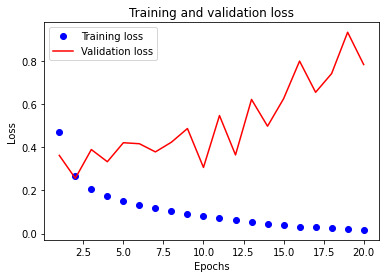

In [ ]:
history_dict = history.history
history_dict.keys()


acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

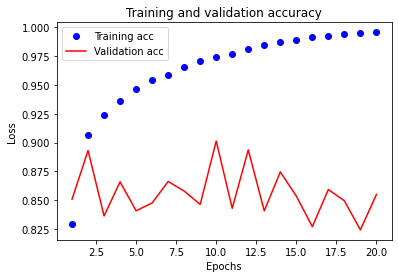

In [ ]:
plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

# Let's compare to the Keras dataset:

NOtice that, we could directly use the function `sequences_to_matrix` to obtain the BoW from binarized corpus:

In [ ]:
# keras داخل built in اللي هي الجاهزه اللي هي imdb dataset علي ال BOW binary features هجرب اعمل
from keras.datasets import imdb
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.metrics import binary_accuracy

(train_data, train_labels), (test_data, test_labels) = imdb.load_data(num_words=10000)

vocab_sz = 10000
tok = Tokenizer(num_words= vocab_sz, oov_token='UNK')
tok.fit_on_texts(train_texts + test_texts)
#new_vocab_sz = len(tok.word_index)

# Extract binary BoW features
X_train = tok.sequences_to_matrix(train_data, mode='binary')         # indexes الجاهزه دي بتبقي جيالي جاهزه متحول كلمات الجمل بتاعتها ل imdb dataset وده لان ال sequences_to_matrix بتاعتها فعشان كده استخدمت index يعني الجمل كلماتها متشاله ومحطوط مكانها ال indexing مش جمل زي الموديل اللي فات علي طول اللي لسه مدربينة لا انما هي معمولها [train_texts + test_texts] لأن ال texts_to_matrix مش sequences_to_matrix أنا هنا استخدمت
X_test = tok.sequences_to_matrix(test_data, mode='binary')
y_train = np.asarray(train_labels).astype('float32')
y_test = np.asarray(test_labels).astype('float32')

X_val = X_test[:10000]
X_test = X_test[10000:]

y_val = y_test[:10000]
y_test = y_test[10000:]

model = models.Sequential()
model.add(layers.Dense(16, activation='relu', input_shape=(vocab_sz,)))
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer= RMSprop(lr=0.001),
              loss= binary_crossentropy,
              metrics=[binary_accuracy])
			  
history = model.fit(X_train,
                    y_train,
                    epochs=20,
                    batch_size=512,
                    validation_data=(X_val, y_val))

history_dict = history.history
history_dict.keys()



17473536/17464789 [==============================] - 0s 0us/step


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


Epoch 1/20
49/49 [==============================] - 2s 29ms/step - loss: 0.4486 - binary_accuracy: 0.8230 - val_loss: 0.3355 - val_binary_accuracy: 0.8794
Epoch 2/20
49/49 [==============================] - 1s 17ms/step - loss: 0.2578 - binary_accuracy: 0.9119 - val_loss: 0.2969 - val_binary_accuracy: 0.8798
Epoch 3/20
49/49 [==============================] - 1s 17ms/step - loss: 0.2005 - binary_accuracy: 0.9286 - val_loss: 0.2827 - val_binary_accuracy: 0.8848
Epoch 4/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1687 - binary_accuracy: 0.9395 - val_loss: 0.2963 - val_binary_accuracy: 0.8807
Epoch 5/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1450 - binary_accuracy: 0.9490 - val_loss: 0.3194 - val_binary_accuracy: 0.8760
Epoch 6/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1272 - binary_accuracy: 0.9560 - val_loss: 0.3345 - val_binary_accuracy: 0.8749
Epoch 7/20
49/49 [==============================] - 1s 17ms/step - los

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

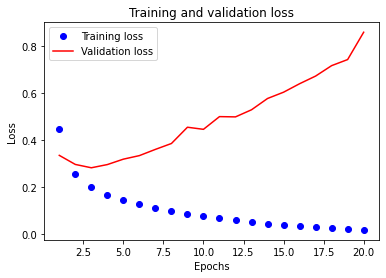

In [ ]:

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()


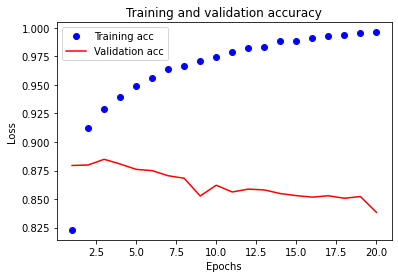

In [ ]:
plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

# So what happened?

As you can see, the val loss curves with Keras data has much higher (~87%) accuracy than the one we used.

__The reason is that we assumed the data is shuffled!__

If you revise the get_texts function we implemented, it takes all the class data in sequence. 

Our train/val split did not contain any shuffling.

To fix this, we could manually shuffle:

```
VALIDATION_SPLIT = 0.4 # corresponds to 10,000 samples out of 25,000

indices = np.arange(x_train.shape[0])
np.random.shuffle(indices)
x_train = x_train[indices]
y_train = y_train[indices]
nb_validation_samples = int(VALIDATION_SPLIT * x_train.shape[0])

partial_x_train = train_data[:-nb_validation_samples]
partial_y_train = train_targets[:-nb_validation_samples]
x_val = train_data[-nb_validation_samples:]
y_val = train_targets[-nb_validation_samples:]

print('Number of positive and negative reviews in traing and validation set')
print(y_train.sum(axis=0))
print(y_val.sum(axis=0))
```

Or we could use sklearn `train_test_split` function:

# عالي وبيعلي وده بسبب ان انا مش عامل loss اللي حصل في اللي فات ده ان ال
# manual فهتضطر اني اعملها Test & Validation split ل shuffle  
# اوتوماتيك shuffle العادي واللي هتعملي ال sklearn train_test_split عن طريق اني هعمل 

In [ ]:
train_texts, train_labels = get_texts(PATH/'train')
test_texts, test_labels = get_texts(PATH/'test')

train_texts = normalize_corpus(train_texts)
test_texts = normalize_corpus(test_texts)

vocab_sz = 10000
tok = Tokenizer(num_words= vocab_sz, oov_token='UNK')
tok.fit_on_texts(train_texts + test_texts)
#new_vocab_sz = len(tok.word_index)

# Extract binary BoW features
X_train = tok.texts_to_matrix(train_texts, mode='binary')
X_test = tok.texts_to_matrix(test_texts, mode='binary')

y_train = np.asarray(train_labels).astype('float32')
y_test = np.asarray(test_labels).astype('float32')
                                                                                                         # default [shuffle = True]
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.4, random_state=42)          # test & validation split لل Shuffle كده حصل

In [ ]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.metrics import binary_accuracy

model = models.Sequential()
model.add(layers.Dense(16, activation='relu', input_shape=(vocab_sz,)))
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer= RMSprop(lr=0.001),
              loss= binary_crossentropy,
              metrics=[binary_accuracy])
			  
history = model.fit(X_train,
                    y_train,
                    epochs=20,
                    batch_size=512,
                    validation_data=(X_val, y_val))
history_dict = history.history
history_dict.keys()

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


Epoch 1/20
49/49 [==============================] - 3s 43ms/step - loss: 0.4471 - binary_accuracy: 0.8325 - val_loss: 0.3370 - val_binary_accuracy: 0.8781
Epoch 2/20
49/49 [==============================] - 1s 17ms/step - loss: 0.2618 - binary_accuracy: 0.9060 - val_loss: 0.3027 - val_binary_accuracy: 0.8770
Epoch 3/20
49/49 [==============================] - 1s 17ms/step - loss: 0.2046 - binary_accuracy: 0.9260 - val_loss: 0.2970 - val_binary_accuracy: 0.8811
Epoch 4/20
49/49 [==============================] - 1s 18ms/step - loss: 0.1745 - binary_accuracy: 0.9362 - val_loss: 0.3140 - val_binary_accuracy: 0.8748
Epoch 5/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1485 - binary_accuracy: 0.9478 - val_loss: 0.3389 - val_binary_accuracy: 0.8728
Epoch 6/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1312 - binary_accuracy: 0.9550 - val_loss: 0.3634 - val_binary_accuracy: 0.8667
Epoch 7/20
49/49 [==============================] - 1s 17ms/step - los

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

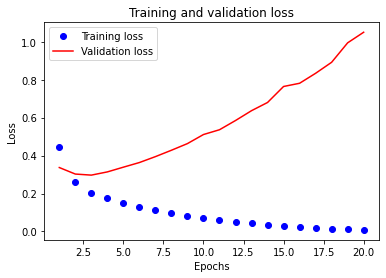

In [ ]:

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

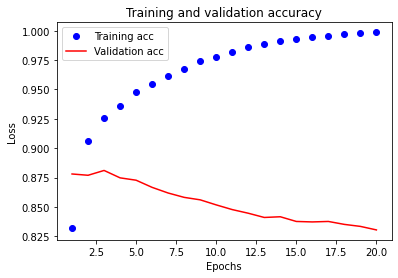

In [ ]:

plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

### Count/Freq features

## Count

In [ ]:
'''
trn_texts,trn_labels = get_texts(PATH/'train')
tst_texts,tst_labels = get_texts(PATH/'test')

trn_texts = normalize_corpus(trn_texts)
tst_texts = normalize_corpus(tst_texts)

vocab_sz = 10000
tok = Tokenizer(num_words=vocab_sz, oov_token='UNK')
tok.fit_on_texts(trn_texts + tst_texts)
#vocab_sz = len(tok.word_index)
'''
# Extract binary BoW features
X_train = tok.texts_to_matrix(train_texts, mode='count')
X_test = tok.texts_to_matrix(test_texts, mode='count')

y_train = np.asarray(train_labels).astype('float32')
y_test = np.asarray(test_labels).astype('float32')

X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.4, random_state=42)          # test & validation split لل Shuffle كده حصل


In [ ]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.metrics import binary_accuracy

model = models.Sequential()
model.add(layers.Dense(16, activation='relu', input_shape=(vocab_sz,)))
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer= RMSprop(lr=0.001),
              loss= binary_crossentropy,
              metrics= [binary_accuracy])
			  
history = model.fit(X_train,
                    y_train,
                    epochs=20,
                    batch_size=512,
                    validation_data=(X_val, y_val))
history_dict = history.history
history_dict.keys()

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


Epoch 1/20
49/49 [==============================] - 4s 27ms/step - loss: 0.4999 - binary_accuracy: 0.8054 - val_loss: 0.3760 - val_binary_accuracy: 0.8751
Epoch 2/20
49/49 [==============================] - 1s 19ms/step - loss: 0.2917 - binary_accuracy: 0.9018 - val_loss: 0.3085 - val_binary_accuracy: 0.8828
Epoch 3/20
49/49 [==============================] - 1s 17ms/step - loss: 0.2235 - binary_accuracy: 0.9213 - val_loss: 0.3103 - val_binary_accuracy: 0.8775
Epoch 4/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1881 - binary_accuracy: 0.9343 - val_loss: 0.3178 - val_binary_accuracy: 0.8766
Epoch 5/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1628 - binary_accuracy: 0.9430 - val_loss: 0.3415 - val_binary_accuracy: 0.8721
Epoch 6/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1435 - binary_accuracy: 0.9509 - val_loss: 0.3749 - val_binary_accuracy: 0.8656
Epoch 7/20
49/49 [==============================] - 1s 17ms/step - los

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

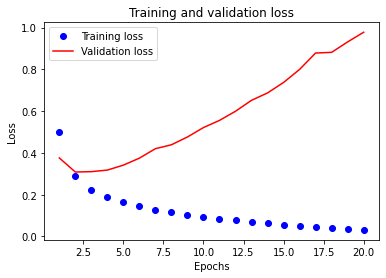

In [ ]:

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

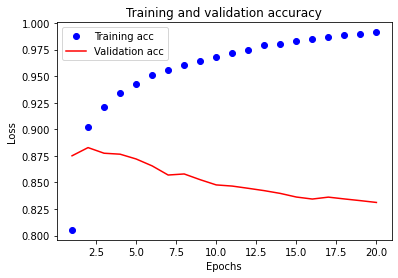

In [ ]:
plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

As you can see above, the counts are not normalized values, which is not good for the NN (neurons activations prefer normalized values, however, for Dense and Relu it makes no big difference).

However, making just unnormalized counts is the same as binary BoW, since high frequency words will dominate the vector, specially that it's very sparse, causing quick overfitting. In other words, important low freq words are discarded. This can be treated with TF-IDF, or at least by normalizing, so the network might undersand that low frequencies have special importance.

In all cases, let's try to normalize into freq and see the differene:

## Freq (TF)

In [ ]:
'''
trn_texts,trn_labels = get_texts(PATH/'train')
tst_texts,tst_labels = get_texts(PATH/'test')

trn_texts = normalize_corpus(trn_texts)
tst_texts = normalize_corpus(tst_texts)

vocab_sz = 10000
tok = Tokenizer(num_words=vocab_sz, oov_token='UNK')
tok.fit_on_texts(trn_texts + tst_texts)
#vocab_sz = len(tok.word_index)
'''
# Extract binary BoW features
X_train = tok.texts_to_matrix(train_texts, mode='freq')       # TF --> Term Frequancy
X_test = tok.texts_to_matrix(test_texts, mode='freq')

y_train = np.asarray(train_labels).astype('float32')
y_test = np.asarray(test_labels).astype('float32')

X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.4, random_state=42)          # test & validation split لل Shuffle كده حصل


In [ ]:
X_train

array([[0.        , 0.08196721, 0.01639344, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.05882353, 0.02941176, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.03144654, 0.0754717 , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [0.        , 0.04225352, 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.03030303, 0.12121212, ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.01612903, 0.        , ..., 0.        , 0.        ,
        0.        ]])

In [ ]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.metrics import binary_accuracy

model = models.Sequential()
model.add(layers.Dense(16, activation='relu', input_shape=(vocab_sz,)))
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer= RMSprop(lr=0.001),
              loss= binary_crossentropy,
              metrics= [binary_accuracy])
			  
history = model.fit(X_train,
                    y_train,
                    epochs=20,
                    batch_size=512,
                    validation_data=(X_val, y_val))
history_dict = history.history
history_dict.keys()

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


Epoch 1/20
49/49 [==============================] - 2s 27ms/step - loss: 0.6840 - binary_accuracy: 0.6456 - val_loss: 0.6724 - val_binary_accuracy: 0.6580
Epoch 2/20
49/49 [==============================] - 1s 17ms/step - loss: 0.6535 - binary_accuracy: 0.7612 - val_loss: 0.6374 - val_binary_accuracy: 0.7432
Epoch 3/20
49/49 [==============================] - 1s 17ms/step - loss: 0.6091 - binary_accuracy: 0.8066 - val_loss: 0.5918 - val_binary_accuracy: 0.7733
Epoch 4/20
49/49 [==============================] - 1s 16ms/step - loss: 0.5543 - binary_accuracy: 0.8373 - val_loss: 0.5384 - val_binary_accuracy: 0.8175
Epoch 5/20
49/49 [==============================] - 1s 17ms/step - loss: 0.4953 - binary_accuracy: 0.8563 - val_loss: 0.4844 - val_binary_accuracy: 0.8505
Epoch 6/20
49/49 [==============================] - 1s 17ms/step - loss: 0.4374 - binary_accuracy: 0.8710 - val_loss: 0.4350 - val_binary_accuracy: 0.8614
Epoch 7/20
49/49 [==============================] - 1s 17ms/step - los

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

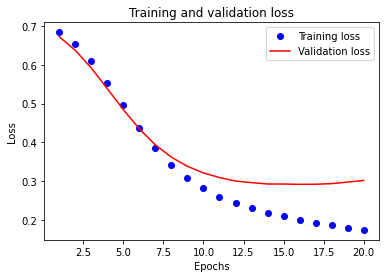

In [ ]:

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

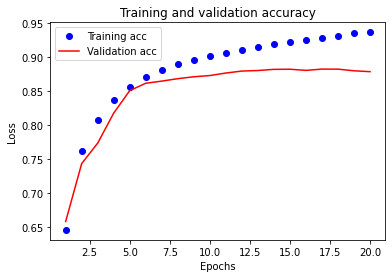

In [ ]:

plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

As you can see, normalizing the counts correctly has a good effect to delay the overfitting. Even at the max epoch, we got higher acc (88%)

# بشكل كبير جداً overfitting فبالتالي قدرت اقلل ال freq(tf) فهلاقي ان لما جيت عملت ال

# Deep NN قبل ماتدخل لل BOW vectors للقيم بتاعت ال Normalization بتعمل keras في freq وده بسبب ان ال

# DNN واللي بتصغرلي القيم قبل ماتدخل ال log لأن قانونها فيه
_______________________________


### TF-IDF features

In [ ]:
'''
trn_texts,trn_labels = get_texts(PATH/'train')
tst_texts,tst_labels = get_texts(PATH/'test')

trn_texts = normalize_corpus(trn_texts)
tst_texts = normalize_corpus(tst_texts)

vocab_sz = 10000
tok = Tokenizer(num_words=vocab_sz, oov_token='UNK')
tok.fit_on_texts(trn_texts + tst_texts)
#vocab_sz = len(tok.word_index)
'''
# Extract binary BoW features
X_train = tok.texts_to_matrix(train_texts, mode='tfidf')
X_test = tok.texts_to_matrix(test_texts, mode='tfidf')

y_train = np.asarray(train_labels).astype('float32')
y_test = np.asarray(test_labels).astype('float32')

X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.4, random_state=42)          # test & validation split لل Shuffle كده حصل


In [ ]:
X_train

array([[ 0.        , 28.23359185,  0.9389492 , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        , 25.81922363,  1.58977919, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        , 28.23359185,  3.27215031, ...,  0.        ,
         0.        ,  0.        ],
       ...,
       [ 0.        , 22.70656164,  0.        , ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        , 10.81979828,  2.24060918, ...,  0.        ,
         0.        ,  0.        ],
       [ 0.        , 10.81979828,  0.        , ...,  0.        ,
         0.        ,  0.        ]])

In [ ]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.metrics import binary_accuracy

model = models.Sequential()
model.add(layers.Dense(16, activation='relu', input_shape=(vocab_sz,)))
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer= RMSprop(lr=0.001),
              loss= binary_crossentropy,
              metrics= [binary_accuracy])
			  
history = model.fit(X_train,
                    y_train,
                    epochs=20,
                    batch_size=512,
                    validation_data=(X_val, y_val))
history_dict = history.history
history_dict.keys()

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


Epoch 1/20
49/49 [==============================] - 2s 26ms/step - loss: 0.3968 - binary_accuracy: 0.8323 - val_loss: 0.3263 - val_binary_accuracy: 0.8722
Epoch 2/20
49/49 [==============================] - 1s 17ms/step - loss: 0.2060 - binary_accuracy: 0.9261 - val_loss: 0.3395 - val_binary_accuracy: 0.8656
Epoch 3/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1447 - binary_accuracy: 0.9504 - val_loss: 0.3939 - val_binary_accuracy: 0.8576
Epoch 4/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1069 - binary_accuracy: 0.9650 - val_loss: 0.4752 - val_binary_accuracy: 0.8479
Epoch 5/20
49/49 [==============================] - 1s 17ms/step - loss: 0.0771 - binary_accuracy: 0.9767 - val_loss: 0.5075 - val_binary_accuracy: 0.8482
Epoch 6/20
49/49 [==============================] - 1s 17ms/step - loss: 0.0535 - binary_accuracy: 0.9843 - val_loss: 0.6134 - val_binary_accuracy: 0.8429
Epoch 7/20
49/49 [==============================] - 1s 17ms/step - los

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

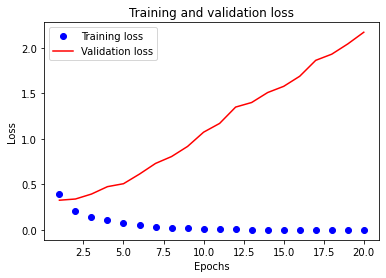

In [ ]:

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

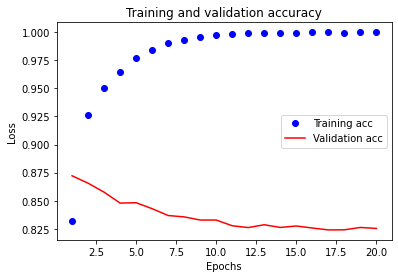

In [ ]:
plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

__TF-IDF not normalized?__

In the above setting, TFIDF in keras texts_to_matrix produce non normalized values. This is because the IDF ~= 1/DF, but log(1+DF) (for math convenience the log is calculated): http://www.tfidf.com/

https://github.com/keras-team/keras/issues/2974

For this bug, it's better to use sklearn TfidfVectorizer

# tok.texts_to_matrix(mode= 'tfidf') <-- عن طريق الاداه دي keras في TFIDF اللي حصل فوق ده ان ال

# كبير overfitting فعشان كده بيحصل Deep NN للقيم قبل ماتدخل لل normalization مش بتعمل

#  sklearn TfidfVectorizer هنستخدم normalization فعشان نحل المشكله دي ونقدر نعمل

__Using sklearn TfidfVectorizer__


In [ ]:
from sklearn.feature_extraction.text import TfidfVectorizer

vocab_sz = 10000
vectorizer = TfidfVectorizer(max_features= vocab_sz)
vectorizer.fit(train_texts + test_texts)

X_train = vectorizer.transform(train_texts)
X_train = X_train.toarray()
X_test= vectorizer.transform(test_texts)
X_test= X_test.toarray()

y_train = np.asarray(train_labels).astype('float32')
y_test = np.asarray(test_labels).astype('float32')

X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.4, random_state=42)

In [ ]:
# بتاعتها هلاقيها كدا min وال max فلو مسكنا الجمله الاولي وبصينا علي ال
print(X_train[0].max())
print(X_train[0].min())

0.5541698395113478
0.0


In [ ]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.metrics import binary_accuracy


model = models.Sequential()
model.add(layers.Dense(16, activation='relu', input_shape=(vocab_sz,)))
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer= RMSprop(lr=0.001),
              loss= binary_crossentropy,
              metrics= [binary_accuracy])
			  
history = model.fit(X_train,
                    y_train,
                    epochs=20,
                    batch_size=512,
                    validation_data=(X_val, y_val))
history_dict = history.history
history_dict.keys()

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


Epoch 1/20
49/49 [==============================] - 2s 26ms/step - loss: 0.6105 - binary_accuracy: 0.8196 - val_loss: 0.5367 - val_binary_accuracy: 0.8452
Epoch 2/20
49/49 [==============================] - 1s 19ms/step - loss: 0.4367 - binary_accuracy: 0.8850 - val_loss: 0.4045 - val_binary_accuracy: 0.8654
Epoch 3/20
49/49 [==============================] - 1s 17ms/step - loss: 0.3116 - binary_accuracy: 0.9033 - val_loss: 0.3292 - val_binary_accuracy: 0.8741
Epoch 4/20
49/49 [==============================] - 1s 17ms/step - loss: 0.2387 - binary_accuracy: 0.9168 - val_loss: 0.2970 - val_binary_accuracy: 0.8766
Epoch 5/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1974 - binary_accuracy: 0.9272 - val_loss: 0.2939 - val_binary_accuracy: 0.8753
Epoch 6/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1724 - binary_accuracy: 0.9370 - val_loss: 0.2960 - val_binary_accuracy: 0.8759
Epoch 7/20
49/49 [==============================] - 1s 17ms/step - los

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

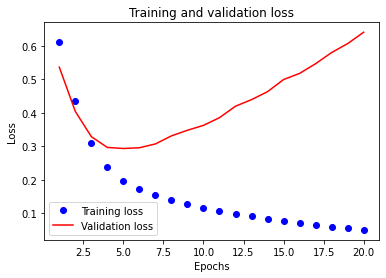

In [ ]:

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

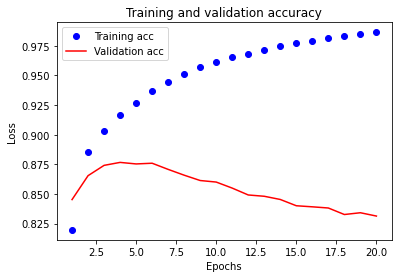

In [ ]:
plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

# Normalization قل كتير بسبب وجود Overfitting حصل فرق كبير وال Sklearn TfidfVectorizer فعلا في ال
____________________________________________
____________________________________________
____________________________________________


## Let's see the effect without text cleaning steps:

In [ ]:
# normalize_corpus بتاعت Function يعني مش هنعديها علي ال Pre-Processing هنجرب نشتغل علي الداتا من غير مانعمل عليها

train_texts,train_labels = get_texts(PATH/'train')
test_texts,test_labels = get_texts(PATH/'test')

# train_texts = normalize_corpus(train_texts)
# test_texts = normalize_corpus(test_texts)

vocab_sz = 10000
tok = Tokenizer(num_words=vocab_sz, oov_token='UNK')
tok.fit_on_texts(train_texts + test_texts)
#vocab_sz = len(tok.word_index)

# Extract binary BoW features
X_train = tok.texts_to_matrix(train_texts, mode='binary')
X_test = tok.texts_to_matrix(test_texts, mode='binary')
y_train = np.asarray(train_labels).astype('float32')
y_test = np.asarray(test_labels).astype('float32')

from sklearn.model_selection import train_test_split

X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.4, random_state=42)

from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.metrics import binary_accuracy

model = models.Sequential()
model.add(layers.Dense(16, activation='relu', input_shape=(10000,)))
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))

model.compile(optimizer= RMSprop(lr=0.001),
              loss= binary_crossentropy,
              metrics= [binary_accuracy])
			  
history = model.fit(X_train,
                    y_train,
                    epochs=20,
                    batch_size=512,
                    validation_data=(X_val, y_val))
history_dict = history.history
history_dict.keys()

/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


Epoch 1/20
49/49 [==============================] - 2s 26ms/step - loss: 0.4413 - binary_accuracy: 0.8183 - val_loss: 0.3220 - val_binary_accuracy: 0.8880
Epoch 2/20
49/49 [==============================] - 1s 17ms/step - loss: 0.2530 - binary_accuracy: 0.9101 - val_loss: 0.2805 - val_binary_accuracy: 0.8907
Epoch 3/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1985 - binary_accuracy: 0.9286 - val_loss: 0.2877 - val_binary_accuracy: 0.8840
Epoch 4/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1673 - binary_accuracy: 0.9390 - val_loss: 0.3158 - val_binary_accuracy: 0.8755
Epoch 5/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1431 - binary_accuracy: 0.9505 - val_loss: 0.3271 - val_binary_accuracy: 0.8732
Epoch 6/20
49/49 [==============================] - 1s 17ms/step - loss: 0.1308 - binary_accuracy: 0.9525 - val_loss: 0.3468 - val_binary_accuracy: 0.8726
Epoch 7/20
49/49 [==============================] - 1s 17ms/step - los

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

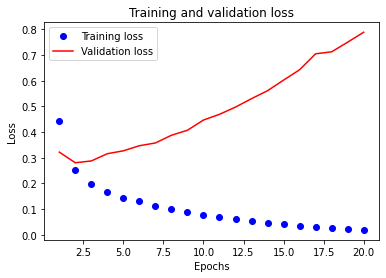

In [ ]:

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

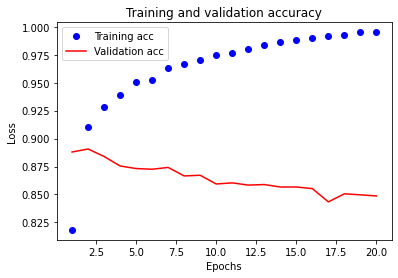

In [ ]:

plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

As you can see, the effect is minimal, but the val curve a bit smoother in case of text clean-up

# Why?

We already limit the vocab to the most frequent 10K words, and we use BoW features, so cleanining up the text has minimal effect, since the words context is neglected (high frequent words are likely to always be scored no matter different morphologies might be missed sometimes).

For sequence models for example with word embeddings (as we will see), the context of the word will have strong effect, so the clean up step will have more importance.

# Word Embedding
A word embedding is a class of approaches for representing words and documents using a
dense vector representation. It is an improvement over more the traditional bag-of-word model
encoding schemes where large sparse vectors were used to represent each word or to score each
word within a vector to represent an entire vocabulary. These representations were sparse
because the vocabularies were vast and a given word or document would be represented by a
large vector comprised mostly of zero values.
Instead, in an embedding, words are represented by dense vectors where a vector represents
the projection of the word into a continuous vector space. The position of a word within the
vector space is learned from text and is based on the words that surround the word when it is
used. The position of a word in the learned vector space is referred to as its embedding. Two
popular examples of methods of learning word embeddings from text include:

- Word2Vec.
- GloVe.
In addition to these carefully designed methods, a word embedding can be learned as part
of a deep learning model. This can be a slower approach, but tailors the model to a specic
training dataset.

# Keras Embedding Layer
Keras offers an Embedding layer that can be used for neural networks on text data. 

You can think of it as:
- LUT
- Weight Matrix: n_vocab x emb_sz

It requires that the input data be integer encoded, so that each word is represented by a unique integer.

This data preparation step can be performed using the Tokenizer API also provided with Keras.


The Embedding layer is initialized with random weights and will learn an embedding for all of the words in the training dataset. 

It is a layer that can be used in a variety of ways, such as:

- _From scratch embeddings_ It can be used alone to learn a word embedding that can be saved and used in another model later.

- _Learnable embeddings_ It can be used as part of a deep learning model where the embedding is learned along with the model itself.

- _Pre-trained embeddings_ It can be used to load a pre-trained word embedding model, a type of transfer learning. This can be mixed with learnable embeddings, where those weights are later updated or frozen as part of the larger model.


The Embedding layer is defined as the first hidden layer of a network. It must specify 3 arguments:
- input dim: This is the size of the vocabulary in the text data. For example, if your data is integer encoded to values between 0-10, then the size of the vocabulary would be 11 words.

- output dim: This is the size of the vector space in which words will be embedded. It defines the size of the output vectors from this layer for each word. For example, it could be 32 or 100 or even larger. Test different values for your problem.

-  input length: This is the length of input sequences, as you would dene for any input layer of a Keras model. For example, if all of your input documents are comprised of 1000 words, this would be 1000.

The Embedding layer has weights that are learned. If you save your model to file, this will include weights for the Embedding layer. 

The output of the Embedding layer is a 2D vector with one embedding for each word in the input sequence of words (input document). 

If you wish to connect a Dense layer directly to an Embedding layer, you must first flatten the 2D output matrix to a 1D vector using the Flatten layer. 

Now, let's see how we can use an Embedding layer in practice.

# Example

we will look at how we can learn a word embedding while setting a neural
network on a text classifiation problem. We will define a small problem where we have 10 text documents, each with a comment about a piece of work a student submitted. 

Each text document is classified as positive 1 or negative 0. This is a simple sentiment analysis problem.
First, we will dene the documents and their class labels.

Keras provides the one hot() function that creates a
hash of each word as an efficient integer encoding. We will estimate the vocabulary size of 50,
which is much larger than needed to reduce the probability of collisions from the hash function.

# Padding

The vectors we obtain are generally not of equal lengths:


- As you can see, the UNK token is added with index = 1. Index 0 is never given.

This info is important when dealing later with Embedding layer in Keras, where padding with 0's might cause OOV if not considered, so we init that layer with vocab_size + 1 (to account for the missing 0). That layer also has option to mask_zero if needed for LSTM.

Another solution would be to -1 from all binarized values. But this would make padded words same as UNK.

In other words, it's a choice to have two different values for:

A- UNK-->1
B- PAD-->0

In this case, the vocab_sz should increase by 1 (for pad), in case the model needs padding like LSTM.

Or keep them both as 0. In this case, the vocab_sz remains the same as given from the tokenizer.

- If you fit a tokenizer wil small vocab using num_words, then take care that the word_index will still hold the full vocab.Then if you vectorize the text, either use tokenizer.texts_to_sequences, which will take care of the passed num_words,or if you develop ur own str2idx dict, then take care of the vocab not to use word_index as is, but limit it with the num_words, __keeping in mind that word_index is ordered by freqeuency__. A better approach is to build your own vocab


### ونعرف بتعمل ايه Embedding قبل مانتكلم عن ال Padding في البدايه هتكلم عن حاجه اسمها

### النصوص اللي بتبقي داخله مش بتبقي نفس الطول يعني بلاقي جمل اطول من جمل وده طبيعي

### كده CNN اللي داخلالها تبقي نفس الطول زي ال input لازم المصفوفه بتاعت ال supervised learning بتاعت ال models معظم ال

### ونوحد ابعادهم يعني يبقوا نفس عدد الصفوف ونفس عدد الاعمده resize ماكنش ينفع اننا ندخل الصور مش نفس الطول فكنا بنعملها 

##### بقي في استثناء يعني مش لازم يبقي للنصوص اللي داخله نفس الطول موحد وده طبيعي صعب تلاقي تعليقات الناس نفس عدد الكلمات يعني اكيد في حد اتكلم كتير وحد اتكلم قليل وهكذا RNNs ال

#### بتهتم بده ولازم يبقوا موحدين keras تانيه غير frameworks ففي length vectors بتتغاضي عن توحيد طول ال RNNs بالنسبه لل frameworks مش كل ال

###  علي اطول جمله فيهم padding فعشان كده هنعملها وهنريح دماغنا عن طريق اننا نعمل 


In [9]:
# النصوص اللي بتبقي داخله مش بتبقي نفس الطول يعني بلاقي جمل اطول من جمل وده طبيعي فهنا انا عندي نصين واحد 3 كلمات وواحد 2 بس 
docs = ['cartoon movie show', 'hello world']

vocab_sz= 10000
tok = Tokenizer(num_words= vocab_sz, oov_token='UNK')        # Ram كله لكن بخصصه وقت مايبقي في مشكله في ال vocabulary كده بياخد ال default لانه ك num_words يعني انا مش بكتب الباراميتر ده default في العادي ك
tok.fit_on_texts(train_texts + test_texts)
l = tok.texts_to_sequences(docs)             # indexs بتاعتها وهيرجعلي كل جمله زي ماهي بس مش كلما بقي لا index بتاعها يعني ال sequences فهنا هيحولي كل كلمه لل
l

[[687, 2, 19], [4224, 96]]

In [10]:
from keras.preprocessing.sequence import pad_sequences

texts= train_texts + test_texts
maxlen = max([len(t.split()) for t in texts])         # بتاع كل جمله لحد مايبقي طولها 1428 vector لكل الجمل لحد مايبقي طولها 1428 بأني هضيف اصفار في نهايه كل Padding طولها 1428 كلمه فبالتالي هعمل texts علي طولها فلقينا اطول جمله في ال Padding اولا هلوب علي النصوص كلها وهجيب اطول جمله لان دي اللي هعمل 
pad= pad_sequences(l, maxlen=maxlen, padding='post', truncating='post')     # padding= 'post  --> vector في نهايه ال padding يعني ضفلي الاصفار بتاعت ال
pad

array([[ 687,    2,   19, ...,    0,    0,    0],
       [4224,   96,    0, ...,    0,    0,    0]], dtype=int32)

In [11]:
pad.shape

(2, 1428)

# واشوف النتيجه Word Embedding من غير Padding هعمل موديل بأستخدام ال

In [26]:
# vocab_sz أنا هنا بجيب حجم كل المعجم عشان هباصيه تحت لل
tok = Tokenizer(oov_token='UNK')
tok.fit_on_texts(train_texts + test_texts)
all_vocab_sz= len(tok.word_index)
all_vocab_sz

140833

In [27]:

vocab_sz= all_vocab_sz                                    # بتاعها ب 1 خلاص .. وبكده هيكون ده غرض من اننا استخدمنا حجم المعجم كله مش 10000 او جزء يعني منه index وغالباً كده مش هنلاقي كلمات غير معرفه لان ساعتها هتبقي كلها معرفه يعني مش هنلاقي كلمات ال index ب 1 ... فكده خلاص كل الكلمات هنلاقيلها index بتاعها الصحيح من غير ماكون مأيده في 10000 بس ويضطر انه لما كان بيجيله اي كلمه خارج ال 10000 كانت بتبقي غير معرفه ويديها index فخلاص لما هاخد حجم المعجم كله مش هيأثر علي طول الجمله انما هستفيد منه وهيأثرلي علي انه هيعوضلي مكان كل كلمه بال maxlen كده كده فبما ان كده كده حجم الجمل هتاخد طول ال maxlen بسبب اني كنت محدده ب 10000 وكنت بضطر أعمل كده عشان كان الجمل بتاعتي طولها بيبقي بالحجم اللي بحدده ده اللي هو 10000 فلو مكنتش بحدده فكان هيبقي حجم الجمل يعني طول الجمل بطول كل المعجم ... إنما هنا الوضع مختلف لأن هنا لو انا خدت طول المعجم كله الجمل مش هتاخد طول المعجم كله لا هتاخد طول ال UNK بتاعها ب 1 لان كانت بتبقي غير معرفه index بتاعها الصح لان لما كنت بحدد المعجم قبل كده ب 10000 كان بيبقي في كلمات كتير بيتم تعويض ال index فأحنا عايزين كل كلمات الجمل اللي عندنا يتحط ال vocabulary بتاعها من ال index للجمل يعني هيشيل كل كلمه من الجمله وهيحطلي الرقم او ال indexing بيساوي كل حجم المعجم مش 10000 زي اللي فاتوا .. فأنا عملت كدا لان في اللي فاتو كنت بحدد طول كل جمله ب 10000 إنما هنا انا لما خدت حجم المعجم كله فهو كدا هيحولي الجمل يعني هيعملي vocab_sz تب أنا هنا ليه خليت ال
tok = Tokenizer(num_words= vocab_sz, oov_token='UNK')     # Ram كله لكن بخصصه وقت مايبقي في مشكله في ال vocabulary كده بياخد ال default لانه ك num_words يعني انا مش بكتب الباراميتر ده default في العادي ك
tok.fit_on_texts(train_texts + test_texts)
l_train = tok.texts_to_sequences(train_texts)             # بتاعها index بتاعها يعني ال sequences فهنا هيحولي كل كلمه ل
l_test = tok.texts_to_sequences(test_texts)               # بتاعها index بتاعها يعني ال sequences فهنا هيحولي كل كلمه ل

texts= train_texts + test_texts
maxlen = max([len(t.split()) for t in texts])
X_train= pad_sequences(l_train, maxlen=maxlen, padding='post', truncating='post')
X_test= pad_sequences(l_test, maxlen=maxlen, padding='post', truncating='post')


In [28]:
print(X_train.shape)
X_train

(25000, 1428)


array([[ 195,   22,  111, ...,    0,    0,    0],
       [ 159,  511,  613, ...,    0,    0,    0],
       [ 380,  214,    3, ...,    0,    0,    0],
       ...,
       [  32,  130,    2, ...,    0,    0,    0],
       [   2,  376,   65, ...,    0,    0,    0],
       [2915, 1813,   31, ...,    0,    0,    0]], dtype=int32)

In [29]:
print(X_test.shape)
X_test

(25000, 1428)


array([[  1253,   1288,  48270, ...,      0,      0,      0],
       [   284,     82,   1218, ...,      0,      0,      0],
       [    58, 100273,  13435, ...,      0,      0,      0],
       ...,
       [    69,   5235,   3589, ...,      0,      0,      0],
       [   220,    891,    107, ...,      0,      0,      0],
       [   705,   1453,   1949, ...,      0,      0,      0]], dtype=int32)

In [30]:
y_train = np.asarray(train_labels).astype('float32')
y_test = np.asarray(test_labels).astype('float32')
                                                                                                      # default [shuffle = True]
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.4, random_state=42)       # test & validation split لل Shuffle كده حصل

In [31]:
print('X_train shape:  {}'.format(X_train.shape))
print('X_val shape:    {}'.format(X_val.shape))
print('X_test shape:   {}'.format(X_test.shape))
print('==============================')
print('y_train shape:  {}'.format(y_train.shape))
print('y_val shape:    {}'.format(y_val.shape))
print('y_test shape:   {}'.format(y_test.shape))

X_train shape:  (25000, 1428)
X_val shape:    (10000, 1428)
X_test shape:   (15000, 1428)
y_train shape:  (25000,)
y_val shape:    (10000,)
y_test shape:   (15000,)


In [33]:
len(X_train[0])

1428

In [34]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.metrics import binary_accuracy

model = Sequential()
model.add( Dense(16, activation='relu', input_shape=(maxlen,)) )          # here [input_shape] must be as max_length texts,  this layer will be a very weights for this neuron network because i have shape 1428 and 16 neurons so the weights is (1428 * 16 = 22848 weight) is a very high weights for this network so this is one of the Bag Of Words disadvantages.
model.add( Dense(16, activation='relu') )
model.add( Dense(1, activation='sigmoid') )                              # sigmoid because i have 2 classes for labels (0 & 1)

model.compile(optimizer= RMSprop(lr=0.001),
              loss= binary_crossentropy,
              metrics=[binary_accuracy])
model.summary()

history = model.fit(X_train,
                    y_train,
                    epochs=20,
                    batch_size=512,
                    validation_data=(X_val, y_val))
history_dict = history.history
history_dict.keys()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 16)                22864     
                                                                 
 dense_1 (Dense)             (None, 16)                272       
                                                                 
 dense_2 (Dense)             (None, 1)                 17        
                                                                 
Total params: 23,153
Trainable params: 23,153
Non-trainable params: 0
_________________________________________________________________


/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


Epoch 1/20
49/49 [==============================] - 5s 9ms/step - loss: 121.2536 - binary_accuracy: 0.5013 - val_loss: 56.2255 - val_binary_accuracy: 0.5159
Epoch 2/20
49/49 [==============================] - 0s 6ms/step - loss: 15.6919 - binary_accuracy: 0.5094 - val_loss: 13.2963 - val_binary_accuracy: 0.5010
Epoch 3/20
49/49 [==============================] - 0s 6ms/step - loss: 3.1245 - binary_accuracy: 0.5103 - val_loss: 3.9776 - val_binary_accuracy: 0.5098
Epoch 4/20
49/49 [==============================] - 0s 6ms/step - loss: 1.2072 - binary_accuracy: 0.5112 - val_loss: 2.4094 - val_binary_accuracy: 0.5095
Epoch 5/20
49/49 [==============================] - 0s 6ms/step - loss: 0.8949 - binary_accuracy: 0.5078 - val_loss: 1.7134 - val_binary_accuracy: 0.5070
Epoch 6/20
49/49 [==============================] - 0s 6ms/step - loss: 0.7778 - binary_accuracy: 0.5099 - val_loss: 1.3802 - val_binary_accuracy: 0.5038
Epoch 7/20
49/49 [==============================] - 0s 6ms/step - loss:

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

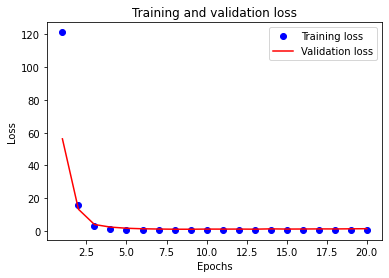

In [35]:
import matplotlib.pyplot as plt

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

# "bo" is for "blue dot"
plt.plot(epochs, loss, 'bo', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()              

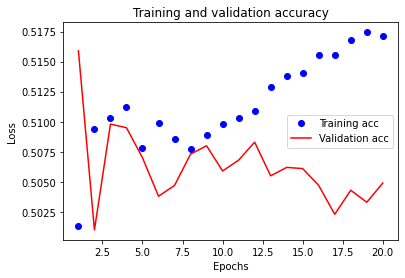

In [36]:
plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()                 # اللي كملي باقي الجمل ب أصفار 0 padding لكل جمله وده بسبب ال input vector واللي معناها اني عندي اصفار كتير في ال input الكبيره دي في ال sparsity علي الفاضي بسبب كميه ال input بسبب ضخامه ال overfitting هنلاحظ ال

# Bag-of-word Vectors:

Th above model suffers two issues:

1- Sequence info is lost. We will treat that later with sequence models

2- __Sparsity__: the input scalars represent words indices. Those are sparse, and do not include any info about the word (is it a verb, is it a noun, is it a sarcastic word,....etc). Also, this input is very sparse, where in a sentence, we only have few words of the vocab.

Thus, we use `Embedding` layer, that will encode _latent_ factors of the word features. In the current setup, we will _learn_ what those latent features are during training.


#### وكانت النتيجه زي الزفت وده طبعا غلط Word Embedding من غير ما استخدم ال padding الموديل اللي فات ده انا استخدمت ال

### معناها المعني المتداخل للكلمات واللي من خلالها بعرف ارتباط معاني الكلمات اللي زي بعضها Word Embedding ال

### واللي من خلالها يكون للخوارزم له القدره علي معرفه الكلمات المناسبه لبعضها البعض

### One hot vector واللي احنا بنعرفها ب Word Representation لازم افهم ال  Word Embedding وعشان افهم

### اللي هعمله من النصوص اللي عندي vocabulary طوله بعدد كلمات ال vector ولكل كلمه ليها

### vocabulary بتاع الكلمه دي اللي وخداه من ال index بتاع كل كلمه 1 مكان ال vector وبحط في ال

### دي مصفوفه بتبقي عدد صفوفها مجموعه كبيره من كلمات اللغة واعمدتها عباره عن خصائص Embedded Matrix ال

# الخصائص دي بتبقي اسأله معينه او تفاصيل معينه عن كل كلمه وكل خاصيه لكل كلمه بتبقي رقم مابين -1 و 1

### فلو عندي 50 خاصيه فهلاقي ان كل كلمه عباره عن فيكتور من 50 رقم حيث كل رقم بيمثل خاصيه للكلمه دي

### وبتبقي لكل كلمه 300 خاصيه تقريبا Spacy دي بتبقي موجوده اوتوماتيك في كثير من المكتبات زي Embedded Matrix ال 

### دي للكلمه دي one hot vector مابين ال Dot prodect لكل كلمه هعمل  embedded vector فعشان اجيب ال

### للكلمه دي طلعتلي embedded vector لجميع الكلمات فهلاقي ان ال Embedded Matrix و ال 
 

_________________________

In [38]:
vocab_size= all_vocab_sz
vocab_size

140833

In [39]:
# [3 parameters] للكلمه دي ... وبديها embedded vector اللي هي بتبقي اوتوماتيك في كيراس للحصول علي ال Embedding Matrix مابينها وما بين ال Dot Prodect ومن ثم عمل One Hot Vector بيحصل فيها الحاجات اللي قولنا عليها فوق دي اوتوماتيك يعني بيتم تحويل كل كلمه ل keras بستدعيها من layer بتبقي عباره عن Embedding ال
# vocab_size +1  ============>   len of Vocabulary + 1 for padding  ---  Vocabulary بتاعها هو الصفر في ال index واللي بيبقي ال padding لل index فال 1 دي عشان احجز مكان او
# n_latent_factors  =========>   الكبيره فممكن اكبره ل 300 models يعني ممكن ازوده في ال hyperparameter الصغيره ولكن الافضل من اني اثبتها ب 50 اني اقسم حجم المعجم بتاعي علي 2 واقارن ناتج القسمه اللي هيطلع ده ب ال 50 واخد الاصغر فيهم فلو الناتج اصغر فهخده ك عدد للخصائص انما لو أكبر فهاخد ال 50 وطبعا ال 50 دي يعتبر models ودي انا بحددها ب 50 في ال word embedding يعني انت عايز كام خاصيه لل [n_latent_factors]
# input_length= max_length ==>   علي اساسه يعني هملي باقي الجمل التانيه ب أصفار عشان تبقي بنفس طول أطول جمله دي وبكده اكون سويت طول كل الجمل بنفس الطول Padding اللي عندي واشوف انهي اطول جمله فيهم فيها كلمات اكتر وبعدد كلماتها هعمل ال Sentences واللي هي اني ألوب علي كل ال

from keras.layers.embeddings import Embedding
model.add( Embedding(vocab_size +1, n_latent_factors, input_length= max_length) )
model.add(Flatten())         # واحد بيعبر عن الجمله دي كلها embedding vector بيتمزجوا مع بعض كلهم بحيث يعملولي Flatten فلما بعمل embedding vector علي طول لان اصلا انا عندي لكل كلمه في الجمله الواحده Embedding layer بعد ال  Flatten لازم اعمل


In [40]:
# من عندي لكل جمله بتقولي اذا كانت الجمله دي ايجابيه ولا سلبيه labels انا هنا هعمل موديل صغير كده من جمل صغيره و

from keras.preprocessing.sequence import pad_sequences
from keras.preprocessing.text import Tokenizer
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras.layers.embeddings import Embedding

docs = ['Well done!', 'Good work', 'Great effort',
        'nice work', 'Excellent!', 'Weak', 
        'Poor effort!', 'not good', 'poor work',
        'Could have done better.']

# define class labels (0 -> negative), (1 -> positive)
labels = [1,1,1,1,1,0,0,0,0,0]

# Built vocabulary:
tok = Tokenizer(oov_token= 'UNK')
tok.fit_on_texts(docs)
vocab_size = len(tok.word_index) +1              # len of Vocabulary + 1 for padding (which is the index number 0)

# print vocabulary:
print(tok.word_index)

# integer encode the documents
encoded_docs = tok.texts_to_sequences(docs)      # indexs بتاعتها وهيرجعلي كل جمله زي ماهي بس مش كلما بقي لا index بتاعها يعني ال sequences فهنا هيحولي كل كلمه لل 
print(encoded_docs)

# i will loop on all documents to get the maximum sentence to make padding on it:
max_length = max([len(d.split()) for d in docs])
padded_docs = pad_sequences(encoded_docs, maxlen=max_length, padding='post')
print(padded_docs)

# define the model
n_latent_factors= min(vocab_size//2, 50)         # الكبيره فممكن اكبره ل 300 models يعني ممكن ازوده في ال hyperparameter الصغيره ولكن الافضل من اني اثبتها ب 50 اني اقسم حجم المعجم بتاعي علي 2 واقارن الناتج اللي هيطلع ب ال 50 واخد الاصغر فلو الناتج اصغر فهخده ك عدد للخصائص انما لو أكبر فهاخد ال 50 وطبعا ال 50 دي يعتبر models ودي انا بحددها ب 50 في ال word embedding يعني انت عايز كام خاصيه لل [n_latent_factors]
model = Sequential()
model.add(Embedding(vocab_size, n_latent_factors, input_length= max_length))
model.add(Flatten())            
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
model.summary()

labels= np.array(labels)     # (y data) must convert to array like (X data) before enter it Deep NN
model.fit(padded_docs, labels, epochs=50, verbose=1)

# evaluate the model
loss, accuracy = model.evaluate(padded_docs, labels, verbose=0)
print('Loss: %f' % (loss))
print('Accuracy: %f' % (accuracy*100))


{'UNK': 1, 'work': 2, 'done': 3, 'good': 4, 'effort': 5, 'poor': 6, 'well': 7, 'great': 8, 'nice': 9, 'excellent': 10, 'weak': 11, 'not': 12, 'could': 13, 'have': 14, 'better': 15}
[[7, 3], [4, 2], [8, 5], [9, 2], [10], [11], [6, 5], [12, 4], [6, 2], [13, 14, 3, 15]]
[[ 7  3  0  0]
 [ 4  2  0  0]
 [ 8  5  0  0]
 [ 9  2  0  0]
 [10  0  0  0]
 [11  0  0  0]
 [ 6  5  0  0]
 [12  4  0  0]
 [ 6  2  0  0]
 [13 14  3 15]]
Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 4, 8)              128       
                                                                 
 flatten (Flatten)           (None, 32)                0         
                                                                 
 dense_3 (Dense)             (None, 1)                 33        
                                                                 
Total params: 161
Trainable par

# الاساسي بتاعي task علي ال Word Embedding وال Padding هنا بقي هعمل ال 

In [41]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras.layers.embeddings import Embedding

# Built vocabulary:
texts= train_texts + test_texts
tok = Tokenizer(oov_token= 'UNK')                  # all_vocab_sz فبالتالي هياخد حجم المعجم كله اللي هو Vocabulary يعني ماحددتش انا عايز قد ايه من حجم ال num_words هنا بما اني ماحددتش ال
tok.fit_on_texts(texts)
vocab_size = len(tok.word_index) +1

# integer encode the documents
l_train = tok.texts_to_sequences(train_texts)      # indexes زي ماهي بس مش كلمات بقي لا train_texts بتاعتها وهيرجعلي كل جمله من جمل ال  index بتاعها يعني ال sequences فهنا هيحولي كل كلمه لل 
l_test = tok.texts_to_sequences(test_texts)        # indexes زي ماهي بس مش كلمات بقي لا test_texts بتاعتها وهيرجعلي كل جمله من جمل ال  index بتاعها يعني ال sequences فهنا هيحولي كل كلمه لل 
print(l_train)
print(l_test)

# i will loop on all sentences to get the maximum sentence to make padding on it:
max_length = max([len(t.split()) for t in texts])
X_train = pad_sequences(l_train, maxlen= max_length, padding='post')
X_test = pad_sequences(l_test, maxlen= max_length, padding='post')
print(X_train)
print(X_test)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[ 195   22  111 ...    0    0    0]
 [ 159  511  613 ...    0    0    0]
 [ 380  214    3 ...    0    0    0]
 ...
 [  32  130    2 ...    0    0    0]
 [   2  376   65 ...    0    0    0]
 [2915 1813   31 ...    0    0    0]]
[[  1253   1288  48270 ...      0      0      0]
 [   284     82   1218 ...      0      0      0]
 [    58 100273  13435 ...      0      0      0]
 ...
 [    69   5235   3589 ...      0      0      0]
 [   220    891    107 ...      0      0      0]
 [   705   1453   1949 ...      0      0      0]]


In [42]:
# convert y_train & y_test to numpy array to enter it to NN:
y_train = np.asarray(train_labels).astype('float32')
y_test = np.asarray(test_labels).astype('float32')

# train & validation split:     shuffile عشان نعمل
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.4, random_state=42)


print('X_train shape:  {}'.format(X_train.shape))
print('X_val shape:    {}'.format(X_val.shape))
print('X_test shape:   {}'.format(X_test.shape))
print('==============================')
print('y_train shape:  {}'.format(y_train.shape))
print('y_val shape:    {}'.format(y_val.shape))
print('y_test shape:   {}'.format(y_test.shape))


X_train shape:  (25000, 1428)
X_val shape:    (10000, 1428)
X_test shape:   (15000, 1428)
y_train shape:  (25000,)
y_val shape:    (10000,)
y_test shape:   (15000,)


In [43]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.metrics import binary_accuracy

n_latent_factors = min(vocab_size // 2, 50)

model = models.Sequential()
model.add(layers.Embedding(vocab_size, n_latent_factors, input_length= max_length))
model.add(layers.Flatten())
model.add(layers.Dense(n_latent_factors, activation='relu'))        # وممكن اخليها غير كده بس يفضل ده n_latent_factors نفس عدد ال Embedding بعد ال Dense layer بتاعت اول neurons الافضل اني اخلي عدد ال
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))
print( plot_model(model) )

# Compiler:
model.compile(optimizer= RMSprop(learning_rate=0.001),
              loss= binary_crossentropy,
              metrics= [binary_accuracy])

# Fitting:	  
history = model.fit(X_train,
                    y_train,
                    epochs=20,
                    batch_size=512,
                    validation_data=(X_val, y_val))

history_dict = history.history
history_dict.keys()

<IPython.core.display.Image object>
Epoch 1/20
49/49 [==============================] - 2s 25ms/step - loss: 0.8213 - binary_accuracy: 0.5499 - val_loss: 0.5435 - val_binary_accuracy: 0.7922
Epoch 2/20
49/49 [==============================] - 1s 20ms/step - loss: 0.3885 - binary_accuracy: 0.8456 - val_loss: 0.3638 - val_binary_accuracy: 0.8407
Epoch 3/20
49/49 [==============================] - 1s 20ms/step - loss: 0.2182 - binary_accuracy: 0.9142 - val_loss: 0.3213 - val_binary_accuracy: 0.8661
Epoch 4/20
49/49 [==============================] - 1s 19ms/step - loss: 0.1464 - binary_accuracy: 0.9479 - val_loss: 0.3183 - val_binary_accuracy: 0.8719
Epoch 5/20
49/49 [==============================] - 1s 19ms/step - loss: 0.0953 - binary_accuracy: 0.9684 - val_loss: 0.3557 - val_binary_accuracy: 0.8670
Epoch 6/20
49/49 [==============================] - 1s 20ms/step - loss: 0.0580 - binary_accuracy: 0.9828 - val_loss: 0.4055 - val_binary_accuracy: 0.8642
Epoch 7/20
49/49 [================

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

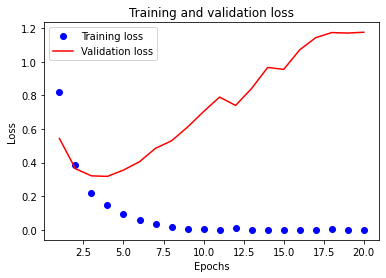

In [44]:

acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

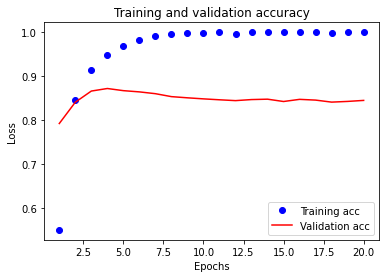

In [45]:
plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [46]:
# evaluate the training model
loss, accuracy = model.evaluate(X_train, y_train, verbose=0)
print('loss: ', loss)
print('Accuracy: %f' % (accuracy*100))

loss:  1.3827203702021507e-06
Accuracy: 100.000000


In [47]:
# evaluate the validation model
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print('loss: ', loss)
print('Accuracy: %f' % (accuracy*100))

loss:  1.1751869916915894
Accuracy: 84.480000


In [48]:
# evaluate the testing model
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print('loss: ', loss)
print('Accuracy: %f' % (accuracy*100))

loss:  1.2148076295852661
Accuracy: 84.026664


# Pros:
- We have dense word representation
- We somehow encode sequence information, since the inputs are now word positions, and their values=the word index at that position

# Cons:
- We still have BoW model. Although sequence is encoded in the input, but the info is lost later in the flatten layer --> ___RNN___
- It's hard for the `Dense` layer to capture ALL different patterns of the input, with each word appearing at different positions for different samples.
__We need some local features, that capture the word features, __wherever__ it occurs --> ___Conv1D___
- The model now is larger, with too many parameters to be learnt (word latent features). So it needs more data to learn words context. --> ___word2vec___

__We will treat the above issues one by one in the next lectures__

# Tips for Cleaning Text for Word Embedding
Recently, the field of natural language processing has been moving away from bag-of-word models and word encoding toward word embeddings. 

The benefit of word embeddings is that
they encode each word into a dense vector that captures something about its relative meaning within the training text. 

This means that variations of words like case, spelling, punctuation,
and so on will automatically be learned to be similar in the embedding space. 

In turn, this can mean that the amount of cleaning required from your text may be less and perhaps quite diffeerent to classical text cleaning. 

For example, __it may no-longer make sense to stem words or
remove punctuation for contractions.__

Tomas Mikolov is one of the developers of Word2Vec, a popular word embedding method. He suggests only very minimal text cleaning is required when learning a word embedding model. Below is his response when pressed with the question about how to best prepare text data for Word2Vec.

_There is no universal answer. It all depends on what you plan to use the vectors
for. In my experience, it is usually good to disconnect (or remove) punctuation from
words, and sometimes also convert all characters to lowercase. One can also replace
all numbers (possibly greater than some constant) with some single token such as .
All these pre-processing steps aim to reduce the vocabulary size without removing
any important content (which in some cases may not be true when you lowercase
certain words, ie. `Bush' is dierent than `bush', while `Another' has usually the
same sense as `another'). The smaller the vocabulary is, the lower is the memory
complexity, and the more robustly are the parameters for the words estimated. You
also have to pre-process the test data in the same way.
[...]
In short, you will understand all this much better if you will run experiments.
| Tomas Mikolov, word2vec-toolkit: google groups thread., 2015.
https://goo.gl/KtDGst_

# Pre-trained word Embeddings

In the above setting, we used a _learnable_ `Embedding` layer, which updates its ___randomly___ initialized weights, from the task at hand.

Another approach would be to load some pre-trained word vectors, that are trained on some other useful task in NLP, and then use those pre-trained vectors to initialize our Embedding table vectors.

One of the popular pre-trained embeddings is _GloVe_

# Loading GloVe

The Keras Embedding layer can also use a word embedding learned elsewhere. It is common in the NLP to learn, save, and make freely available word
embeddings. For example, the researchers behind GloVe method provide a suite of pre-trained word embeddings on their website released under a public domain license.

__Load embeddings for your vocab__

We need to create a matrix of one embedding for each word in the training
dataset. We can do that by enumerating all unique words in the Tokenizer.word index and
locating the embedding weight vector from the loaded GloVe embedding. The result is a matrix
of weights only for words we will see during training.

```
# create a weight matrix for words in training docs
embedding_matrix = zeros((vocab_size, 100))
for word, i in t.word_index.items():
  embedding_vector = embeddings_index.get(word)
  if embedding_vector is not None:
    embedding_matrix[i] = embedding_vector
```

Now we can dene our model, t, and evaluate it as before. The key dierence is that
the Embedding layer can be seeded with the GloVe word embedding weights. We chose the
100-dimensional version, therefore the Embedding layer must be dened with output dim set to
100. Finally, we do not want to update the learned word weights in this model, therefore we
will set the trainable attribute for the model to be False.

```
e = Embedding(vocab_size, 100, weights=[embedding_matrix], input_length=4, trainable=False)
```

### Stanford وده مجموعه ملفات مقدمة من Global vectors forward Representation ده اختصار ل Glove ال

### : وهما 4 ملفات بيضموا عدد ضخمم من الكلمات الانجليزيه وهما
### glove.6B.50d.txt   ---> بتاعتهم فيها 50 خاصيه يعني 50 قيمه word embedding vector ملف بيضم 6 مليار كلمه انجليزيه وال
### glove.6B.100d.txt  ---> بتاعتهم فيها 100 خاصيه يعني 100 قيمه word embedding vector ملف بيضم 6 مليار كلمه انجليزيه وال
### glove.6B.200d.txt  ---> بتاعتهم فيها 200 خاصيه يعني 200 قيمه word embedding vector ملف بيضم 6 مليار كلمه انجليزيه وال
### glove.6B.300d.txt  ---> بتاعتهم فيها 300 خاصيه يعني 300 قيمه word embedding vector ملف بيضم 6 مليار كلمه انجليزيه وال

### عليت جداً NLP بتاعها قريب من بعض واللي من خلاله كفاءه ال embedding كل كلمه ليها خصائص عنها فبالتالي قدرنا نعرف ايه الكلمات اللي ال

In [49]:
# Download Glove files:

!wget http://nlp.stanford.edu/data/glove.6B.zip
!unzip glove.6B.zip

--2022-07-01 22:38:45--  http://nlp.stanford.edu/data/glove.6B.zip
Resolving nlp.stanford.edu (nlp.stanford.edu)... 171.64.67.140
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:80... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://nlp.stanford.edu/data/glove.6B.zip [following]
--2022-07-01 22:38:45--  https://nlp.stanford.edu/data/glove.6B.zip
Connecting to nlp.stanford.edu (nlp.stanford.edu)|171.64.67.140|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip [following]
--2022-07-01 22:38:46--  https://downloads.cs.stanford.edu/nlp/data/glove.6B.zip
Resolving downloads.cs.stanford.edu (downloads.cs.stanford.edu)... 171.64.64.22
Connecting to downloads.cs.stanford.edu (downloads.cs.stanford.edu)|171.64.64.22|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 862182613 (822M) [application/zip]
Saving to: ‘glove.6B.zip’

glov

In [50]:
# Unzip Glove 4 files:
!unzip glove.6B.zip.1

unzip:  cannot find or open glove.6B.zip.1, glove.6B.zip.1.zip or glove.6B.zip.1.ZIP.


In [51]:
# يعني الخصائص لكل الكلمات laten_factor واطلع ال glove text file ازاي اقرأ ال
# كلها بتبقي عباره عن 6 مليار كلمه glove يعني بيبقي في كل سطر الكلمه وجنبها الخصائص بتاعتها فلو بنتكلم علي الملف ده فبيبقي الكلمه وجنبها 100 خاصيه وطبعا ملفات ال [strings line] عموماً بيبقي عباره عن glove الملف ده او ملف ال .. 'glove.6B.100d.txt' عرفنا انا عندنا 4 ملفات ... فلو مثلا حبينا نقرأ الملف اللي هو 100 خاصيه اللي اسمه
# بتاعته هتبقي عباره عن الخصائص للكلمات دي values بتاعته هتبقي عباره عن الكلمات دي وال keys بحيث نفصل الكلمه عن الخصائص بتاعتها فهعمل قاموس ال split() كل اللي احنا هنعمله اننا هنلوب علي سطر سطر من سطور الملف ده ونعمله

embeddings_index = dict()                       # make dic to save in it (words as keys) & ( laten_factors as values)
f = open('glove.6B.100d.txt', mode='rt', encoding='utf-8')
for line in f:
  values = line.split()                         # split words from laten_factors
  word = values[0]                              # values[0] is 'words'
  coefs= values[1:]                             # values from 1 to end is 100 'laten_factors'
  coefs = np.asarray(coefs, dtype='float32')    # convert laten_factors to numpy array.
  embeddings_index[word] = coefs                # append words in dic as [keys] & laten_factors as [values]
f.close()

print('Loaded %s word vectors.' % len(embeddings_index))        # we see the length of dictonary is 400,000 words & each word with 100 laten_factor
embeddings_index

Loaded 400000 word vectors.


{'the': array([-0.038194, -0.24487 ,  0.72812 , -0.39961 ,  0.083172,  0.043953,
        -0.39141 ,  0.3344  , -0.57545 ,  0.087459,  0.28787 , -0.06731 ,
         0.30906 , -0.26384 , -0.13231 , -0.20757 ,  0.33395 , -0.33848 ,
        -0.31743 , -0.48336 ,  0.1464  , -0.37304 ,  0.34577 ,  0.052041,
         0.44946 , -0.46971 ,  0.02628 , -0.54155 , -0.15518 , -0.14107 ,
        -0.039722,  0.28277 ,  0.14393 ,  0.23464 , -0.31021 ,  0.086173,
         0.20397 ,  0.52624 ,  0.17164 , -0.082378, -0.71787 , -0.41531 ,
         0.20335 , -0.12763 ,  0.41367 ,  0.55187 ,  0.57908 , -0.33477 ,
        -0.36559 , -0.54857 , -0.062892,  0.26584 ,  0.30205 ,  0.99775 ,
        -0.80481 , -3.0243  ,  0.01254 , -0.36942 ,  2.2167  ,  0.72201 ,
        -0.24978 ,  0.92136 ,  0.034514,  0.46745 ,  1.1079  , -0.19358 ,
        -0.074575,  0.23353 , -0.052062, -0.22044 ,  0.057162, -0.15806 ,
        -0.30798 , -0.41625 ,  0.37972 ,  0.15006 , -0.53212 , -0.2055  ,
        -1.2526  ,  0.071624,  

In [52]:
import numpy as np
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers.embeddings import Embedding
from keras.layers import Flatten, Dense

docs = ['Well done!', 'Good work', 'Great effort',
        'nice work', 'Excellent!', 'Weak', 
        'Poor effort!', 'not good', 'poor work',
        'Could have done better.']

# define class labels (0 -> negative), (1 -> positive)
labels = [1,1,1,1,1,0,0,0,0,0]

# Built vocabulary:
tok = Tokenizer(oov_token= 'UNK')
tok.fit_on_texts(docs)
vocab_size = len(tok.word_index) +1              # len of Vocabulary + 1 for padding (which is the index number 0)

# print vocabulary:
print(tok.word_index)

# integer encode the documents
encoded_docs = tok.texts_to_sequences(docs)      # indexs بتاعتها وهيرجعلي كل جمله زي ماهي بس مش كلما بقي لا index بتاعها يعني ال sequences فهنا هيحولي كل كلمه لل 
print(encoded_docs)

# i will loop on all documents to get the maximum sentence to make padding on it:
max_length = max([len(d.split()) for d in docs])
padded_docs = pad_sequences(encoded_docs, maxlen= max_length, padding='post')
print(padded_docs)


# load the whole embedding into memory
embeddings_index = dict()                       # make dic to save in it (words as keys) & ( laten_factors as values)
f = open('glove.6B.100d.txt', mode='rt', encoding='utf-8')
for line in f:
  values = line.split()                         # split words from laten_factors
  word = values[0]                              # values[0] is 'words'
  coefs= values[1:]                             # values from 1 to end is 'laten_factors'
  coefs = np.asarray(coefs, dtype='float32')    # convert laten_factors to numpy array.
  embeddings_index[word] = coefs                # append words in dic as [keys] & laten_factors as [values]
f.close()
print('Loaded %s word vectors.' % len(embeddings_index))        # we see the length of dictonary is 400,000 words & each word with 100 laten_factor


# create a weight matrix for words in training docs
embedding_matrix = np.zeros((vocab_size, 100))        # now we will build embedding_matrix from (rows --> vocab_words) & (columns --> 100 glove latten factors)
for word, i in tok.word_index.items():             # tok.word_index.items()  --> which is vocabulary (words, indexes)
  embedding_vector = embeddings_index.get(word)    # embeddings_index.get(word) --> will return [laten_factors] of this word
  if embedding_vector is not None:
    embedding_matrix[i] = embedding_vector         # بتاعي vocabulary بتاعت كل كلمه من كلمات ال laten_factors اللي هيبقي فيها جميع ال embedding_matrix بتاعتها وبكده هيكون كون ال laten_factors بتاع الكلمه ال index هيروح يحط في ال

# define the model
n_latent_factors= 100          # ابو 100 خاصيه Glove عددهم هيبقي 100 لا انا جبت الخصائص بتاعت الكلمات من ملف ال
model = Sequential()
model.add(Embedding(vocab_size, n_latent_factors, weights=[embedding_matrix], input_length= max_length, trainable=False))     # weights --> اللي انا لسه عاملها فوق embedding_matrix بتاعتي هتبيقي مصفوفه ال  weights ال
model.add(Flatten())                                                                                                          # trainable=False --> اللي لسه عاملينها فوق embedding_matrix جاهزه اللي هي ال weights مبخليهوش يعمل تدريب للطبقه دي لاني بالفعل جايبله ال
model.add(Dense(1, activation='sigmoid'))

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['acc'])
model.summary()

labels= np.array(labels)     # (y data) must convert to array like (X data) before enter it Deep NN
model.fit(padded_docs, labels, epochs=50, verbose=1)

# evaluate the model
loss, accuracy = model.evaluate(padded_docs, labels, verbose=0)
print('Loss: %f' % (loss))
print('Accuracy: %f' % (accuracy*100))


{'UNK': 1, 'work': 2, 'done': 3, 'good': 4, 'effort': 5, 'poor': 6, 'well': 7, 'great': 8, 'nice': 9, 'excellent': 10, 'weak': 11, 'not': 12, 'could': 13, 'have': 14, 'better': 15}
[[7, 3], [4, 2], [8, 5], [9, 2], [10], [11], [6, 5], [12, 4], [6, 2], [13, 14, 3, 15]]
[[ 7  3  0  0]
 [ 4  2  0  0]
 [ 8  5  0  0]
 [ 9  2  0  0]
 [10  0  0  0]
 [11  0  0  0]
 [ 6  5  0  0]
 [12  4  0  0]
 [ 6  2  0  0]
 [13 14  3 15]]
Loaded 400000 word vectors.
Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding_2 (Embedding)     (None, 4, 100)            1600      
                                                                 
 flatten_2 (Flatten)         (None, 400)               0         
                                                                 
 dense_7 (Dense)             (None, 1)                 401       
                                                                 
Tot

# الاساسي بتاعي task علي ال Glove Embedding وال Padding هنا بقي هعمل ال 

In [53]:
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.layers import Dense, Flatten
from keras.layers.embeddings import Embedding

# Built vocabulary:
texts= train_texts + test_texts          # Preprocessing بعد ال clean اللي معمولهم
tok = Tokenizer(oov_token= 'UNK')
tok.fit_on_texts(texts)
vocab_size = len(tok.word_index) +1

# integer encode the documents
l_train = tok.texts_to_sequences(train_texts)      # indexes زي ماهي بس مش كلمات بقي لا train_texts بتاعتها وهيرجعلي كل جمله من جمل ال  index بتاعها يعني ال sequences فهنا هيحولي كل كلمه لل 
l_test = tok.texts_to_sequences(test_texts)        # indexes زي ماهي بس مش كلمات بقي لا test_texts بتاعتها وهيرجعلي كل جمله من جمل ال  index بتاعها يعني ال sequences فهنا هيحولي كل كلمه لل 
print(l_train)
print(l_test)

# i will loop on all sentences to get the maximum sentence to make padding on it:
max_length = max([len(t.split()) for t in texts])
X_train = pad_sequences(l_train, maxlen= max_length, padding='post')
X_test = pad_sequences(l_test, maxlen= max_length, padding='post')
print(X_train)
print(X_test)


IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



[[ 195   22  111 ...    0    0    0]
 [ 159  511  613 ...    0    0    0]
 [ 380  214    3 ...    0    0    0]
 ...
 [  32  130    2 ...    0    0    0]
 [   2  376   65 ...    0    0    0]
 [2915 1813   31 ...    0    0    0]]
[[  1253   1288  48270 ...      0      0      0]
 [   284     82   1218 ...      0      0      0]
 [    58 100273  13435 ...      0      0      0]
 ...
 [    69   5235   3589 ...      0      0      0]
 [   220    891    107 ...      0      0      0]
 [   705   1453   1949 ...      0      0      0]]


In [54]:
# convert y_train & y_test to numpy array to enter it to NN:
y_train = np.asarray(train_labels).astype('float32')
y_test = np.asarray(test_labels).astype('float32')

# test & validation split:     shuffile عشان نعمل
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.4, random_state=42)


print('X_train shape:  {}'.format(X_train.shape))
print('X_val shape:    {}'.format(X_val.shape))
print('X_test shape:   {}'.format(X_test.shape))
print('==============================')
print('y_train shape:  {}'.format(y_train.shape))
print('y_val shape:    {}'.format(y_val.shape))
print('y_test shape:   {}'.format(y_test.shape))


X_train shape:  (25000, 1428)
X_val shape:    (10000, 1428)
X_test shape:   (15000, 1428)
y_train shape:  (25000,)
y_val shape:    (10000,)
y_test shape:   (15000,)


In [55]:
# load the whole embedding into memory
embeddings_index = dict()                       # make dic to save in it (words as keys) & ( laten_factors as values)
f = open('glove.6B.100d.txt', mode='rt', encoding='utf-8')
for line in f:
  values = line.split()                         # split words from laten_factors
  word = values[0]                              # values[0] is 'words'
  coefs= values[1:]                             # values from 1 to end is 'laten_factors'
  coefs = np.asarray(coefs, dtype='float32')    # convert laten_factors to numpy array.
  embeddings_index[word] = coefs                # append words in dic as [keys] & laten_factors as [values]
f.close()
print('Loaded %s word vectors.' % len(embeddings_index))        # we see the length of dictonary is 400,000 words & each word with 100 laten_factor


# create a weight matrix for words in training docs
embedding_matrix = np.zeros((vocab_size, 100))        # now we will build embedding_matrix from (rows --> vocab_words) & (columns --> 100 glove latten factors)
for word, i in tok.word_index.items():             # tok.word_index.items()  --> which is vocabulary (words, indexs)
  embedding_vector = embeddings_index.get(word)    # embeddings_index.get(word) --> will return [laten_factors] of this word
  if embedding_vector is not None:
    embedding_matrix[i] = embedding_vector         # بتاعي vocabulary بتاعت كل كلمه من كلمات ال laten_factors اللي هيبقي فيها جميع ال embedding_matrix بتاعتها وبكده هيكون كون ال laten_factors بتاع الكلمه ال index هيروح يحط في ال


Loaded 400000 word vectors.


In [62]:
from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.metrics import binary_accuracy

n_latent_factors= 100          # ابو 100 خاصيه Glove عددهم هيبقي 100 لا انا جبت الخصائص بتاعت الكلمات من ملف ال

model = Sequential()
model.add(Embedding(vocab_size, n_latent_factors, weights=[embedding_matrix], input_length=max_length, trainable=False))     # weights --> اللي انا لسه عاملها فوق embedding_matrix بتاعتي هتبيقي مصفوفه ال  weights ال
model.add(Flatten())
model.add(layers.Dense(n_latent_factors, activation='relu'))        # وممكن اخليها غير كده بس يفضل ده n_latent_factors نفس عدد ال Embedding بعد ال Dense layer بتاعت اول neurons الافضل اني اخلي عدد ال
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))
print( plot_model(model) )

# Compiler:
model.compile(optimizer= RMSprop(learning_rate=0.001),
              loss= binary_crossentropy,
              metrics= [binary_accuracy])

# Fitting:	  
history = model.fit(X_train,
                    y_train,
                    epochs=20,
                    batch_size=512,
                    validation_data=(X_val, y_val))

history_dict = history.history
history_dict.keys()

<IPython.core.display.Image object>
Epoch 1/20
49/49 [==============================] - 2s 28ms/step - loss: 0.7193 - binary_accuracy: 0.6217 - val_loss: 0.6138 - val_binary_accuracy: 0.6579
Epoch 2/20
49/49 [==============================] - 1s 20ms/step - loss: 0.5530 - binary_accuracy: 0.7191 - val_loss: 0.5467 - val_binary_accuracy: 0.7189
Epoch 3/20
49/49 [==============================] - 1s 24ms/step - loss: 0.4768 - binary_accuracy: 0.7690 - val_loss: 0.5372 - val_binary_accuracy: 0.7300
Epoch 4/20
49/49 [==============================] - 1s 20ms/step - loss: 0.4343 - binary_accuracy: 0.7928 - val_loss: 0.5867 - val_binary_accuracy: 0.7288
Epoch 5/20
49/49 [==============================] - 1s 20ms/step - loss: 0.3814 - binary_accuracy: 0.8226 - val_loss: 0.5285 - val_binary_accuracy: 0.7432
Epoch 6/20
49/49 [==============================] - 1s 20ms/step - loss: 0.3432 - binary_accuracy: 0.8424 - val_loss: 0.5838 - val_binary_accuracy: 0.7307
Epoch 7/20
49/49 [================

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

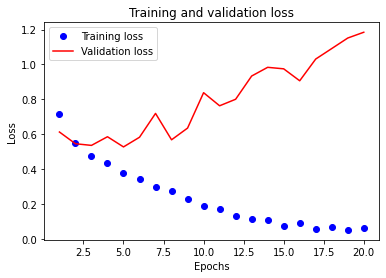

In [63]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

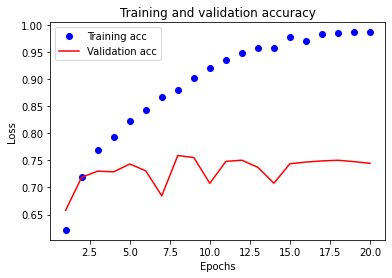

In [64]:
plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [65]:
# evaluate the training model
loss, accuracy = model.evaluate(X_train, y_train, verbose=0)
print('loss: ', loss)
print('Accuracy: %f' % (accuracy*100))

loss:  0.003530120011419058
Accuracy: 99.996001


In [66]:
# evaluate the validation model
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print('loss: ', loss)
print('Accuracy: %f' % (accuracy*100))

loss:  1.18439519405365
Accuracy: 74.449998


In [67]:
# evaluate the testing model
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print('loss: ', loss)
print('Accuracy: %f' % (accuracy*100))

loss:  1.2360812425613403
Accuracy: 74.393332


## Make `trainable= True`

In [68]:
# بتاعت المصفوفه اللي انا عاملها Weights تتدرب علي ال Embedding layer يعني هخلي ال False مش [trainable=True] تبقي Weights بس هخلي ال Glove Embedding layer المرادي هجرب اعمل ال

from tensorflow.keras.optimizers import RMSprop
from tensorflow.keras.losses import binary_crossentropy
from tensorflow.keras.metrics import binary_accuracy

n_latent_factors= 100          # ابو 100 خاصيه Glove عددهم هيبقي 100 لا انا جبت الخصائص بتاعت الكلمات من ملف ال

model = Sequential()
model.add(Embedding(vocab_size, n_latent_factors, weights=[embedding_matrix], input_length=max_length, trainable=True))     # weights --> اللي انا لسه عاملها فوق embedding_matrix بتاعتي هتبيقي مصفوفه ال  weights ال
model.add(Flatten())
model.add(layers.Dense(n_latent_factors, activation='relu'))        # وممكن اخليها غير كده بس يفضل ده n_latent_factors نفس عدد ال Embedding بعد ال Dense layer بتاعت اول neurons الافضل اني اخلي عدد ال
model.add(layers.Dense(16, activation='relu'))
model.add(layers.Dense(1, activation='sigmoid'))
print( plot_model(model) )

# Compiler:
model.compile(optimizer= RMSprop(learning_rate=0.001),
              loss= binary_crossentropy,
              metrics= [binary_accuracy])

# Fitting:	  
history = model.fit(X_train,
                    y_train,
                    epochs=20,
                    batch_size=512,
                    validation_data=(X_val, y_val))

history_dict = history.history
history_dict.keys()

<IPython.core.display.Image object>
Epoch 1/20
49/49 [==============================] - 3s 39ms/step - loss: 0.8106 - binary_accuracy: 0.6352 - val_loss: 0.6094 - val_binary_accuracy: 0.6692
Epoch 2/20
49/49 [==============================] - 2s 35ms/step - loss: 0.5067 - binary_accuracy: 0.7608 - val_loss: 0.5408 - val_binary_accuracy: 0.7278
Epoch 3/20
49/49 [==============================] - 2s 35ms/step - loss: 0.3797 - binary_accuracy: 0.8306 - val_loss: 0.4493 - val_binary_accuracy: 0.8065
Epoch 4/20
49/49 [==============================] - 2s 36ms/step - loss: 0.2830 - binary_accuracy: 0.8791 - val_loss: 0.4173 - val_binary_accuracy: 0.8116
Epoch 5/20
49/49 [==============================] - 2s 36ms/step - loss: 0.2108 - binary_accuracy: 0.9144 - val_loss: 0.5543 - val_binary_accuracy: 0.7754
Epoch 6/20
49/49 [==============================] - 2s 35ms/step - loss: 0.1658 - binary_accuracy: 0.9352 - val_loss: 0.4360 - val_binary_accuracy: 0.8333
Epoch 7/20
49/49 [================

dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])

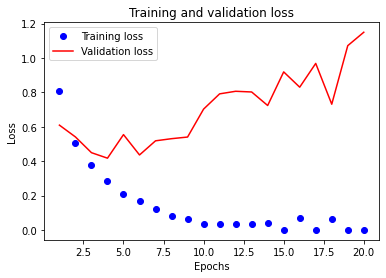

In [69]:
acc = history.history['binary_accuracy']
val_acc = history.history['val_binary_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(acc) + 1)

plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'r', label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

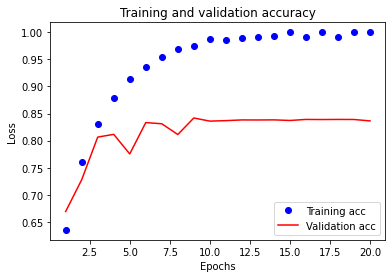

In [70]:
plt.clf()   # clear figure
acc_values = history_dict['binary_accuracy']
val_acc_values = history_dict['val_binary_accuracy']

plt.plot(epochs, acc, 'bo', label='Training acc')
plt.plot(epochs, val_acc, 'r', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

In [71]:
# evaluate the training model
loss, accuracy = model.evaluate(X_train, y_train, verbose=0)
print('loss: ', loss)
print('Accuracy: %f' % (accuracy*100))

loss:  2.8496500817709602e-05
Accuracy: 100.000000


In [72]:
# evaluate the validation model
loss, accuracy = model.evaluate(X_val, y_val, verbose=0)
print('loss: ', loss)
print('Accuracy: %f' % (accuracy*100))

loss:  1.149704933166504
Accuracy: 83.639997


In [73]:
# evaluate the testing model
loss, accuracy = model.evaluate(X_test, y_test, verbose=0)
print('loss: ', loss)
print('Accuracy: %f' % (accuracy*100))

loss:  1.2381997108459473
Accuracy: 83.146667
